In [40]:
import random
import numpy as np
import matplotlib.pyplot as plt
import pyvista as pv
from tqdm.auto import tqdm
import tensorflow as tf
import imageio
from jmetal.core.problem import FloatProblem
from jmetal.core.solution import FloatSolution
from jmetal.algorithm.multiobjective.nsgaii import NSGAII
from jmetal.operator import SBXCrossover, PolynomialMutation
from jmetal.util.termination_criterion import StoppingByEvaluations
from jmetal.util.observer import ProgressBarObserver

In [20]:
RES = 500
lim = 5.0
tf.random.set_seed(42)
max_evaluations = 2500

In [3]:
class Hills(tf.Module):

    def __init__(
        self, 
        x_min=-5.0, 
        x_max=5.0, 
        y_min=-5.0, 
        y_max=5.0, 
        radius_min=0.5,
        radius_max=2.0,
        height_min=0.1,
        height_max=1.0,
        n_hills=50,
    ):
        super().__init__()
        self.x0 = tf.random.uniform([1, n_hills], x_min, x_max, dtype=tf.float32)
        self.y0 = tf.random.uniform([1, n_hills], y_min, y_max, dtype=tf.float32)
        self.radius = tf.random.uniform([1, n_hills], radius_min, radius_max, dtype=tf.float32)
        self.height = tf.random.uniform([1, n_hills], height_min, height_max, dtype=tf.float32)
        
    #def cast(self, var, input_var):
    #    result = tf.ones_like(x)

    @tf.function(input_signature=[
        tf.TensorSpec([None,1], tf.float32),
        tf.TensorSpec([None,1], tf.float32),
    ])
    #@tf.function
    def __call__(self, x, y):
        print('Tracing with', x, y)
        distance = tf.sqrt((x - self.x0)**2 + (y - self.y0)**2)
        hills = self.height * tf.exp(-distance**2 / self.radius**2)
        return tf.math.reduce_sum(hills, axis=-1, keepdims=True)

In [4]:
hills = Hills(-lim, lim, -lim, lim)

In [4]:
x = np.linspace(-lim, lim, RES, dtype=np.float32)
y = np.linspace(-lim, lim, RES, dtype=np.float32)
X, Y = np.meshgrid(x, y)

In [5]:
Z = hills(tf.reshape(X, (-1,1)), tf.reshape(Y, (-1,1))).numpy().reshape(X.shape)

Tracing with Tensor("x:0", shape=(None, 1), dtype=float32) Tensor("y:0", shape=(None, 1), dtype=float32)


2024-03-17 15:10:29.422136: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


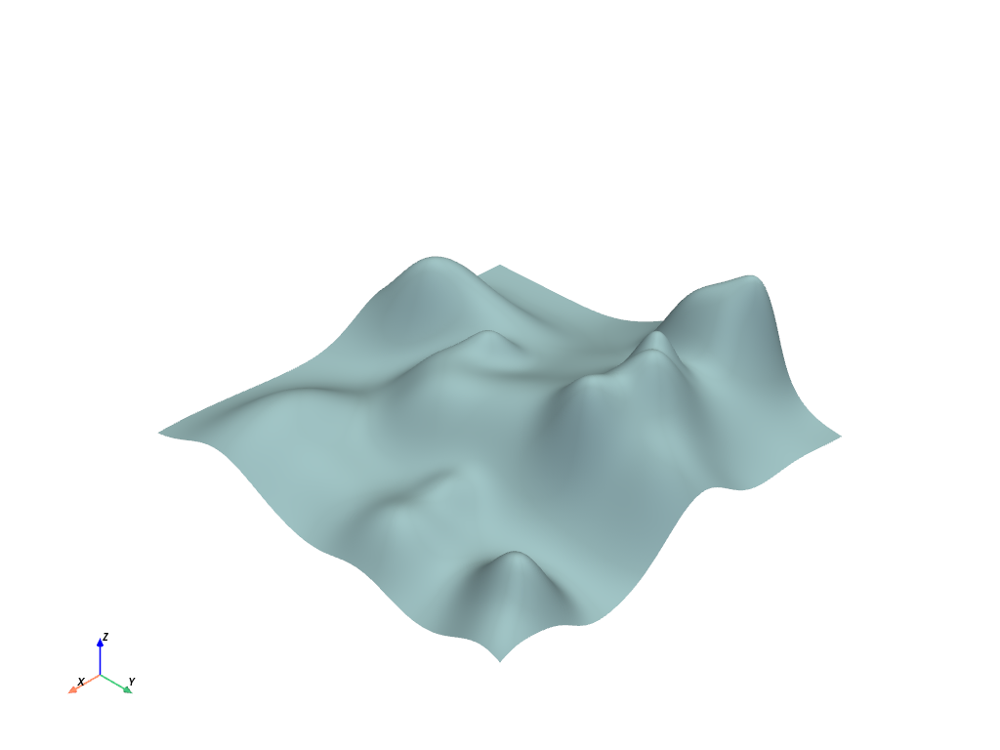

In [7]:
grid = pv.StructuredGrid(X, Y, Z)
grid.plot()

In [8]:
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.03)

  0%|          | 0/100 [00:00<?, ?it/s]

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


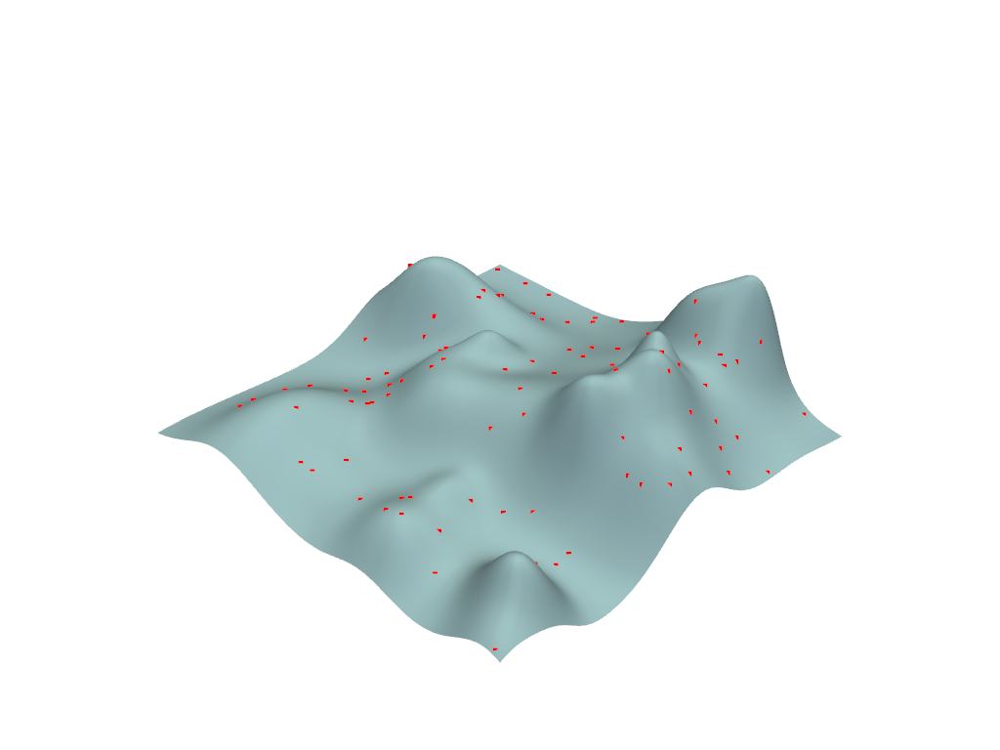

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


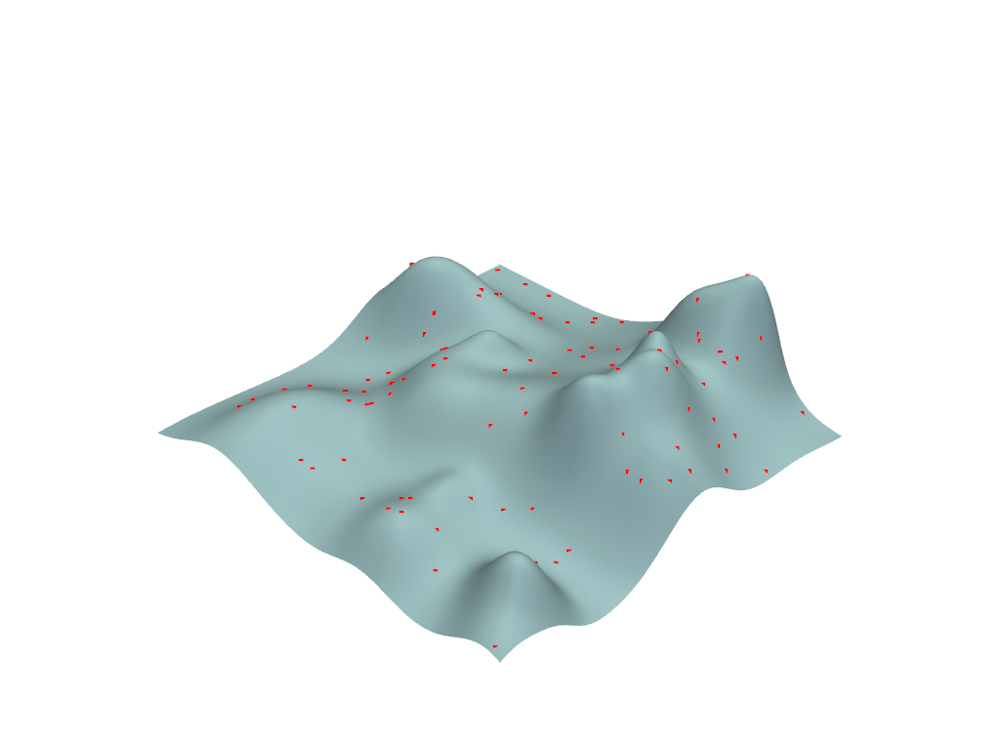

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


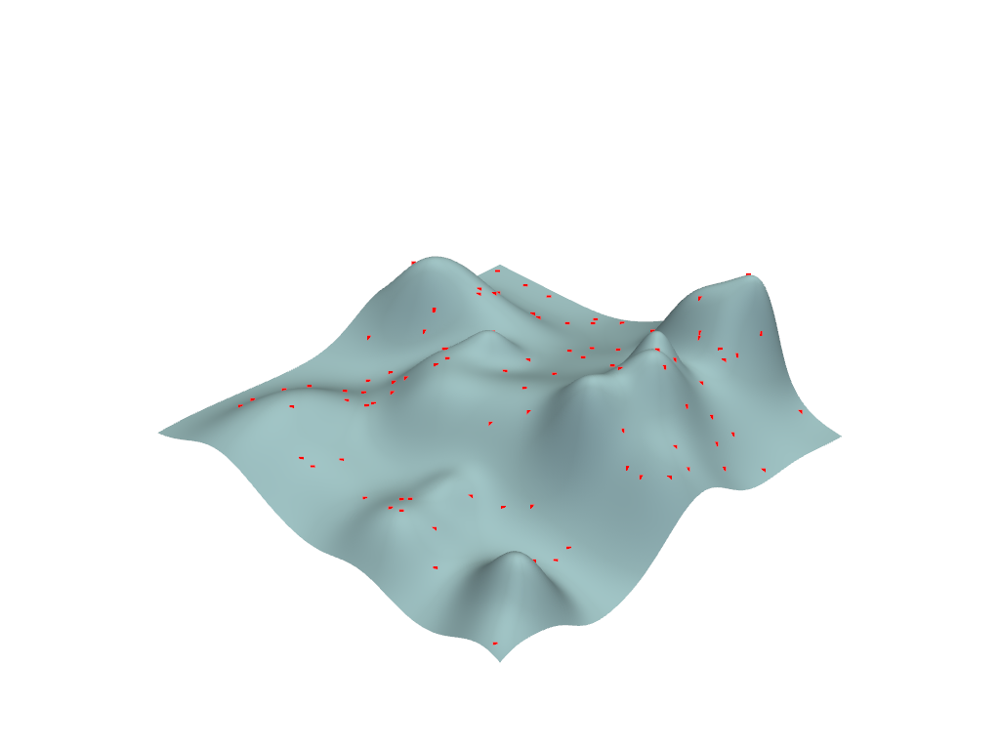

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


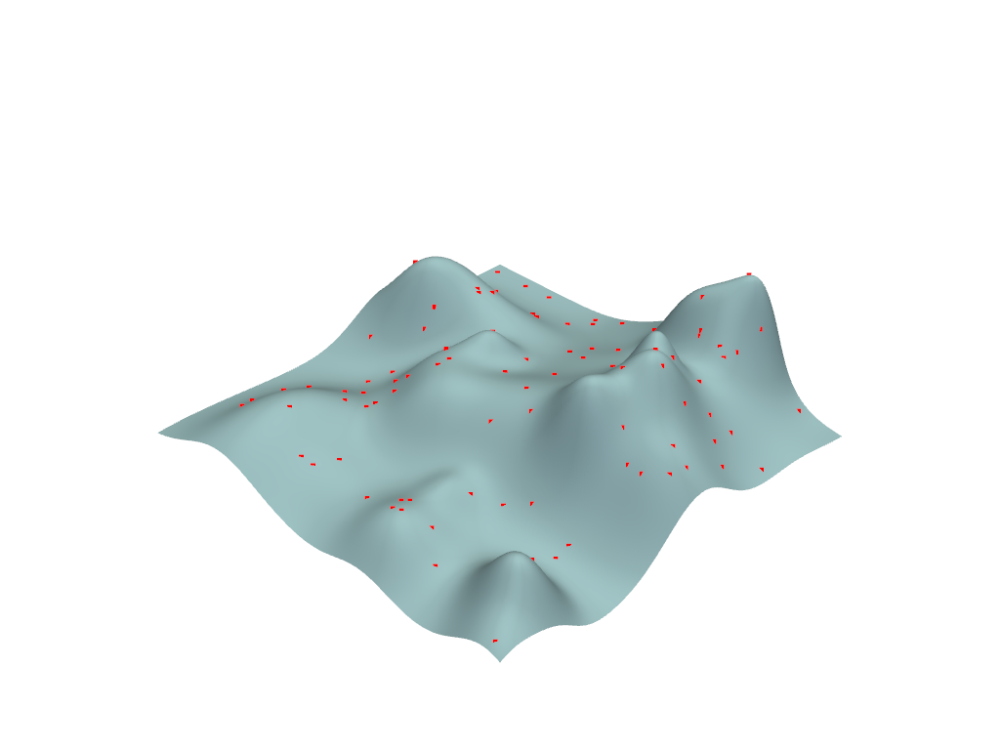

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


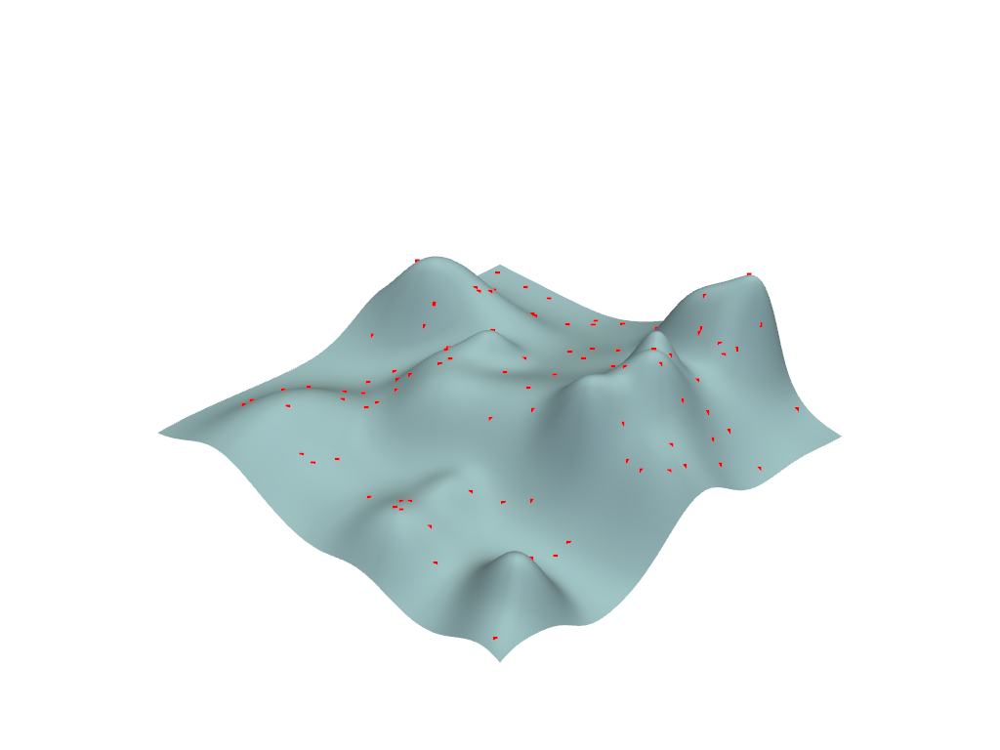

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


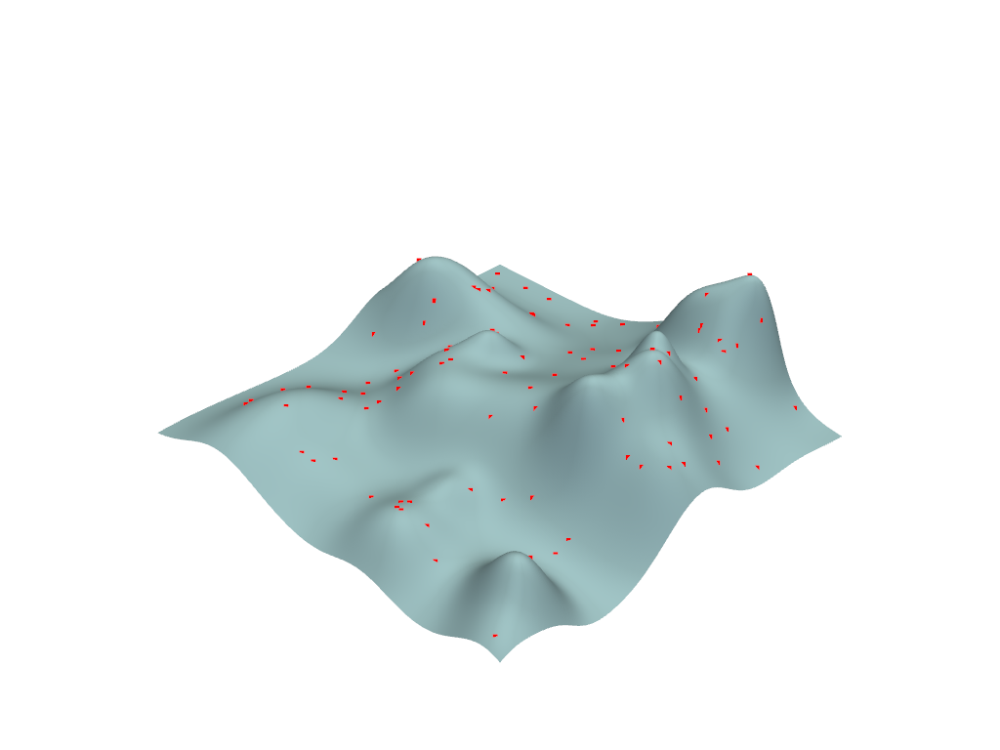

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


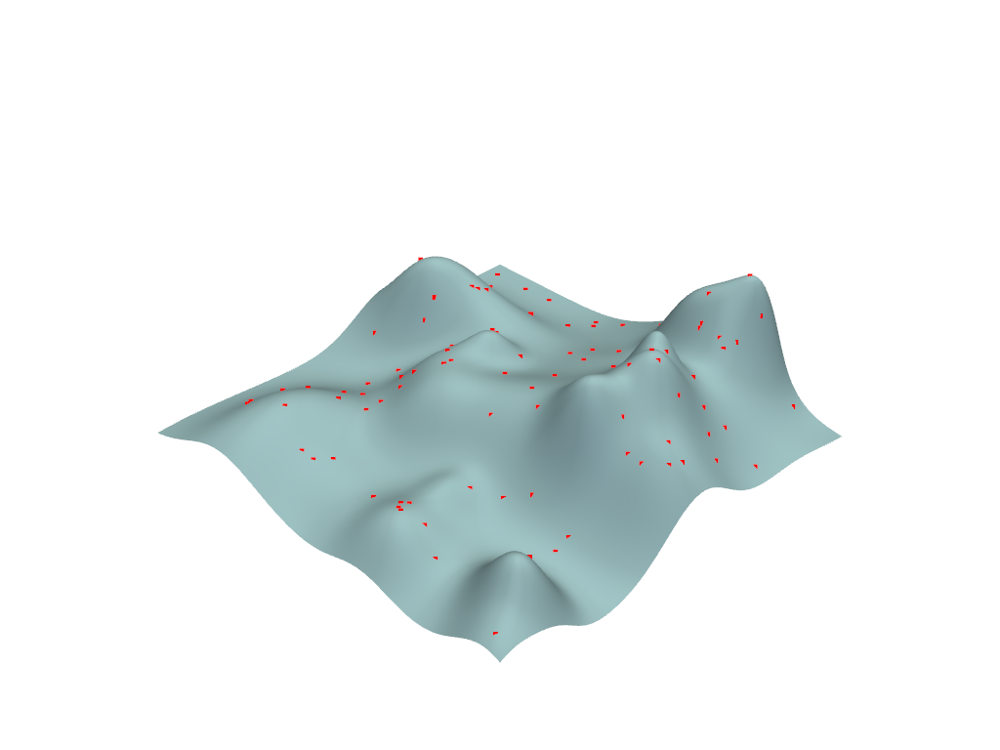

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


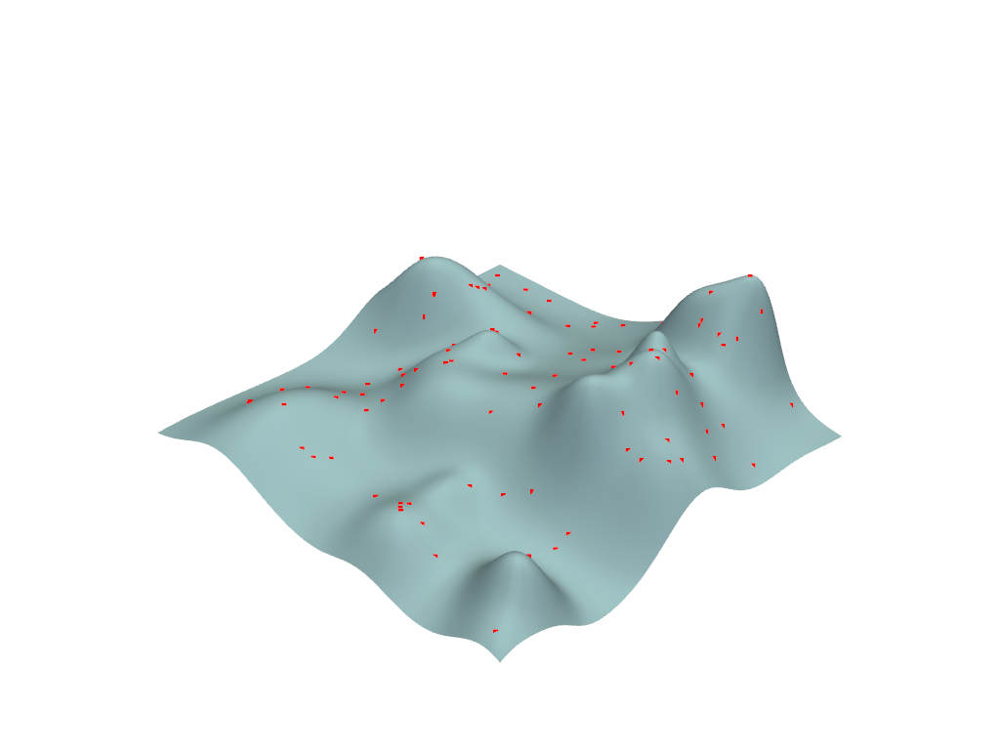

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


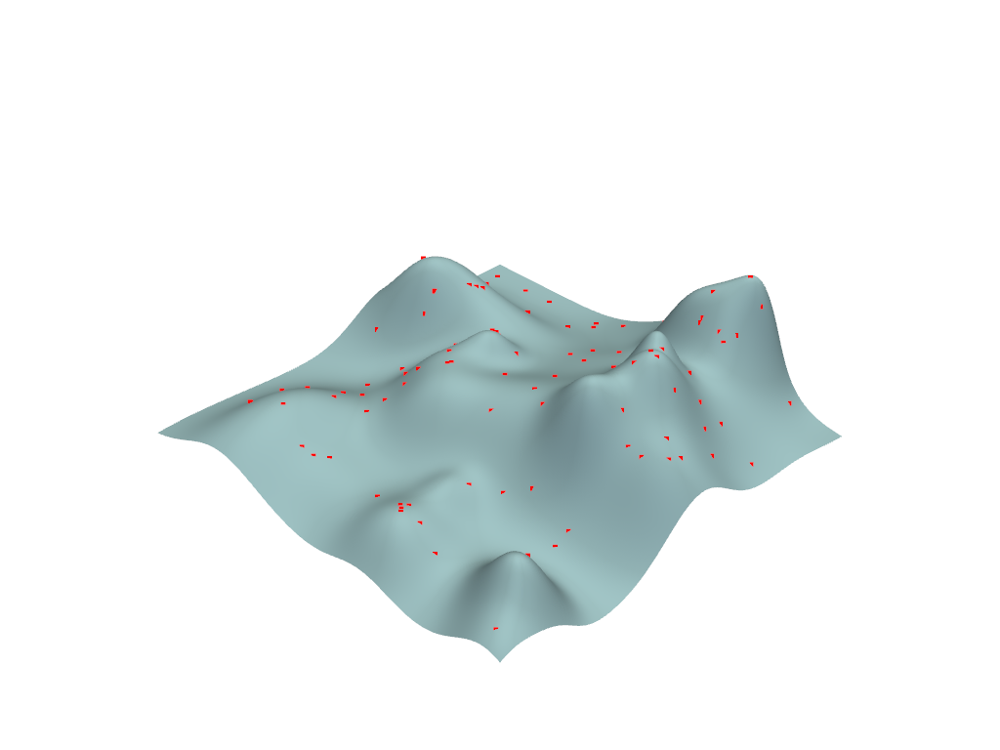

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


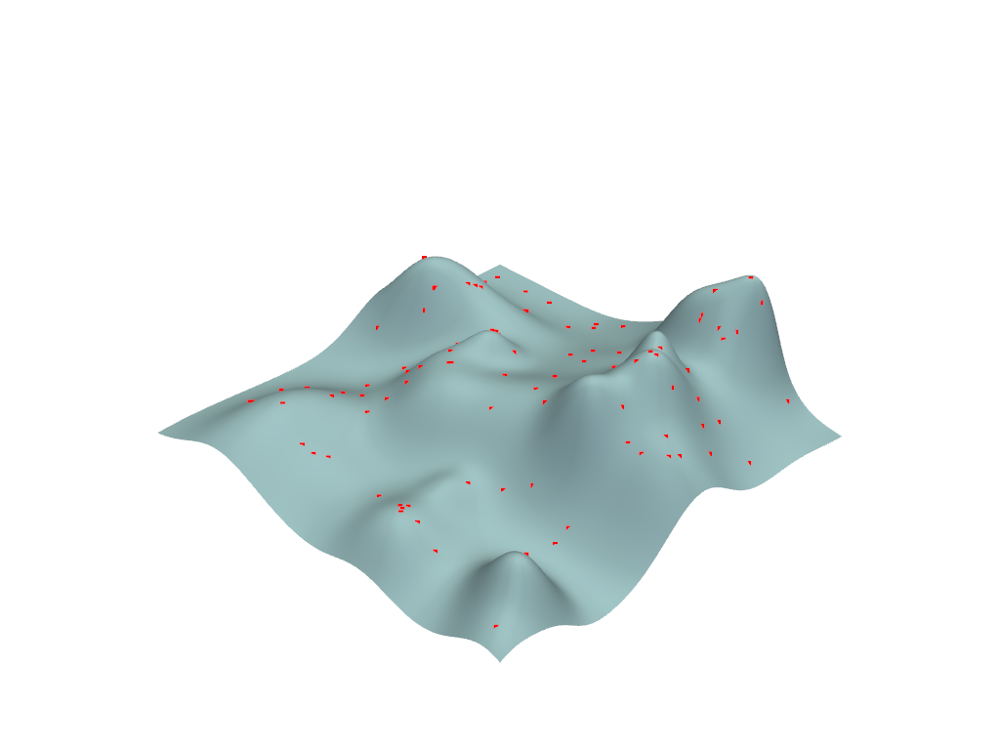

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


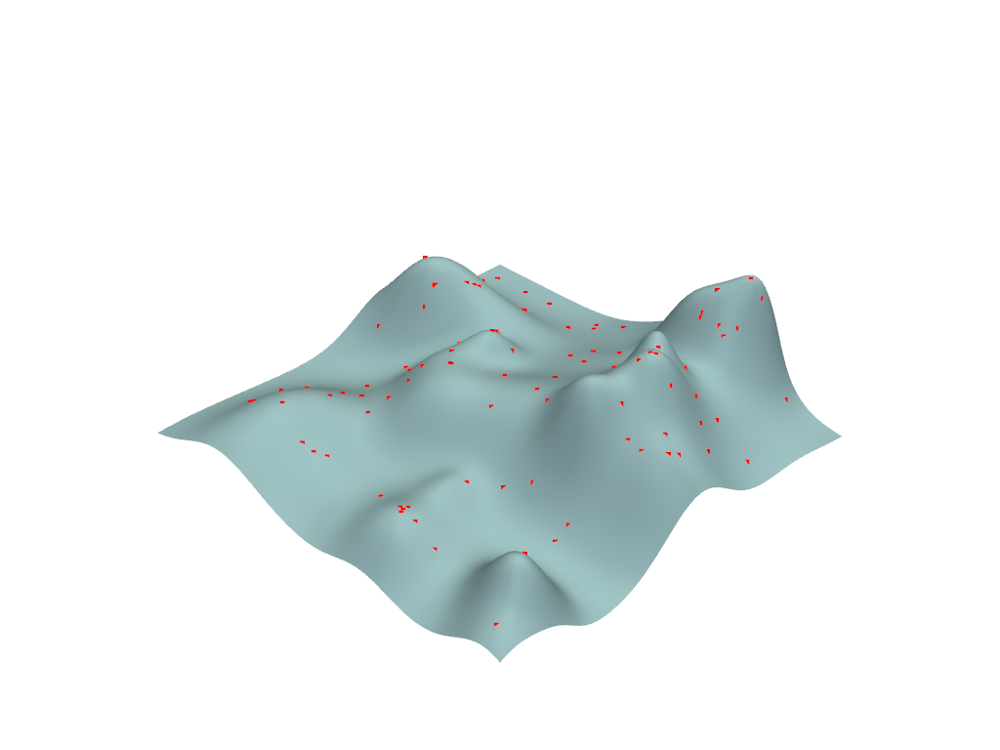

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


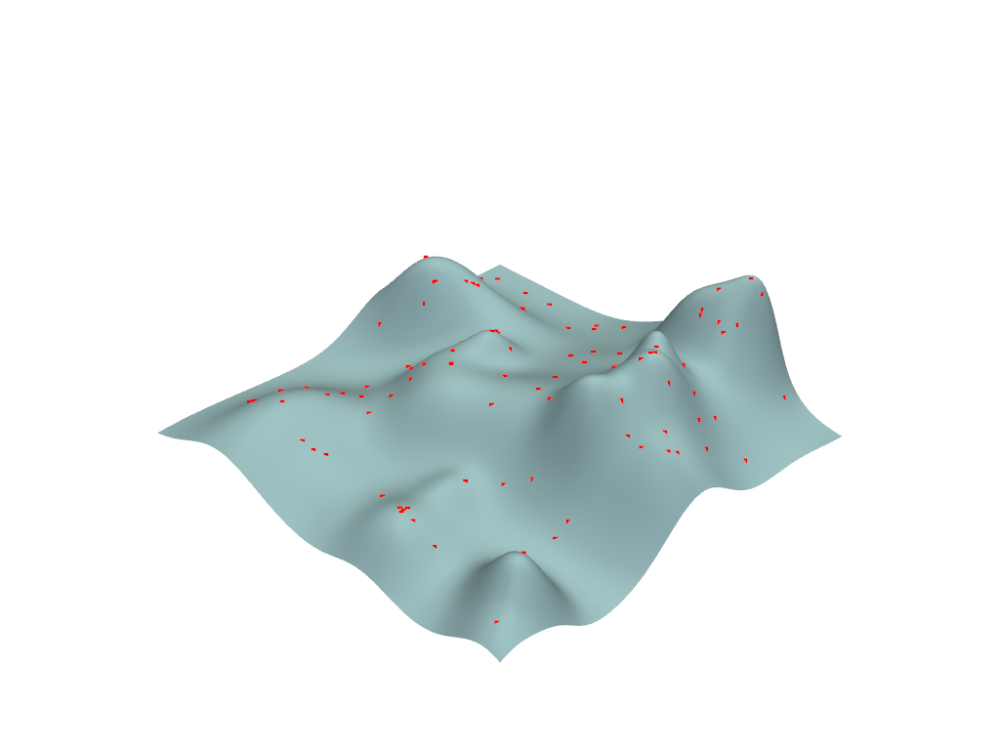

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


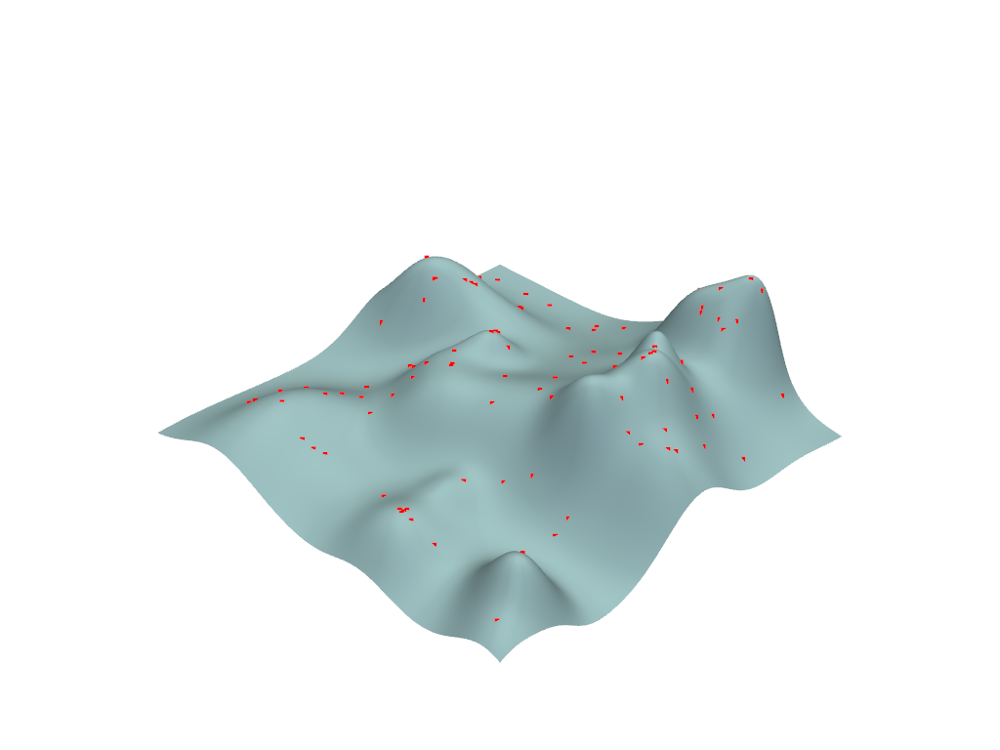

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


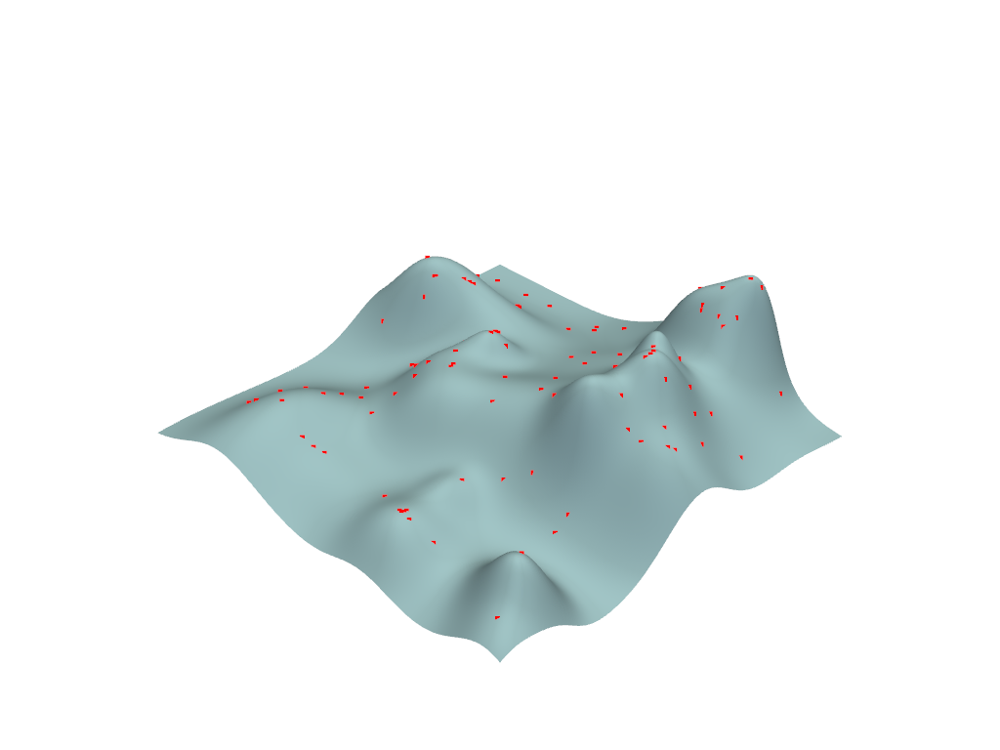

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


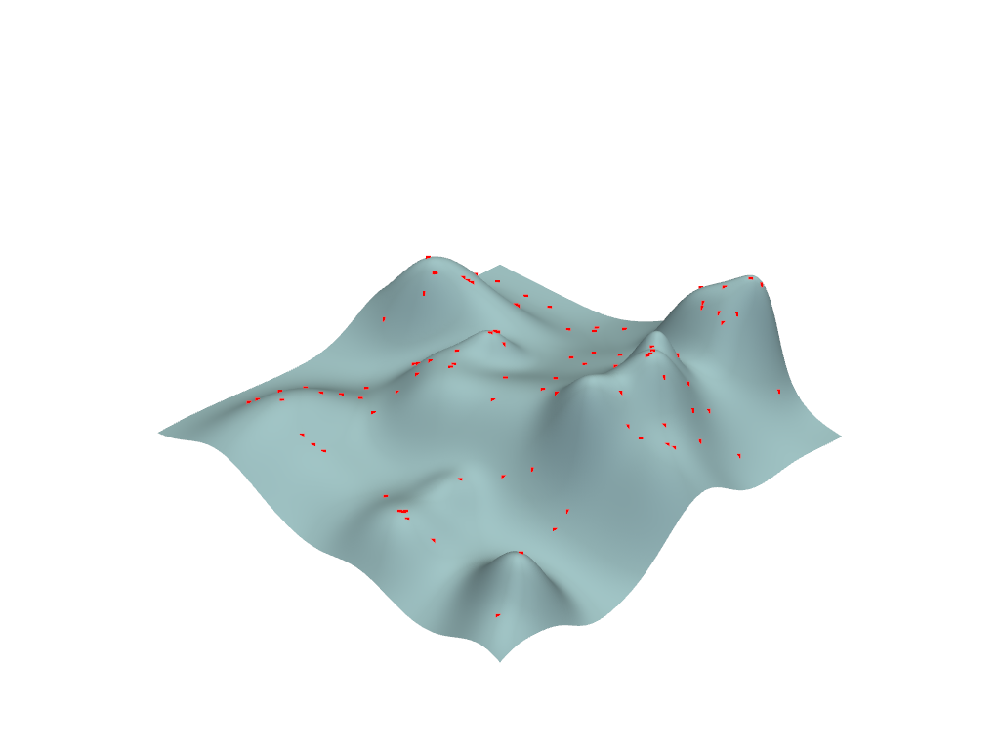

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


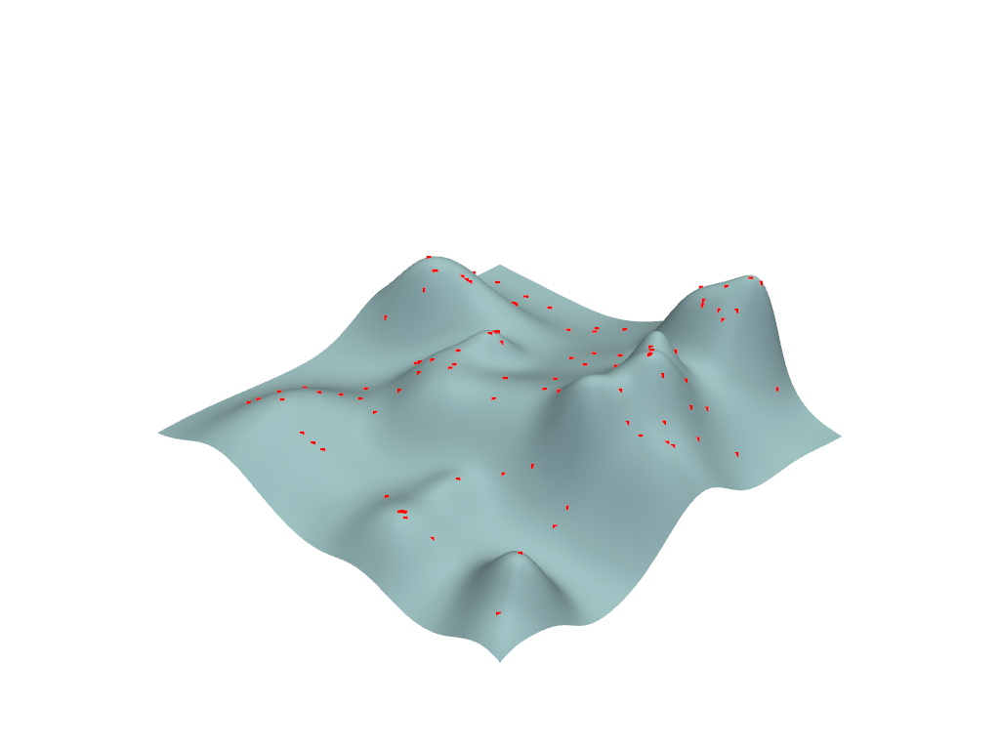

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


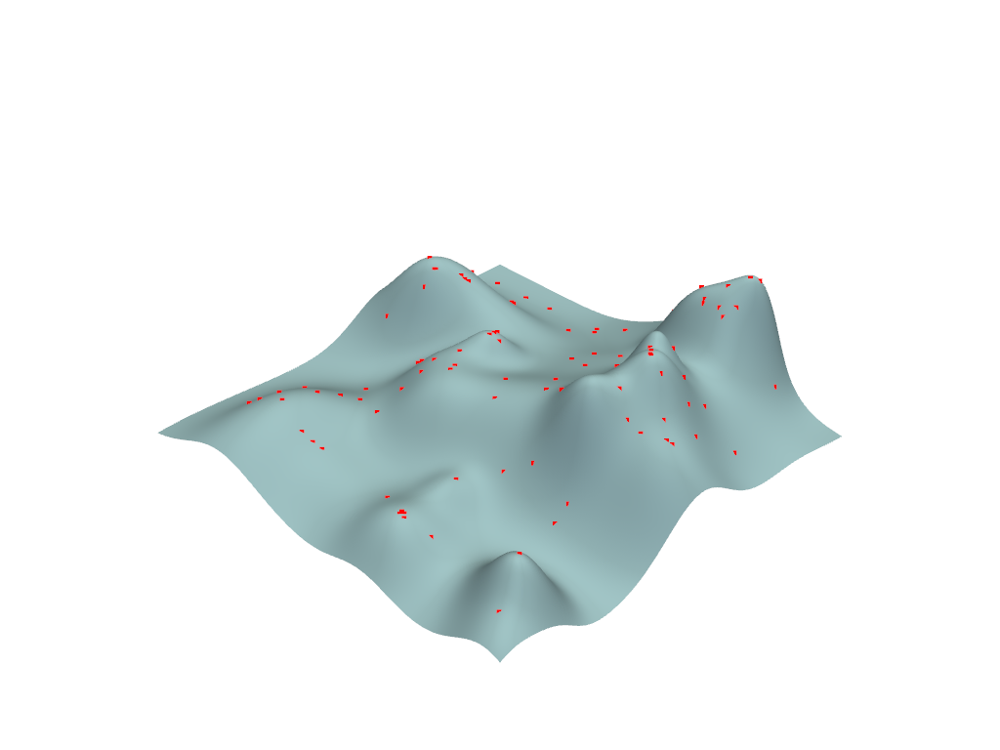

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


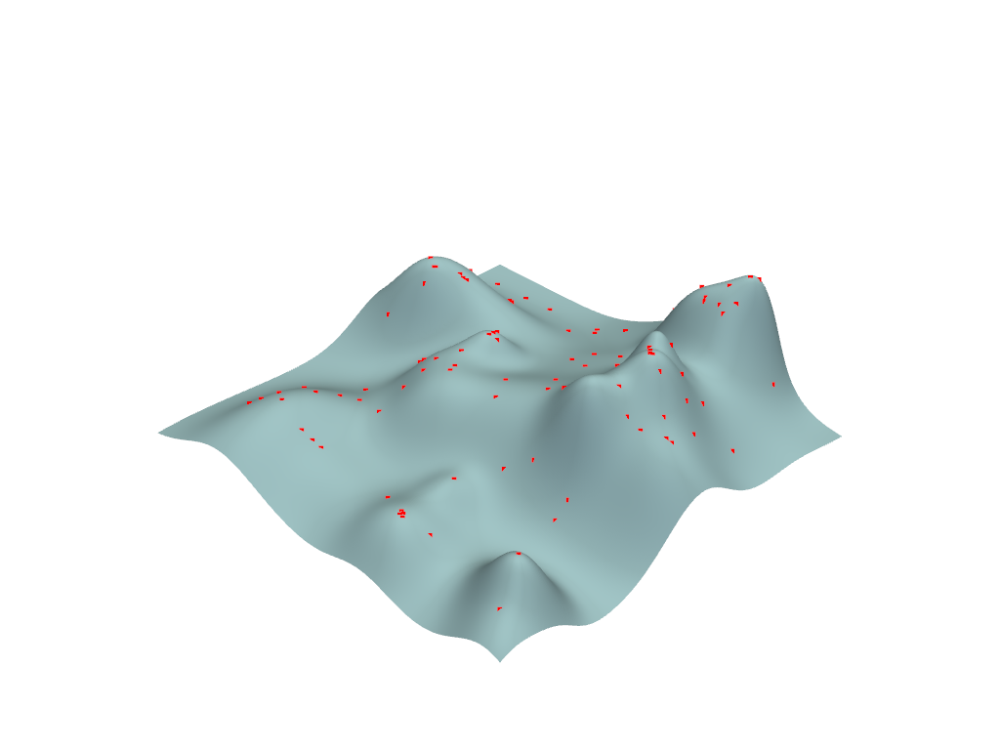

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


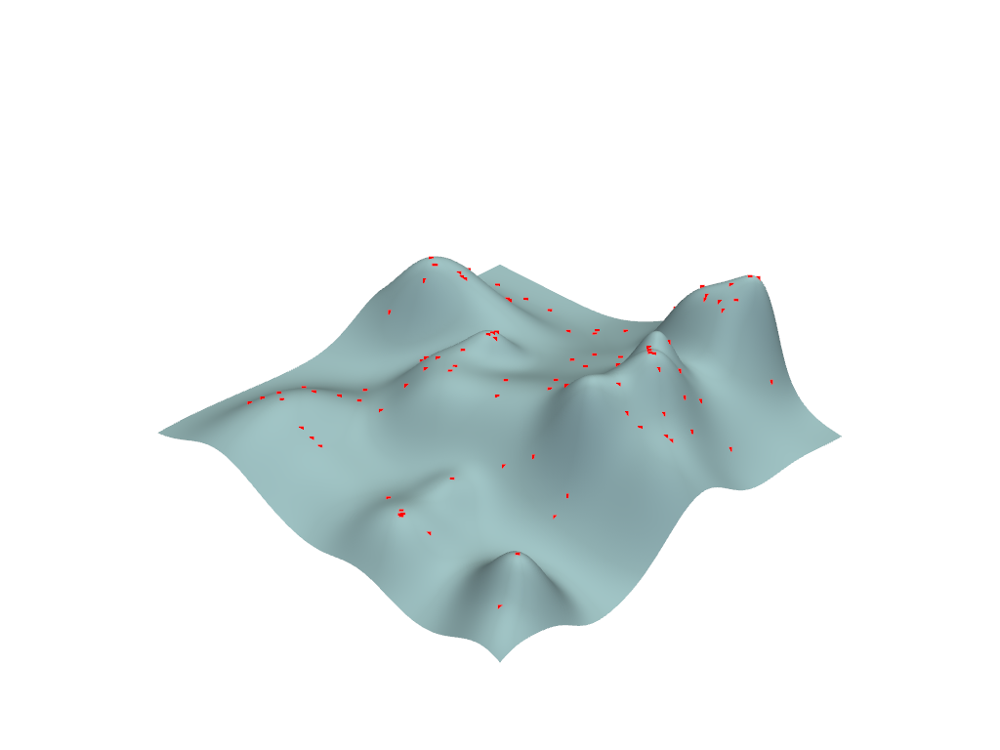

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


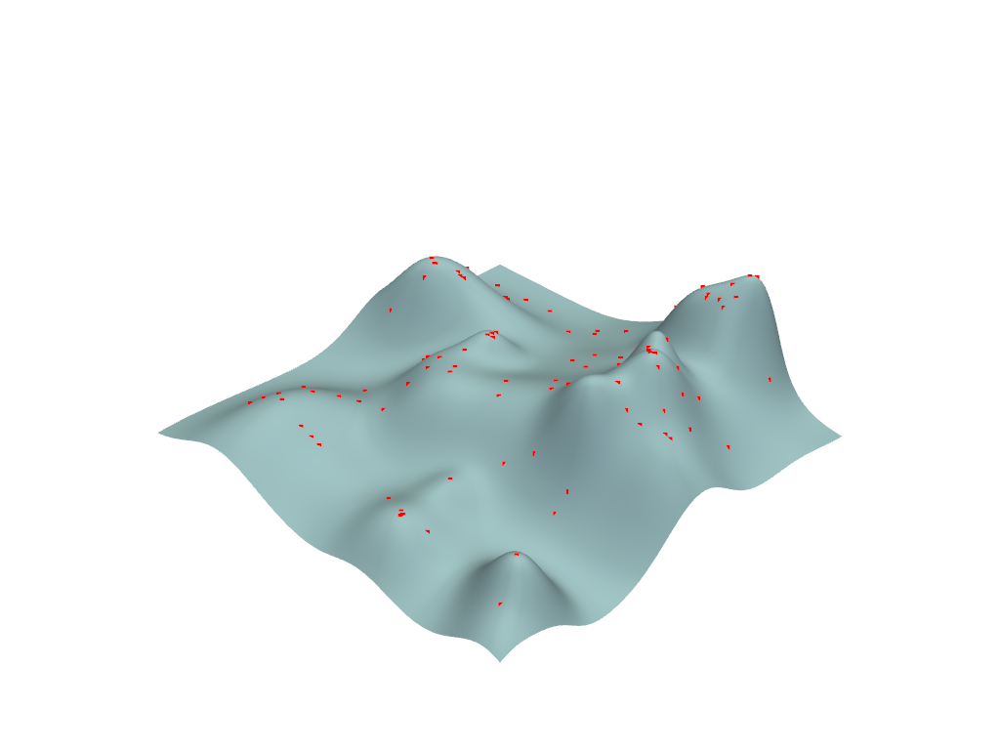

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


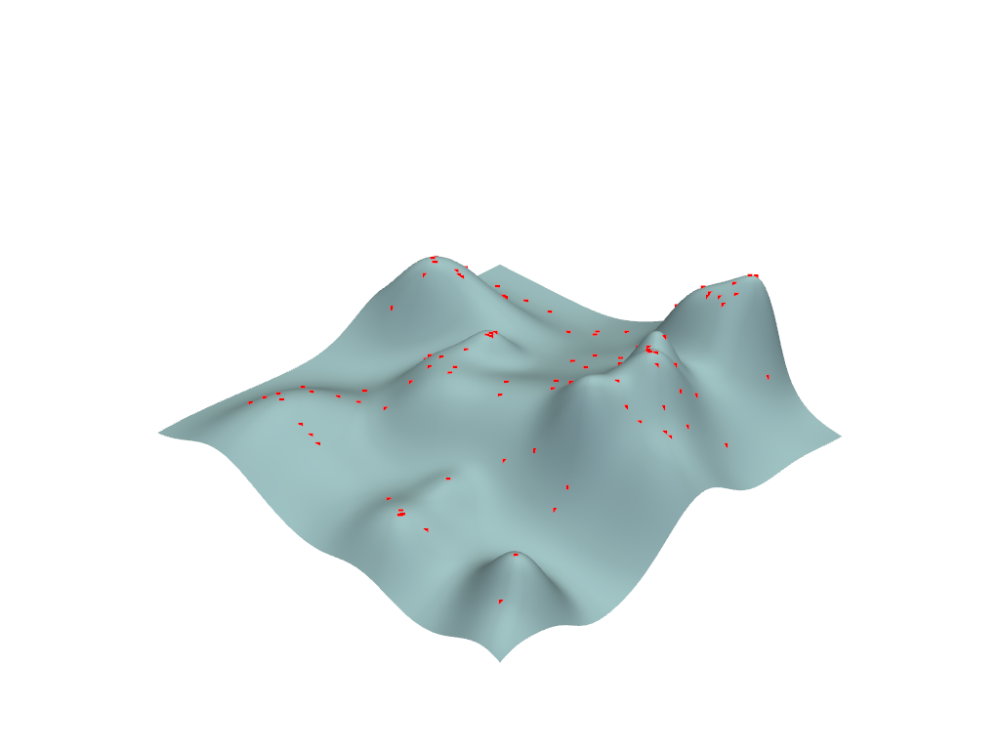

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


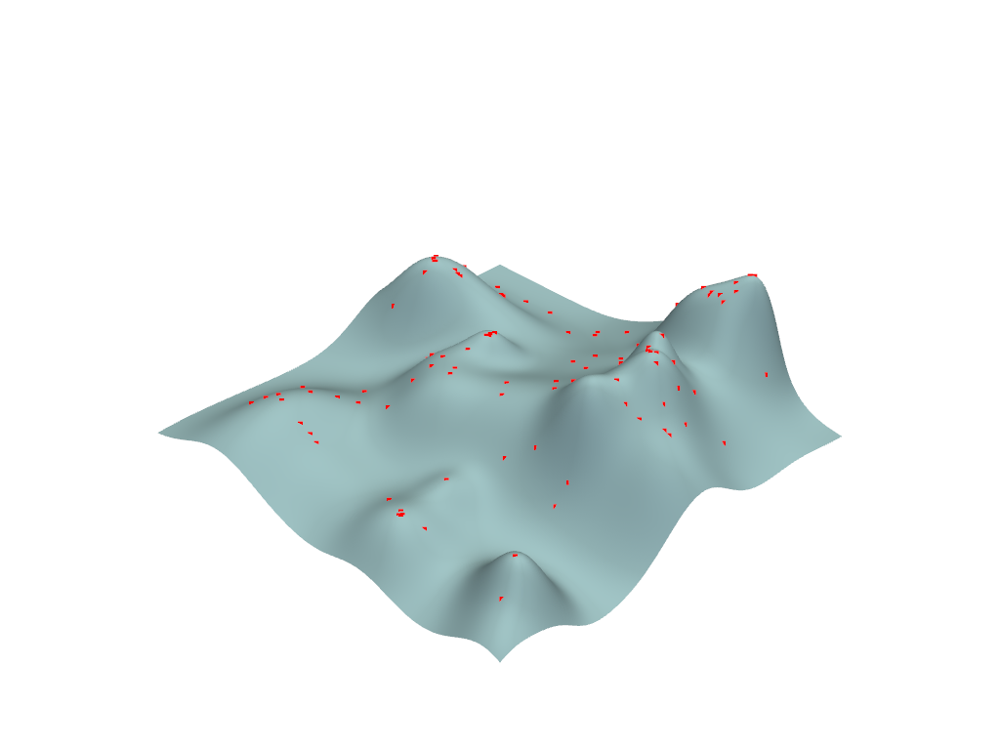

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


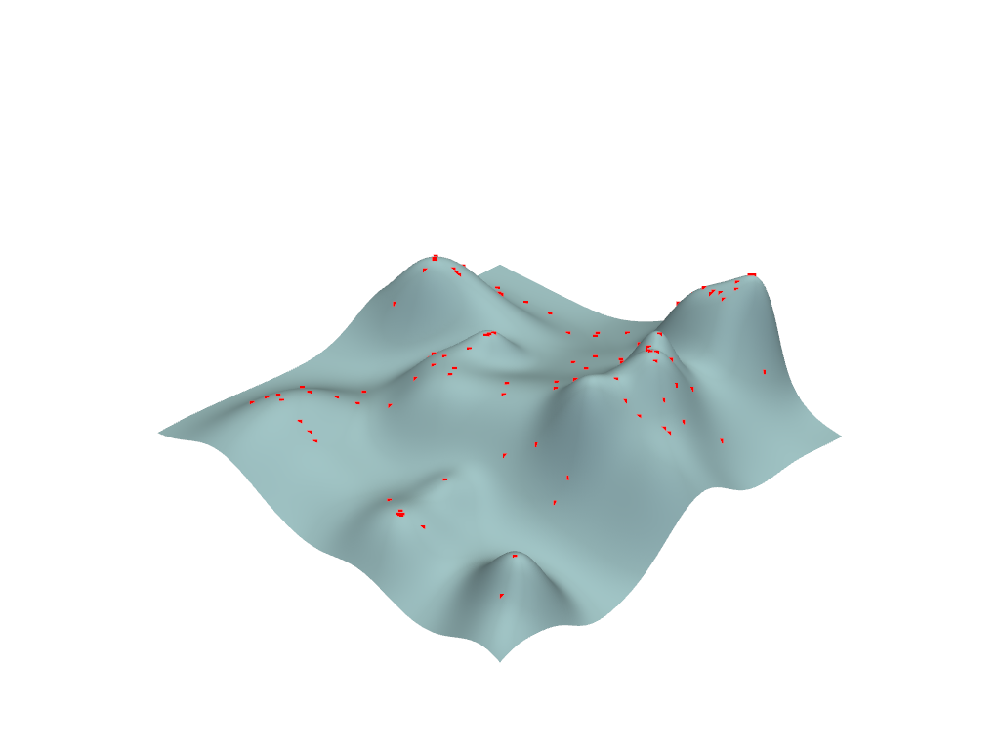

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


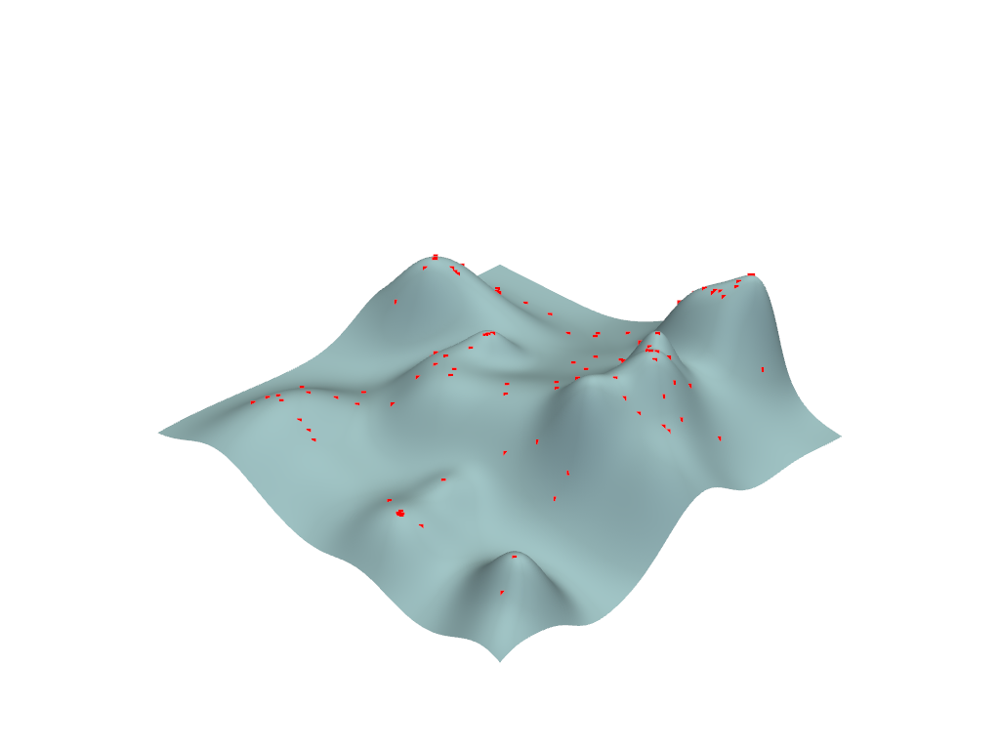

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


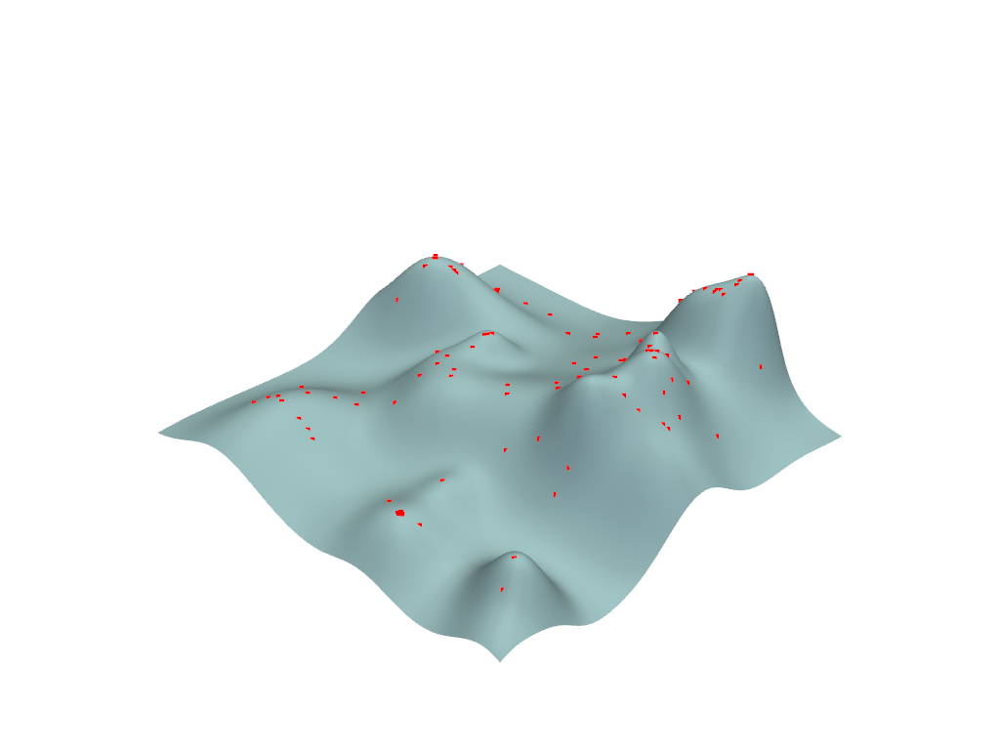

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


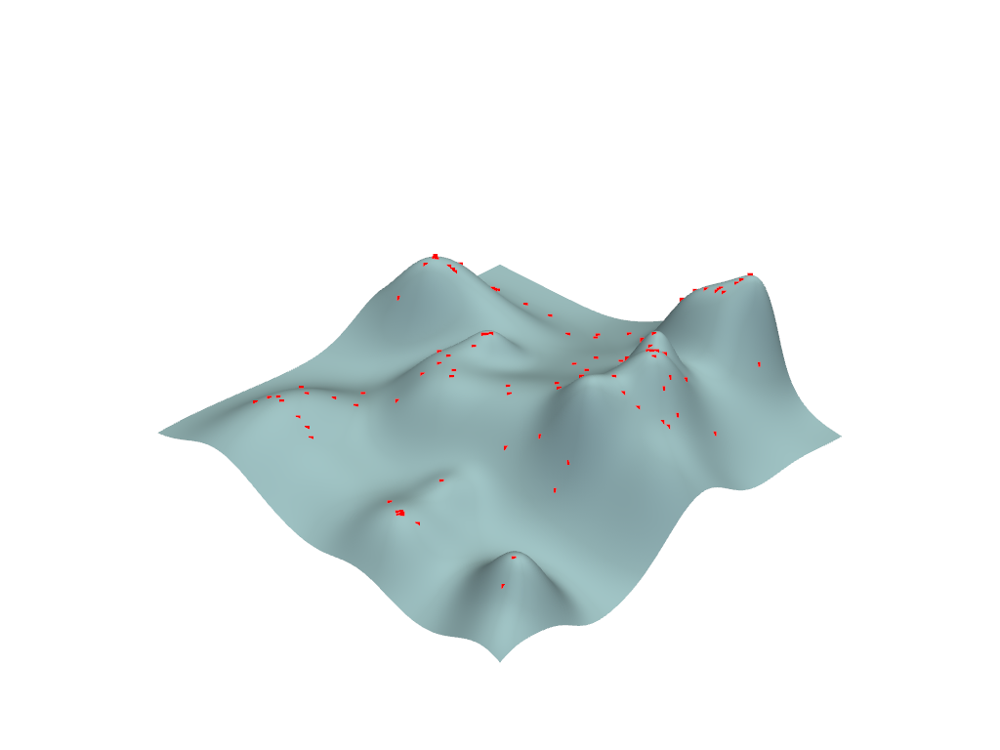

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


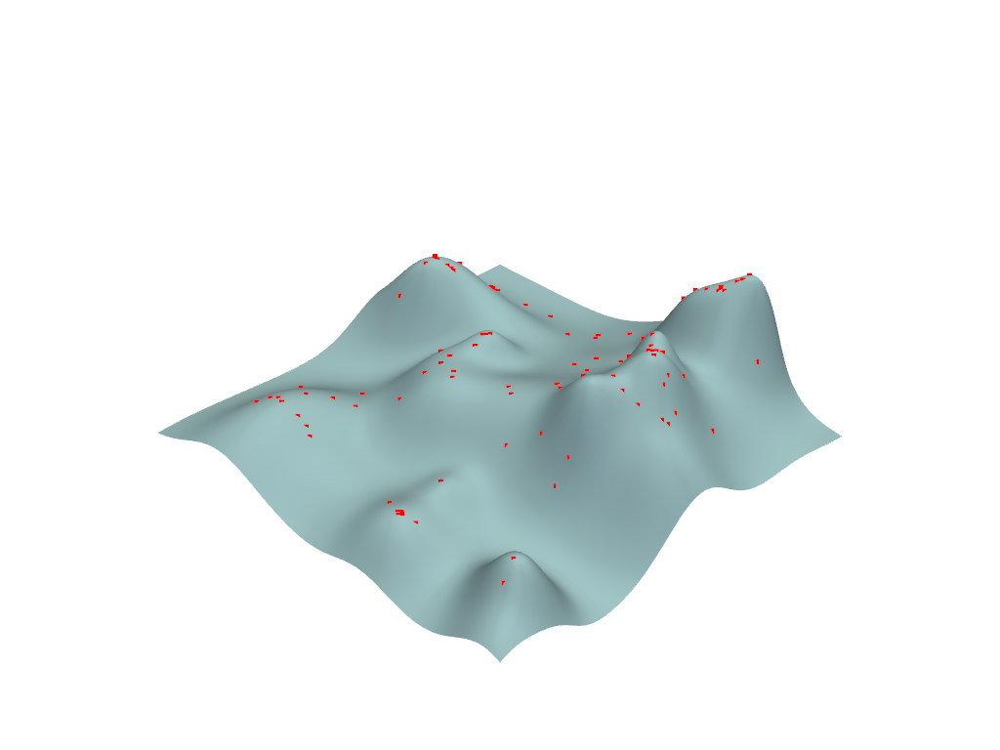

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


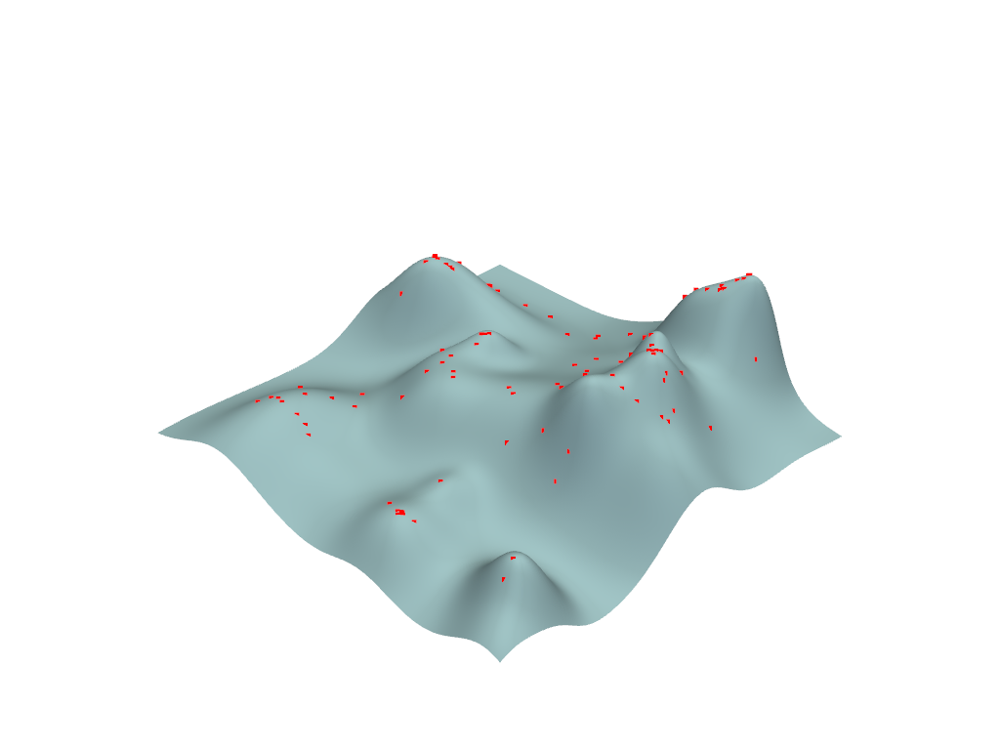

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


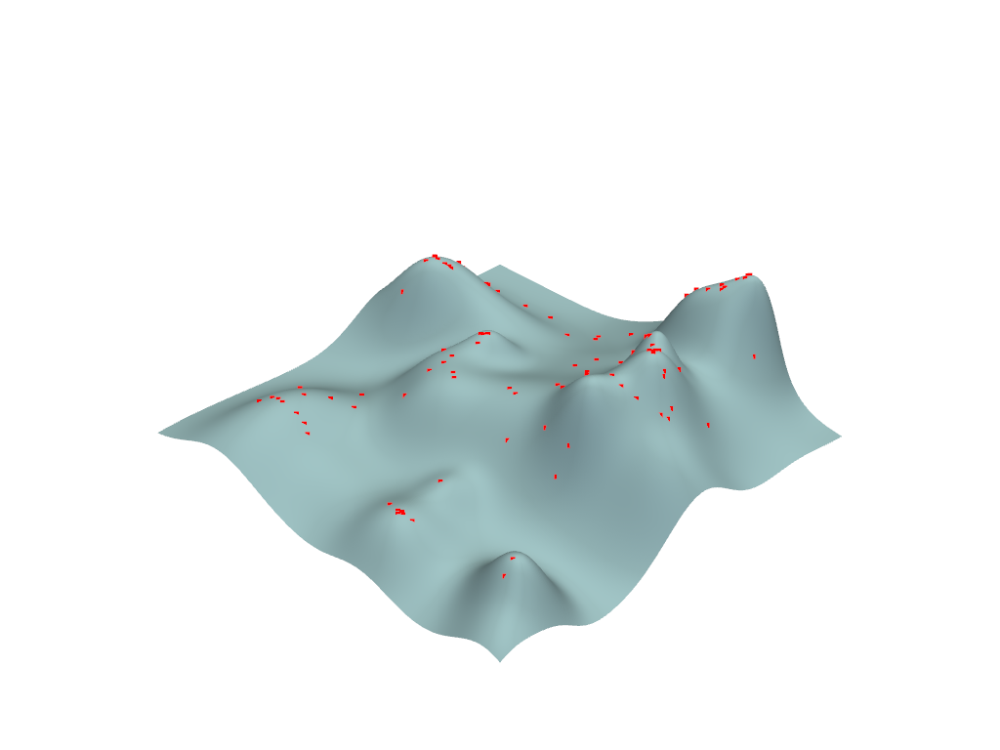

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


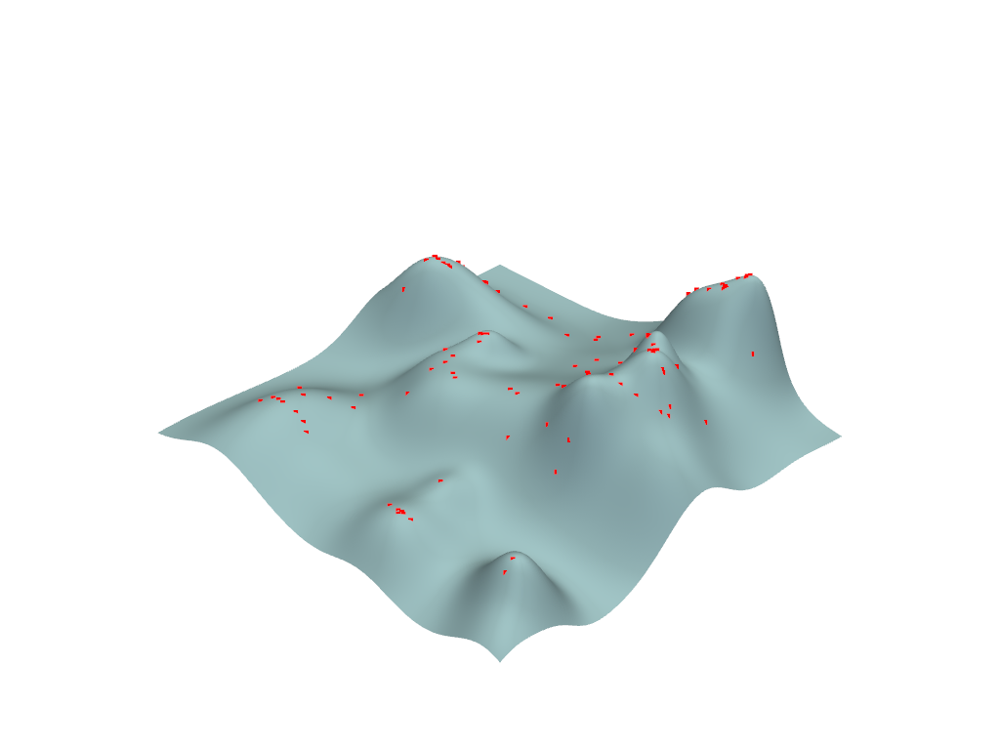

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


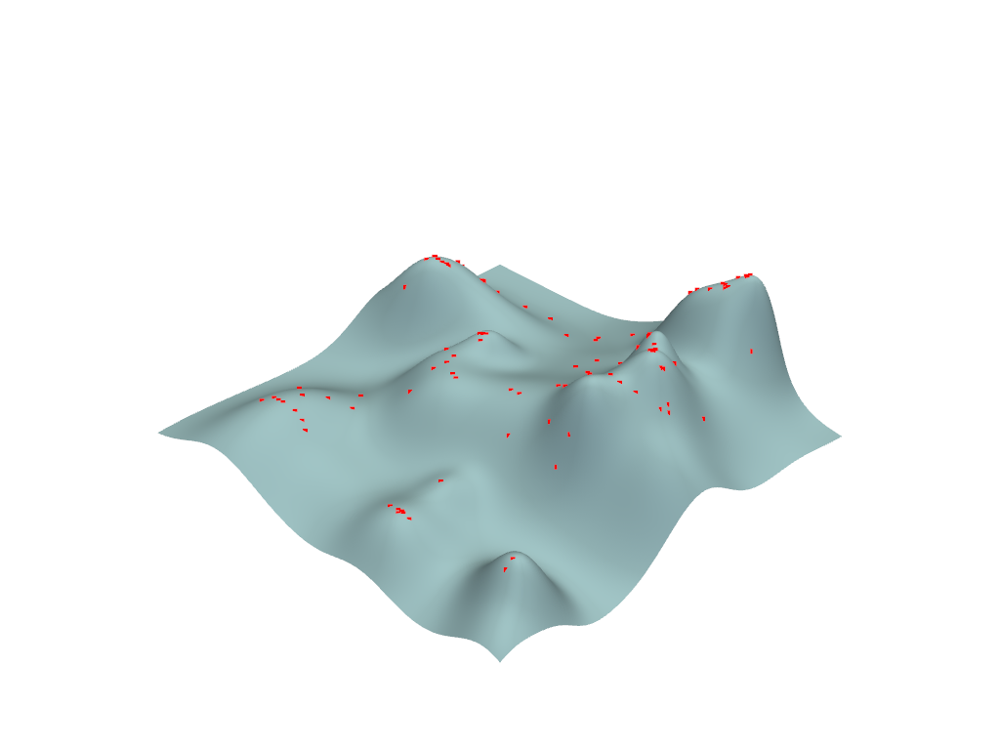

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


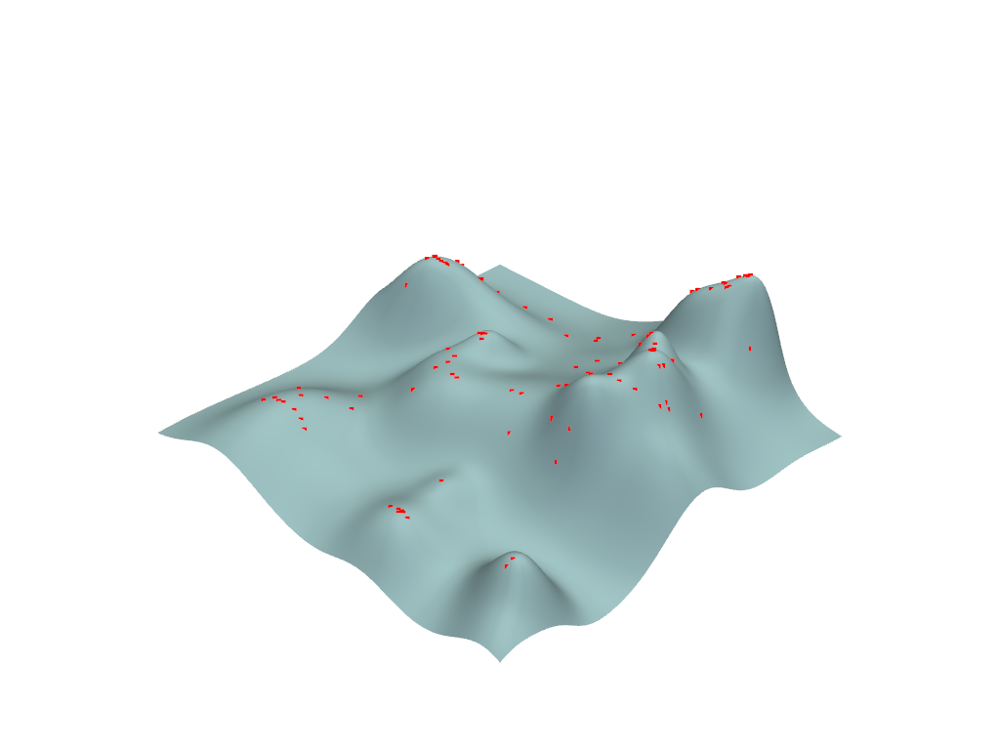

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


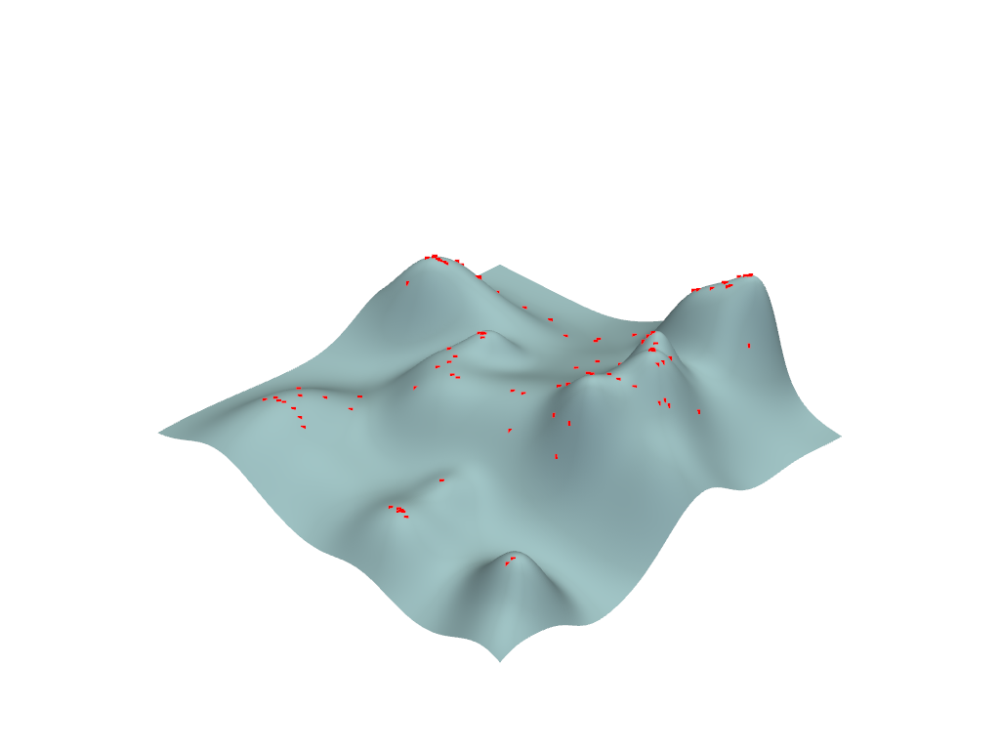

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


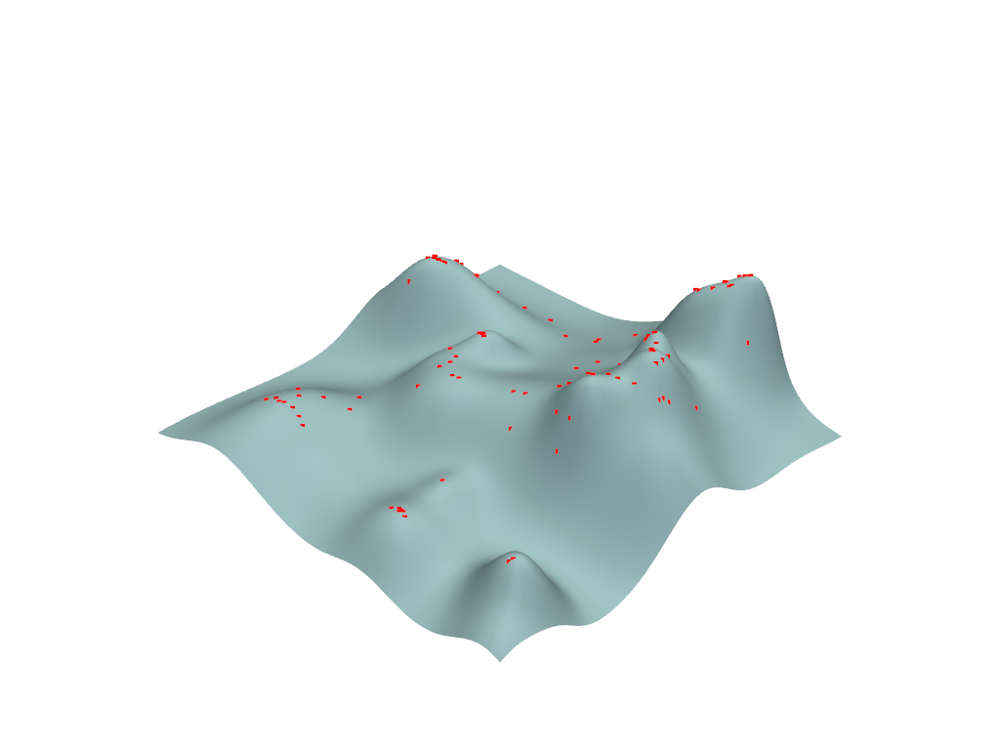

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


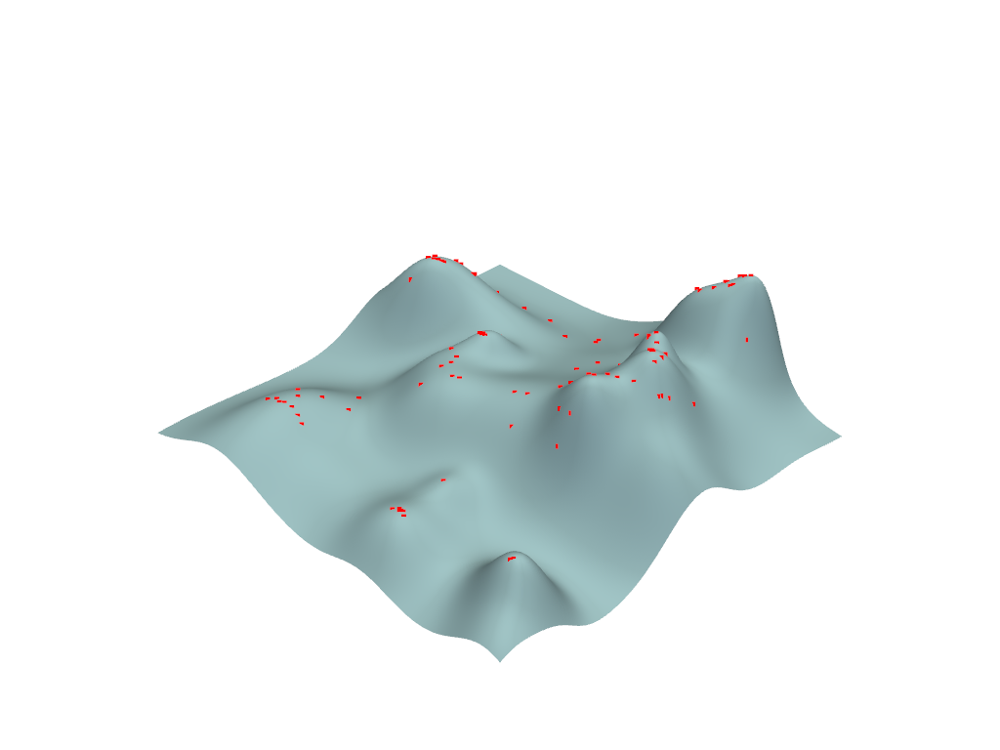

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


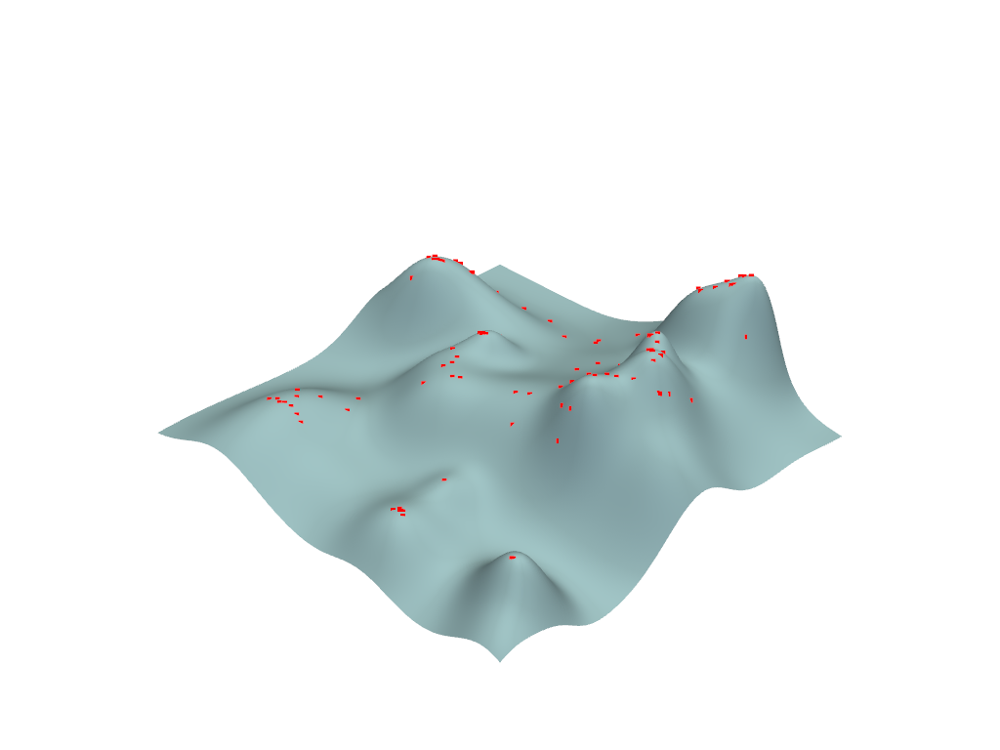

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


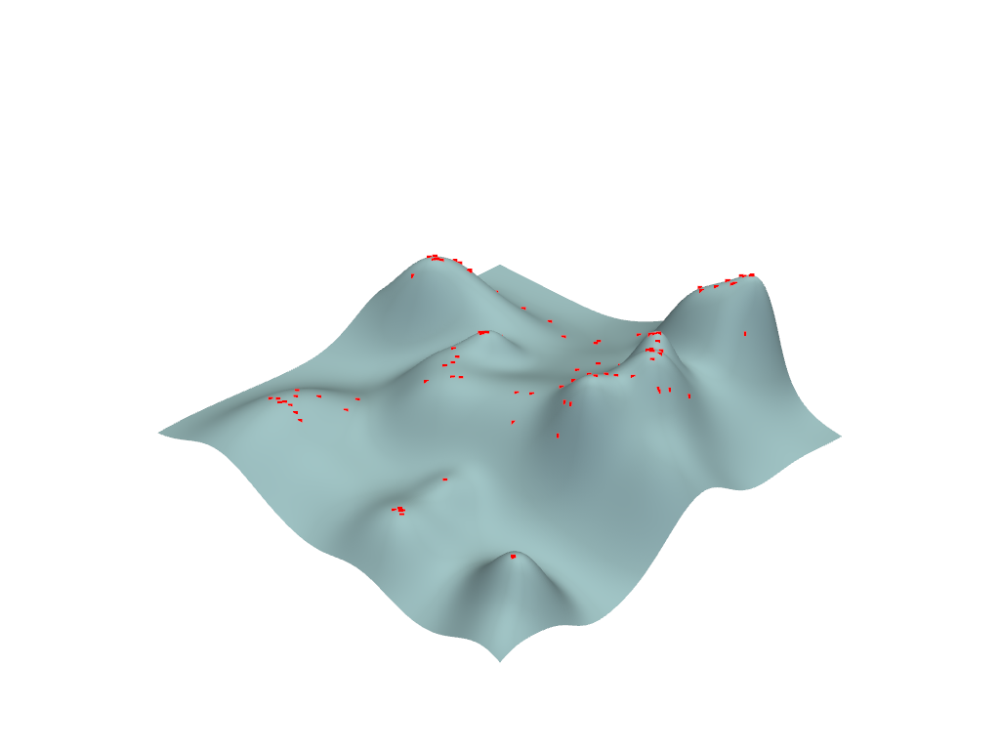

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


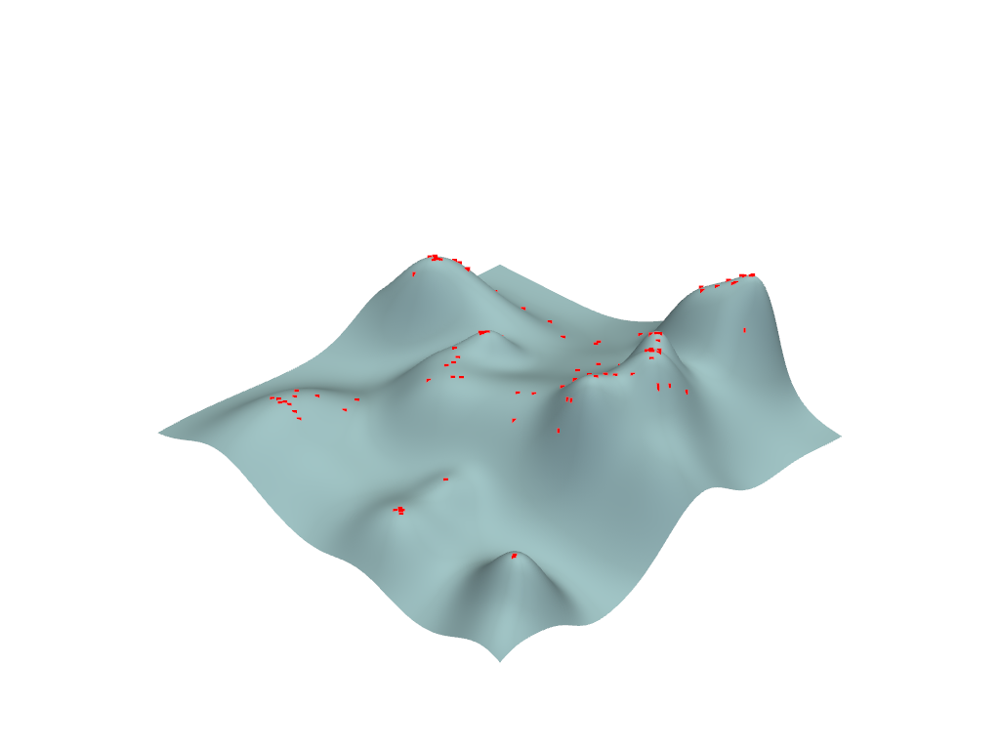

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


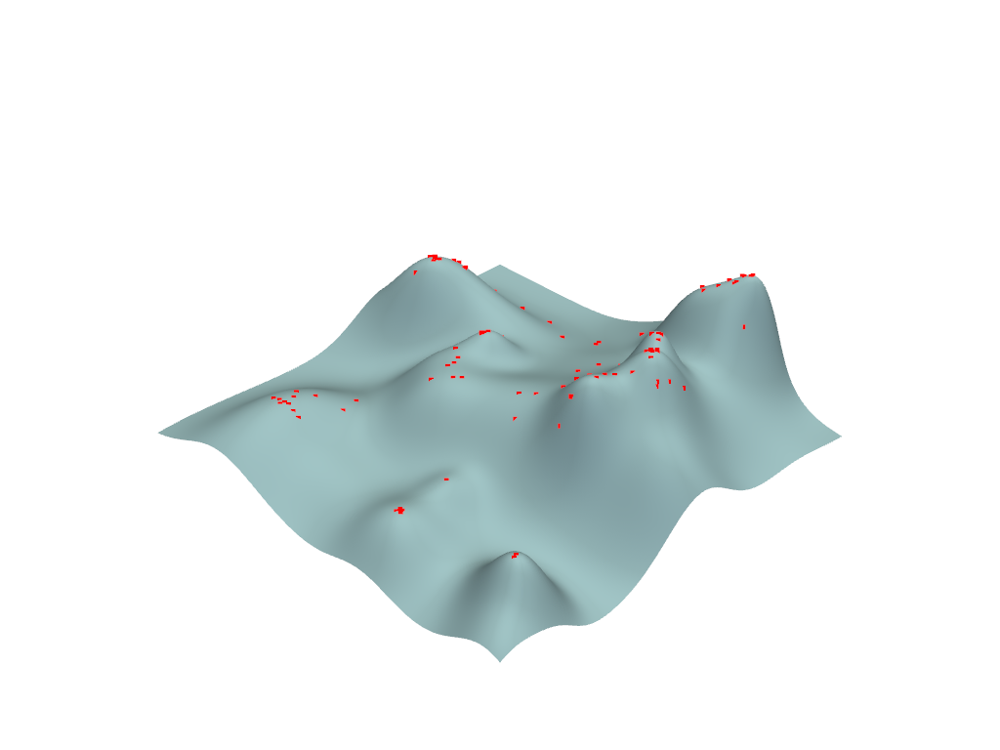

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


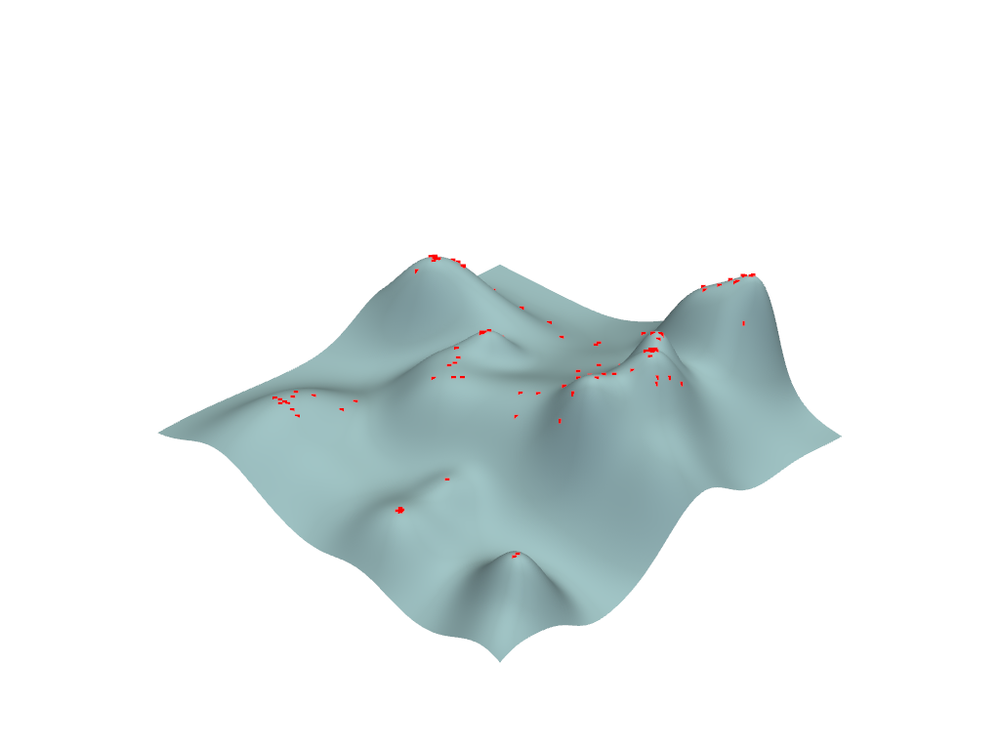

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


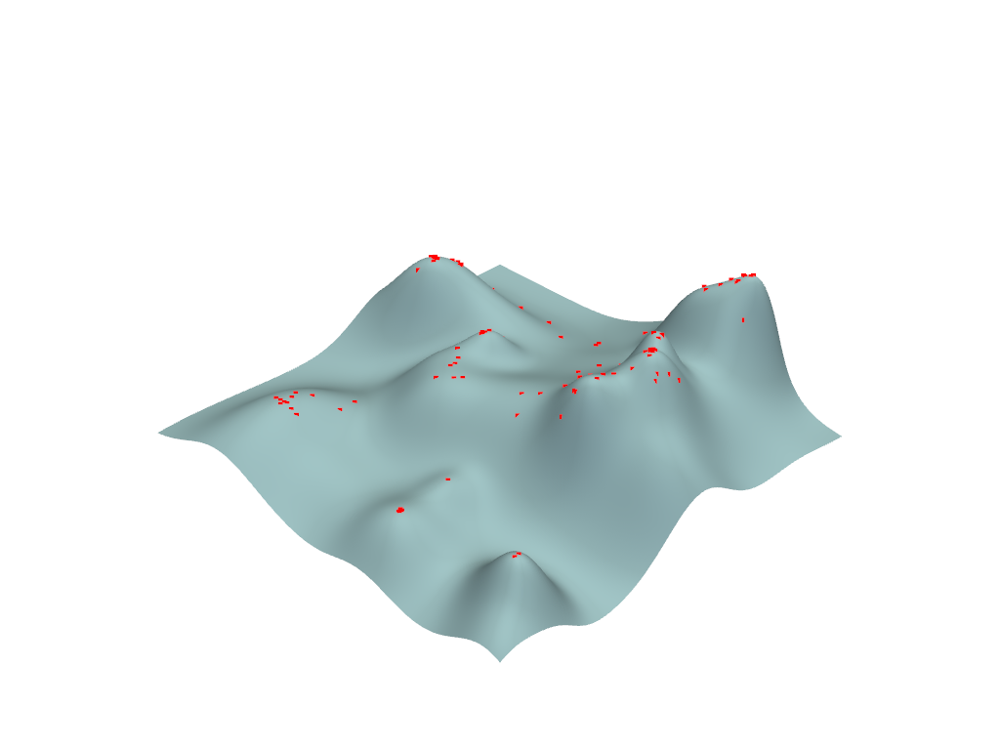

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


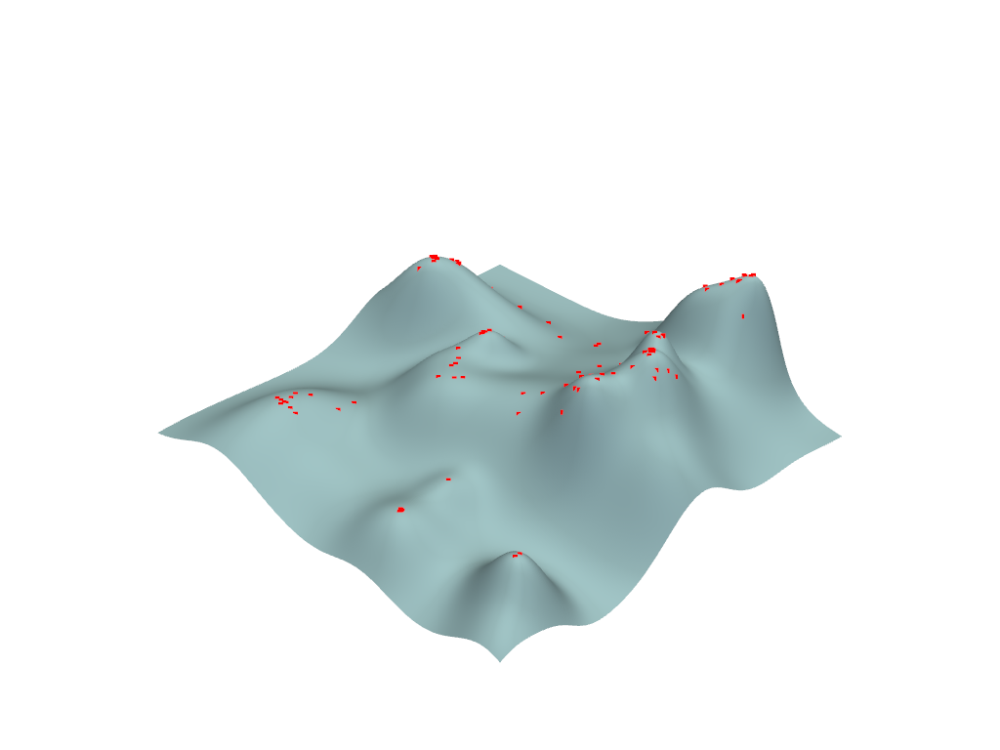

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


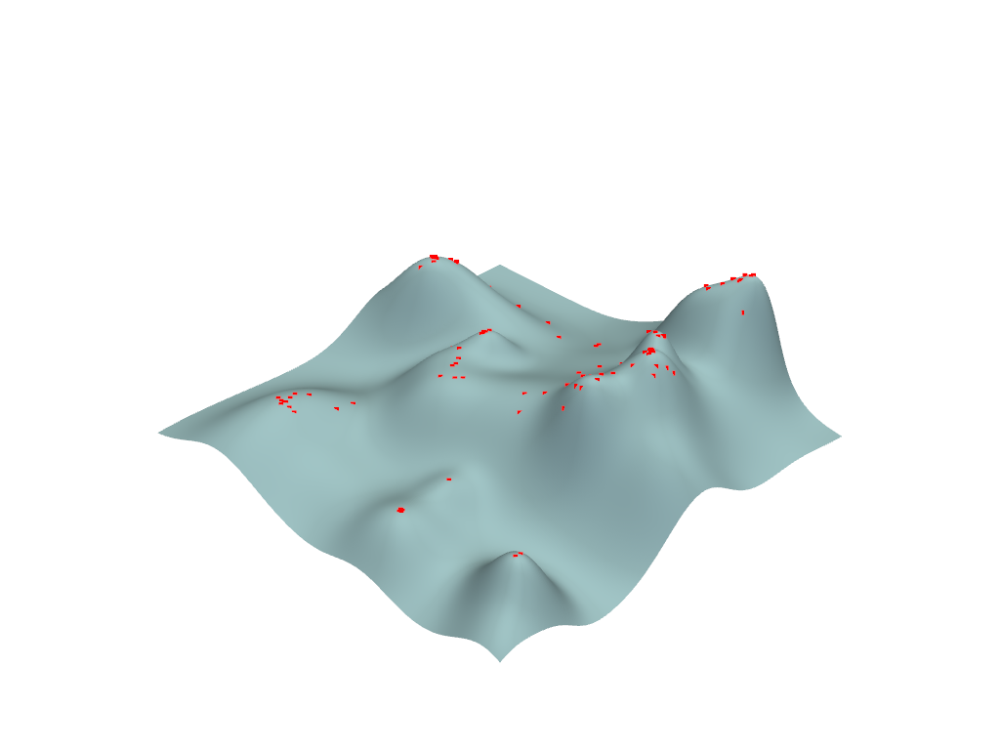

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


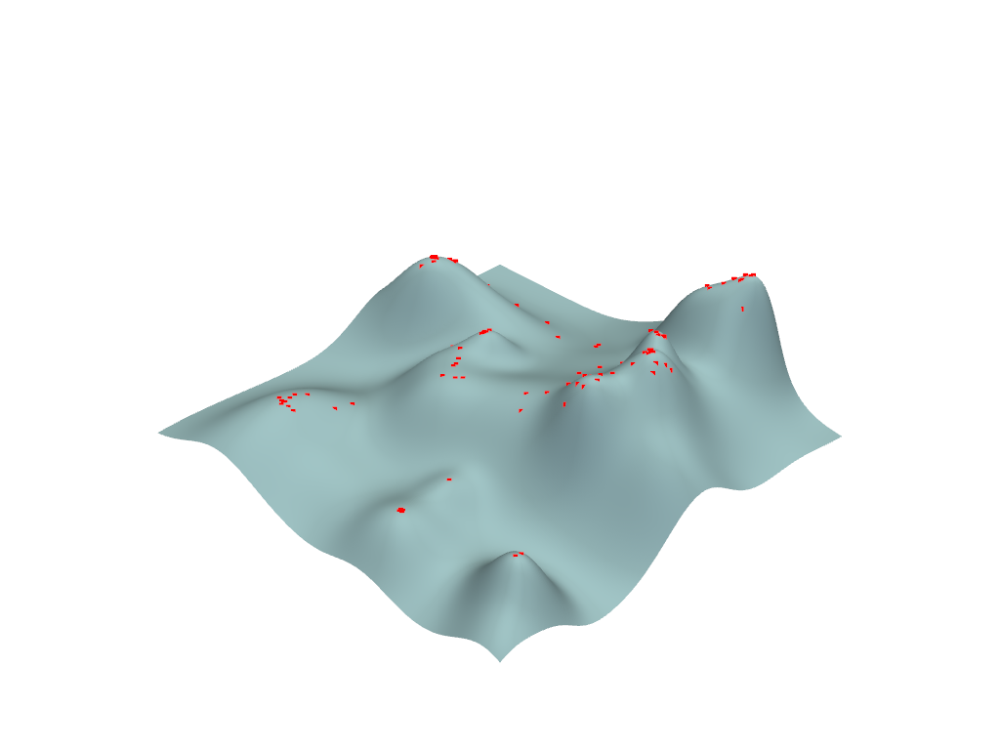

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


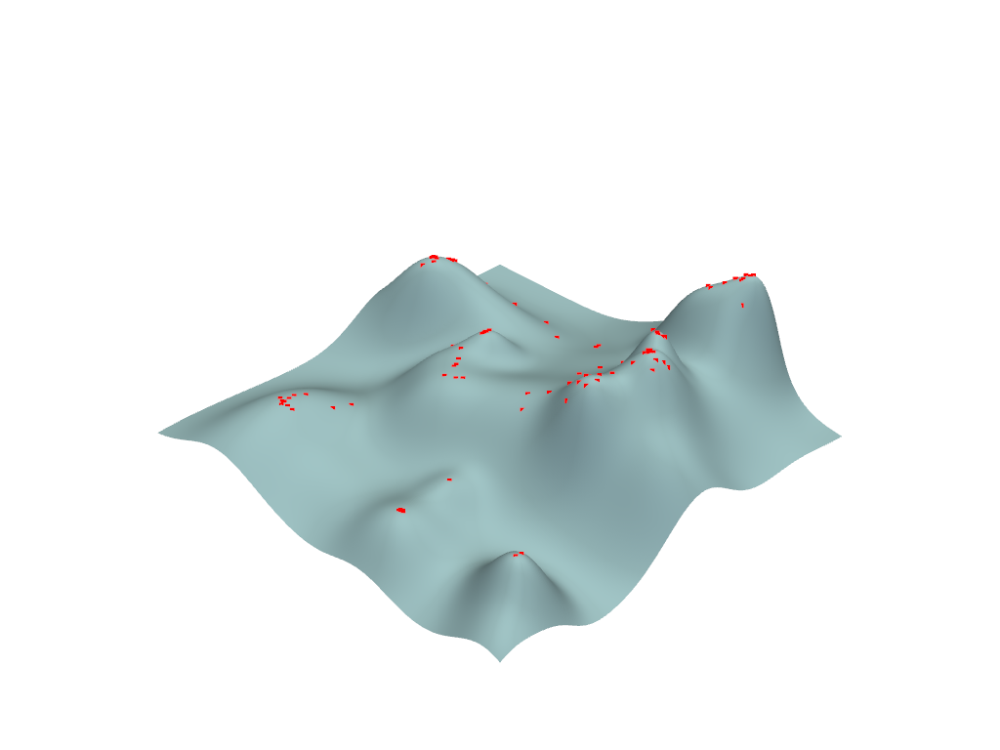

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


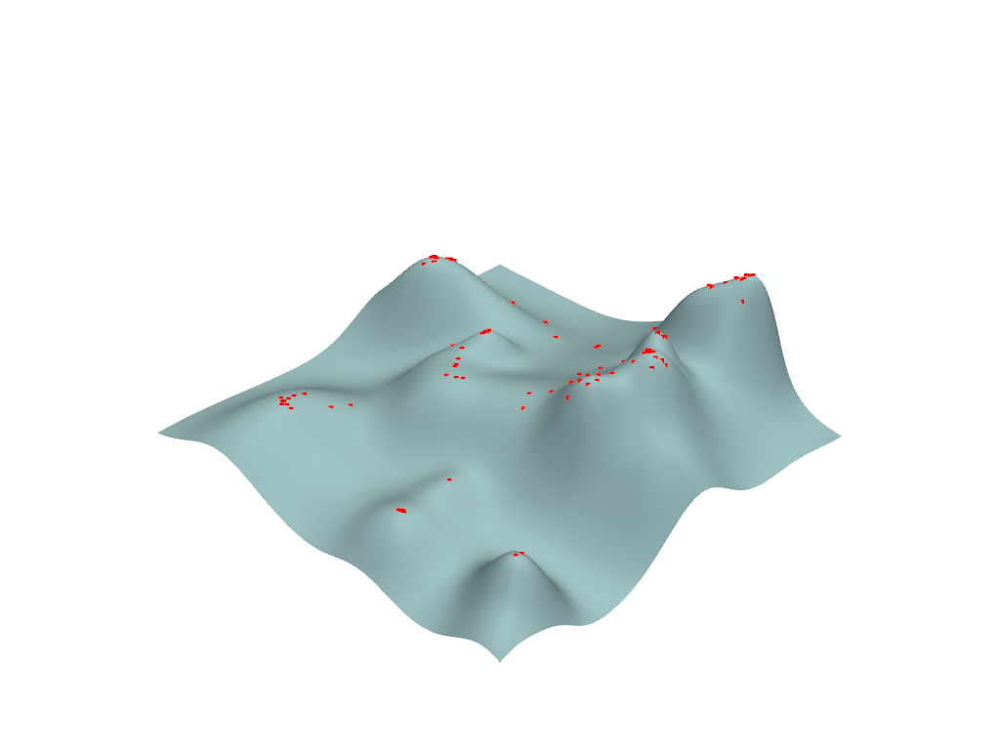

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


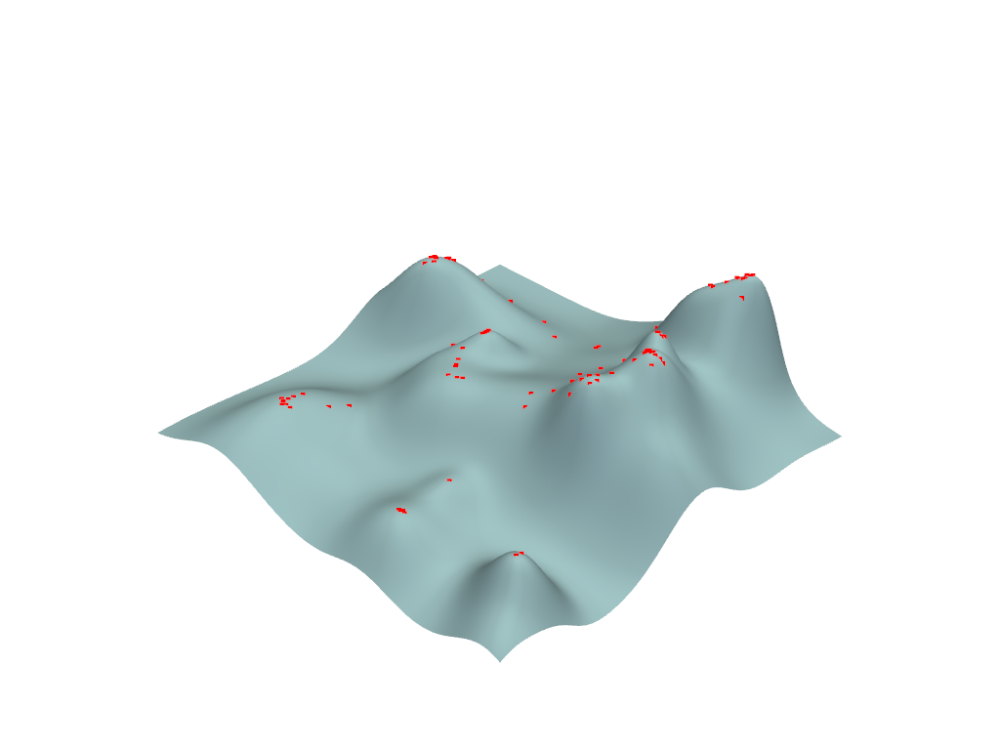

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(
Context leak detected, msgtracer returned -1


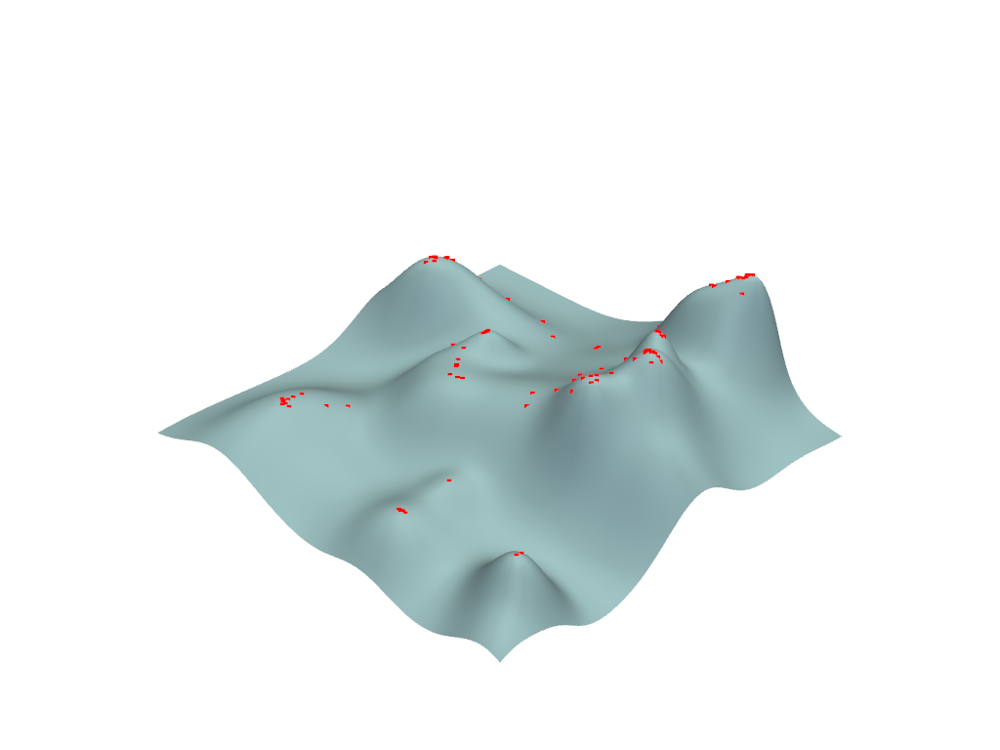

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


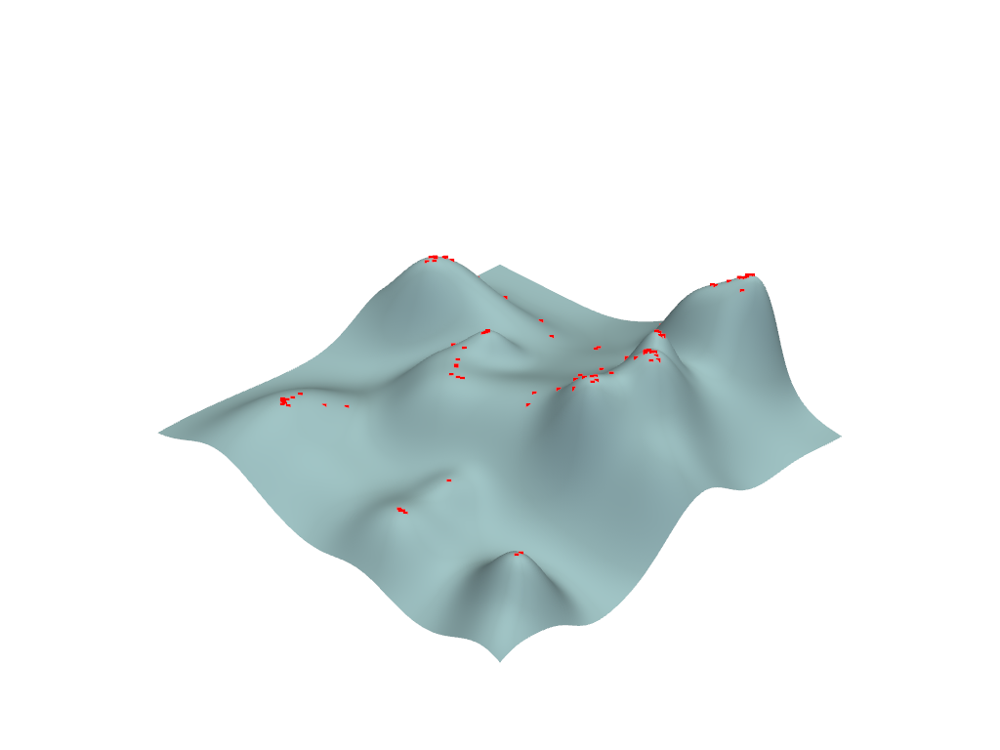

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


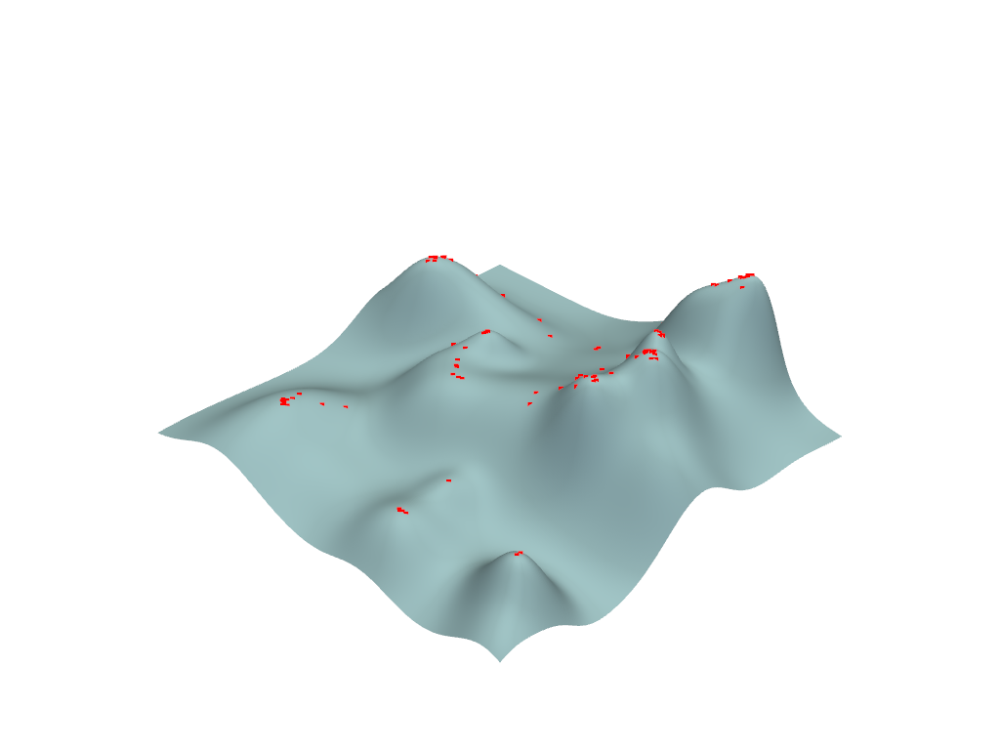

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


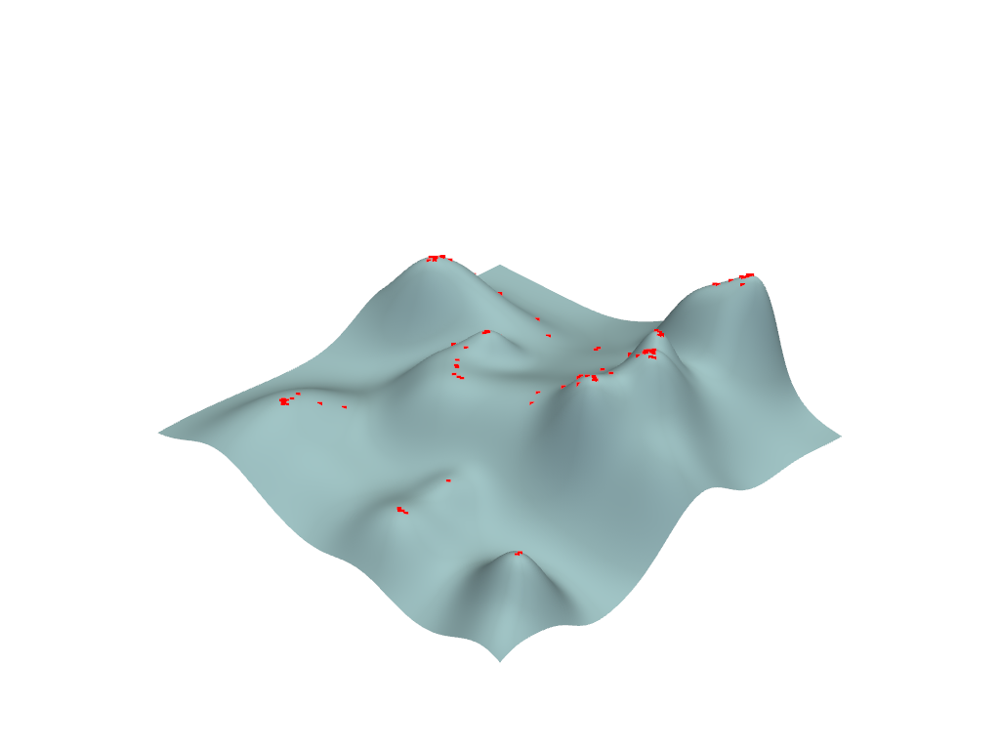

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


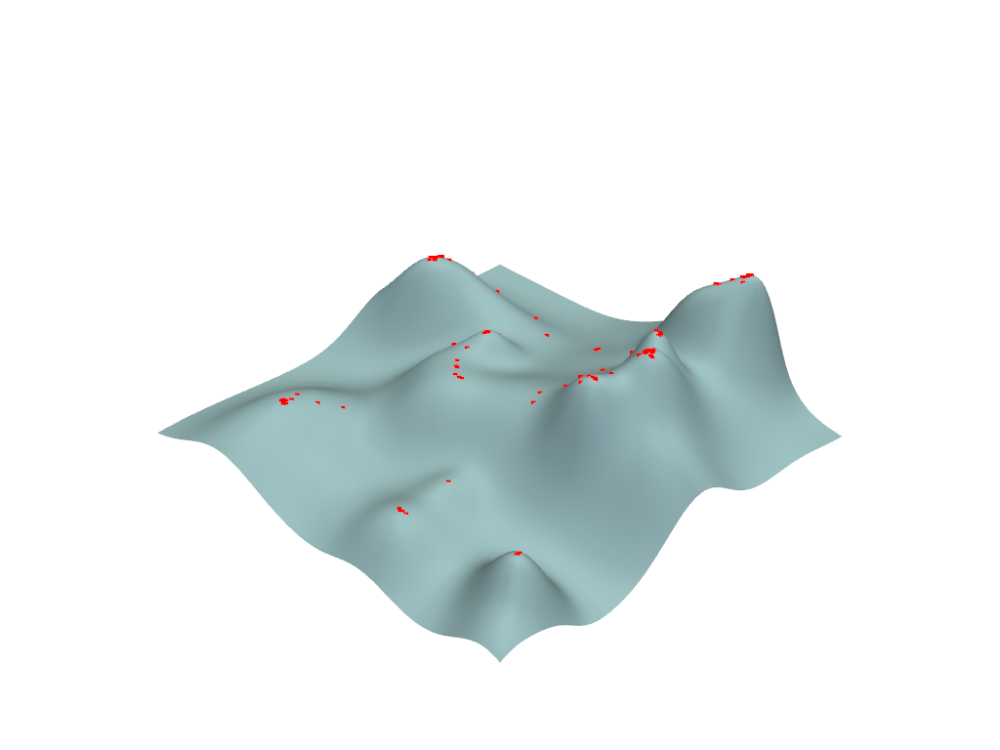

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


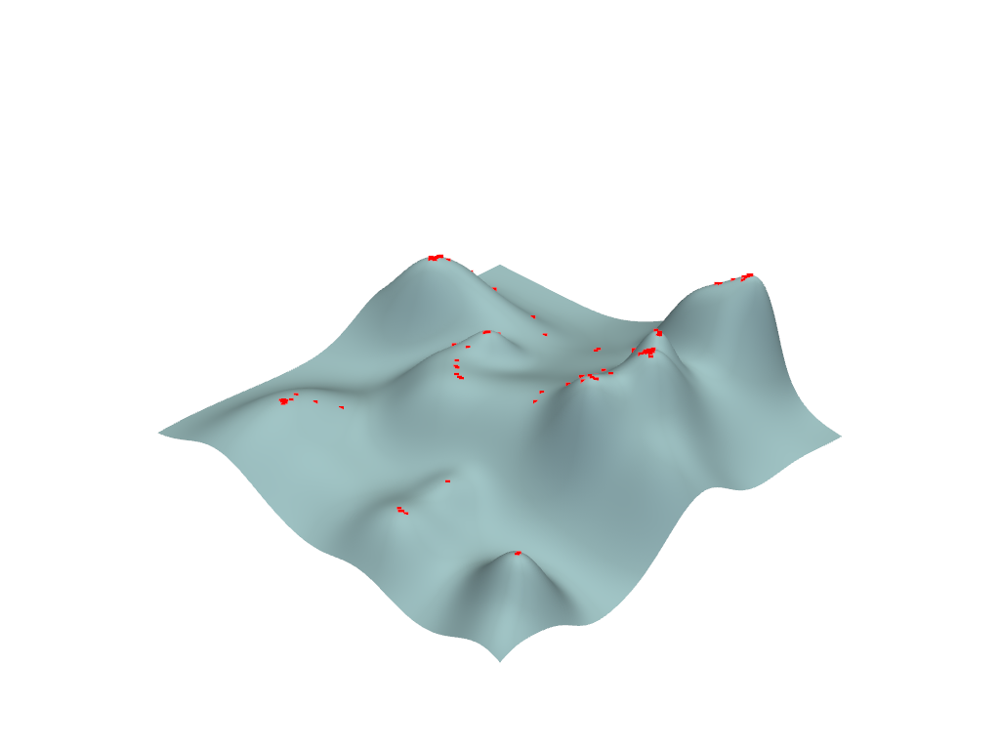

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


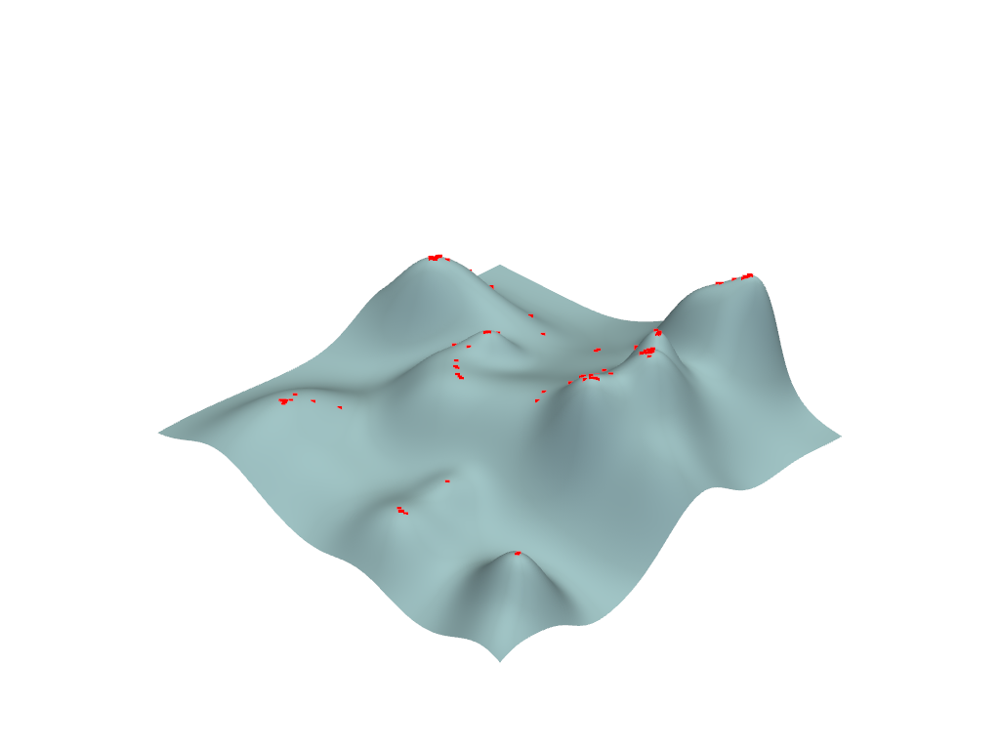

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


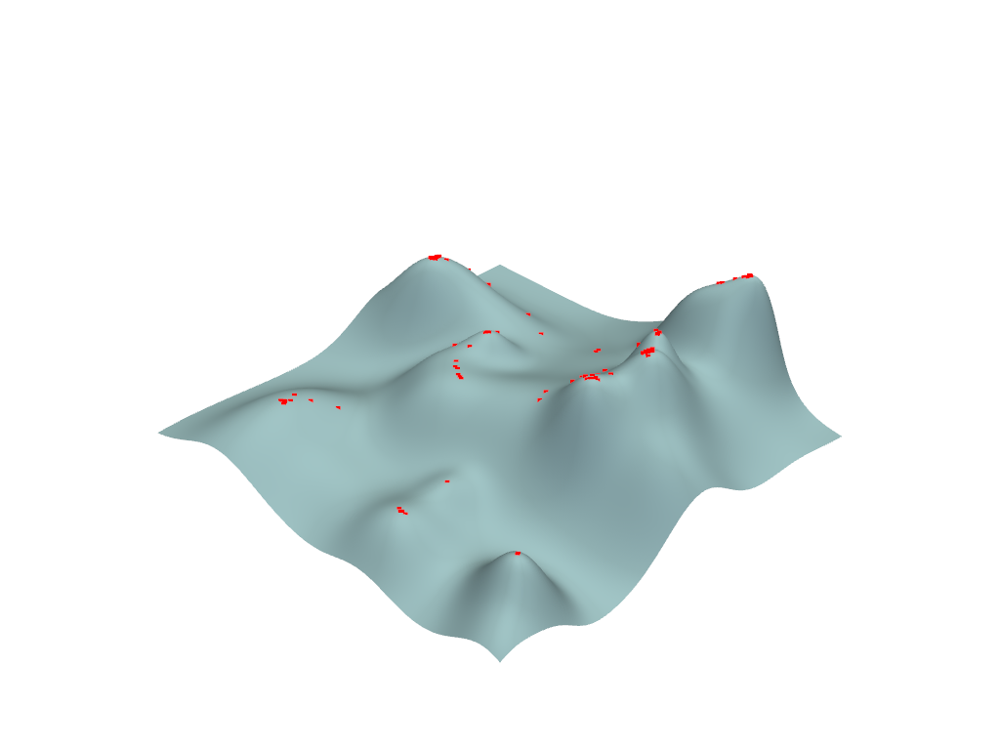

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


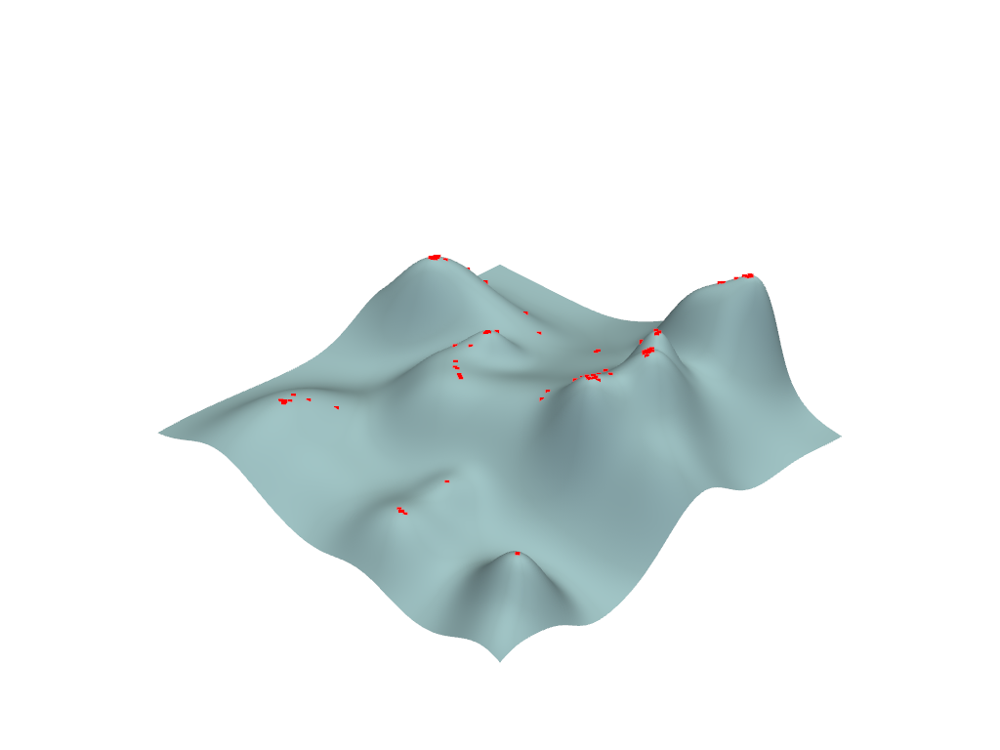

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


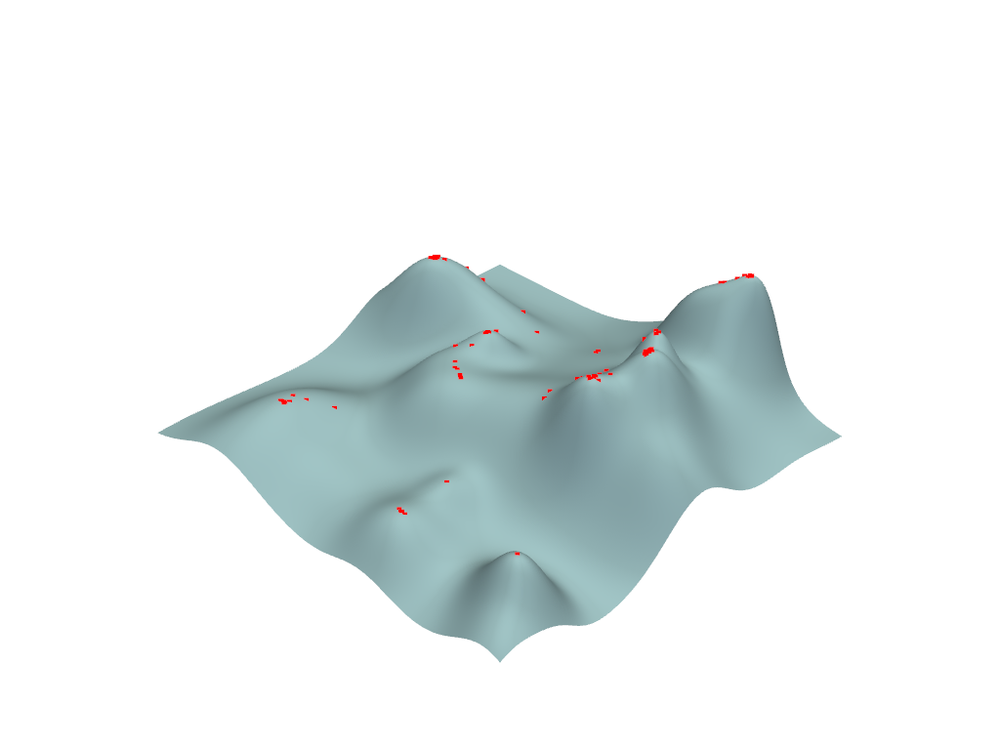

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


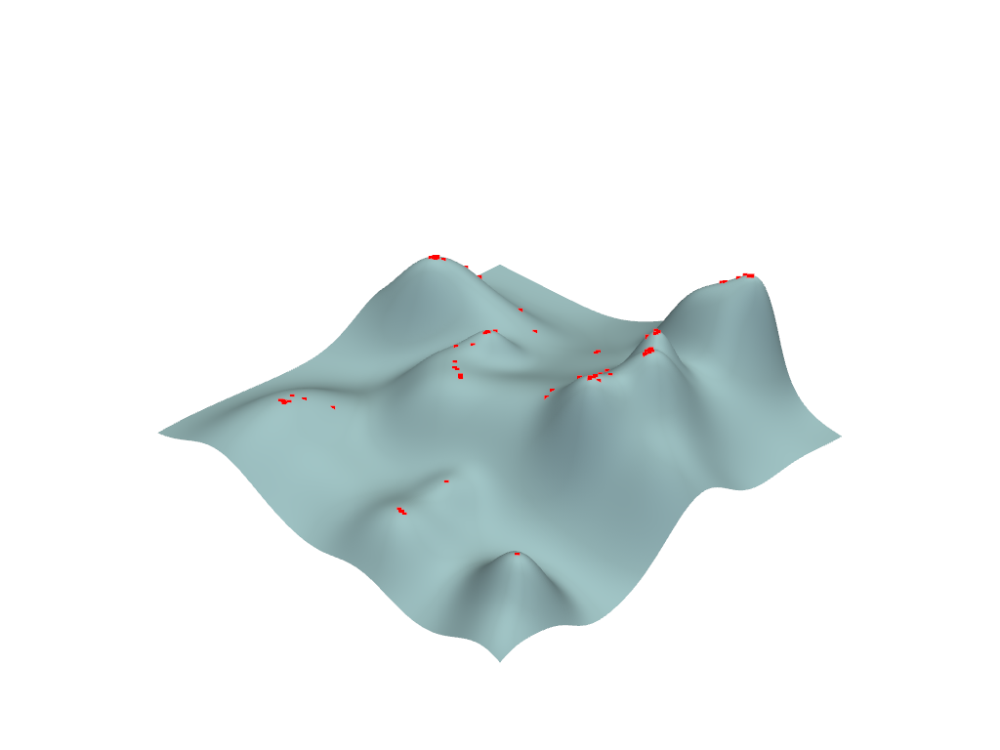

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


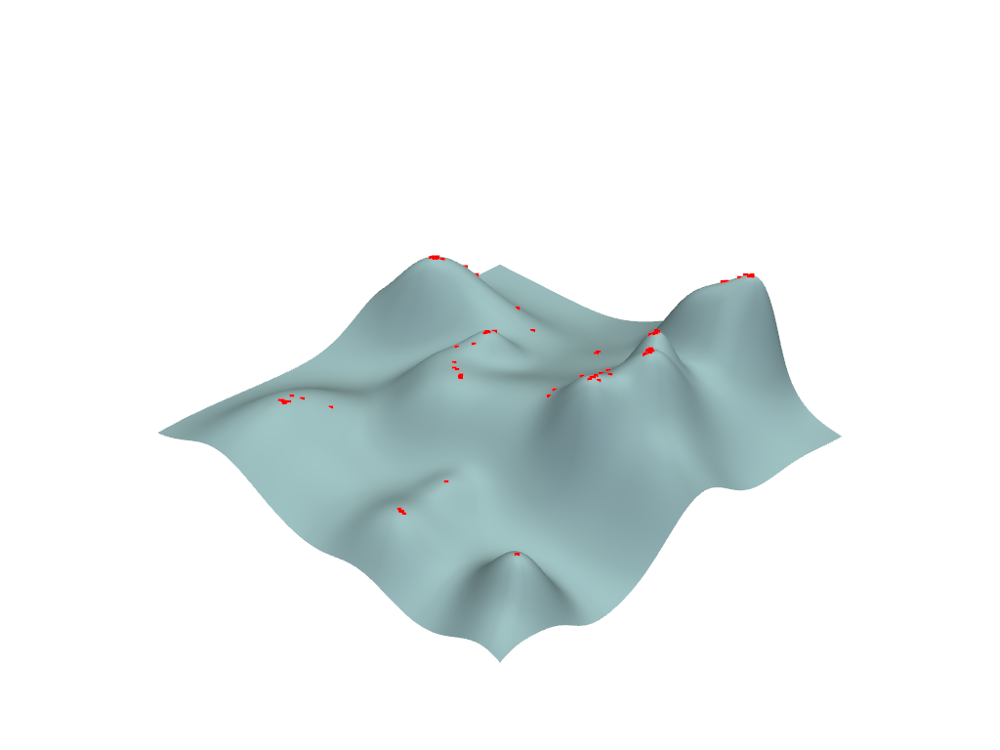

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


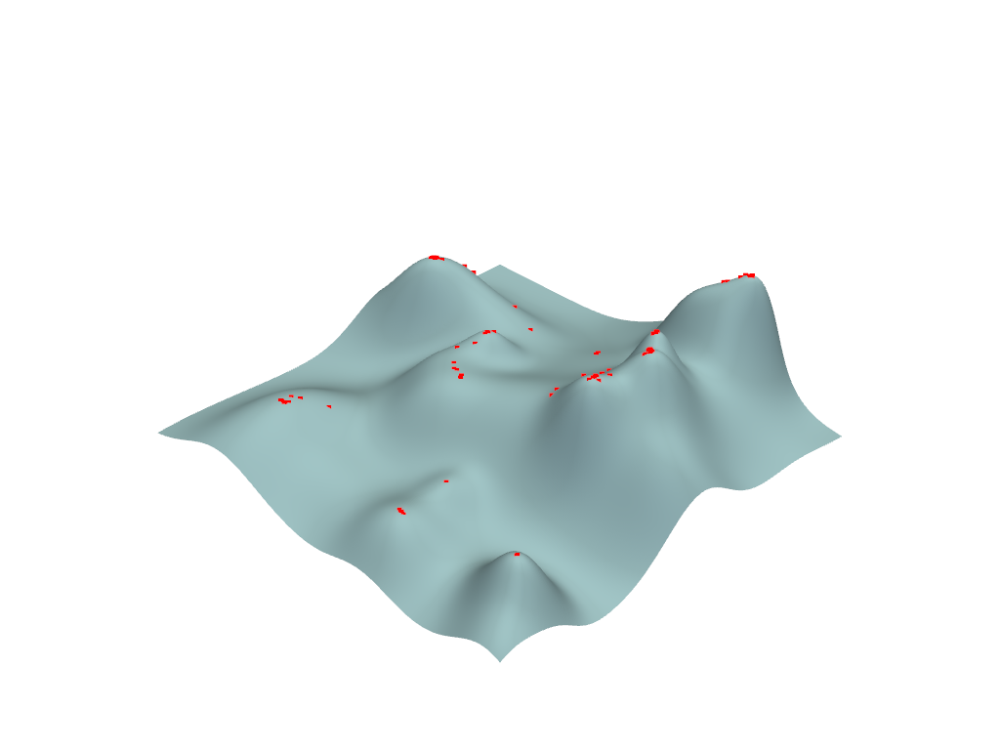

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


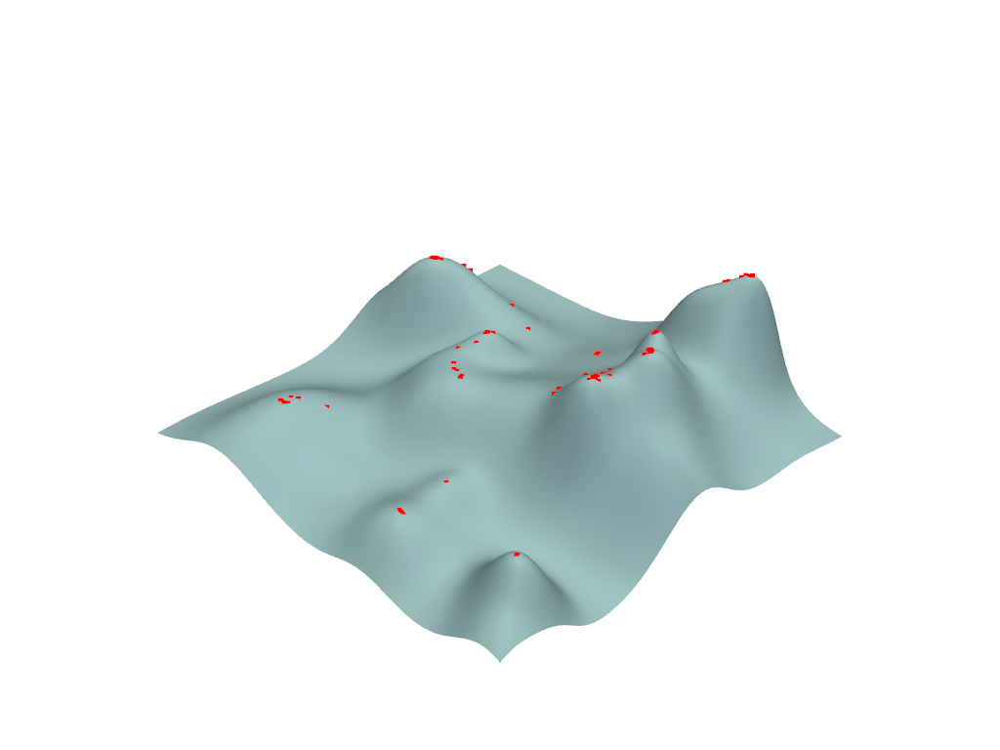

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


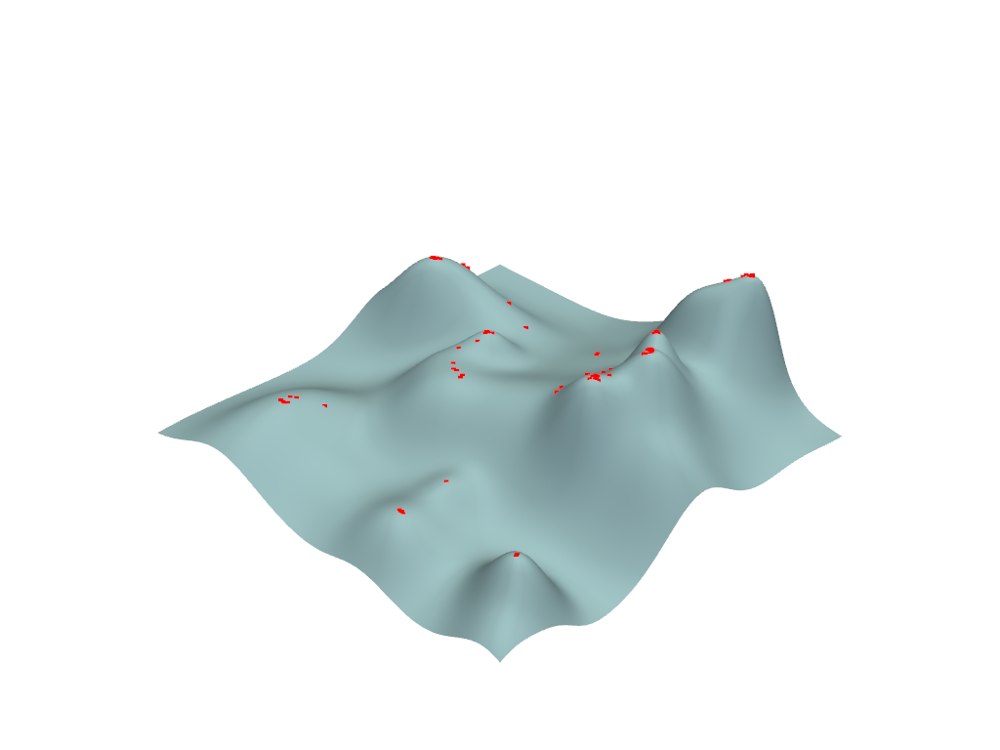

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


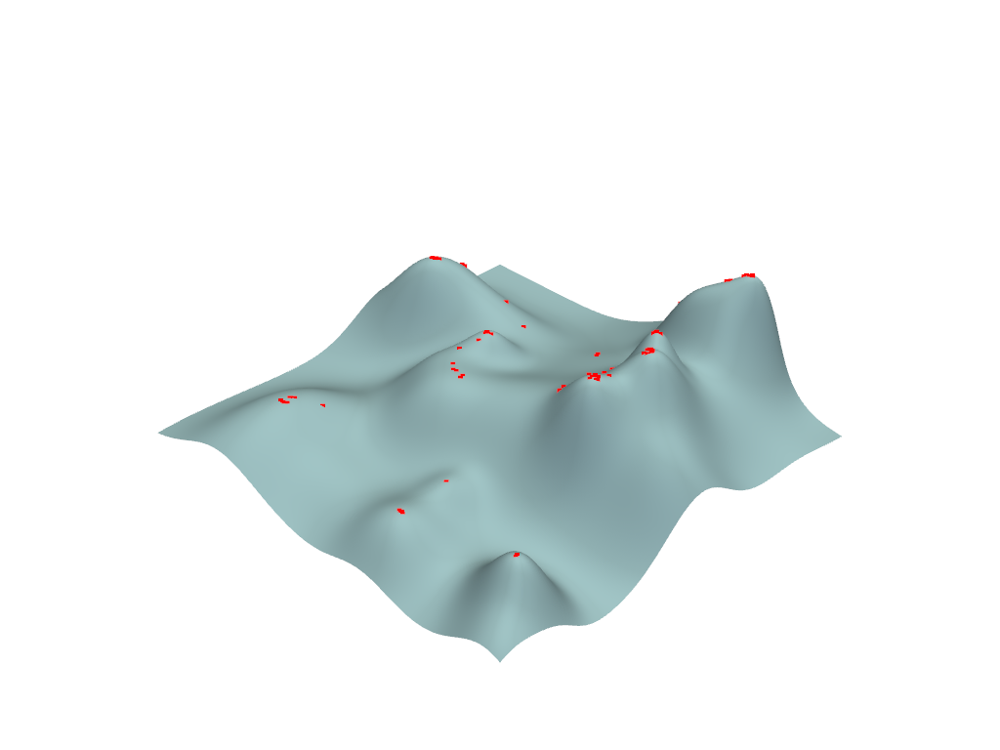

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


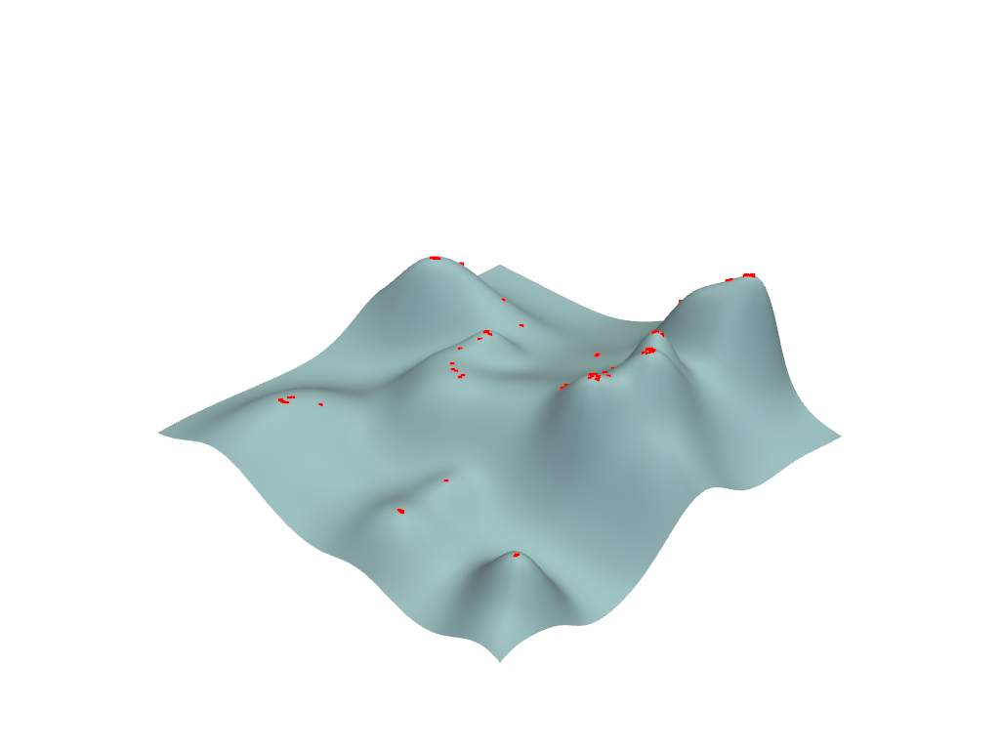

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


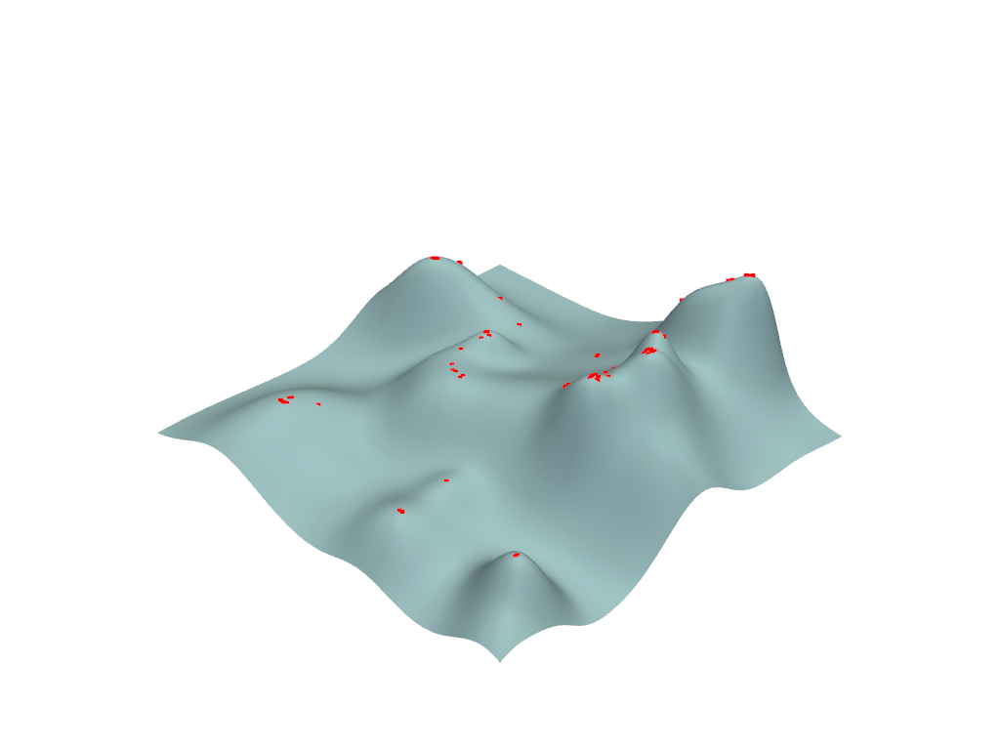

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


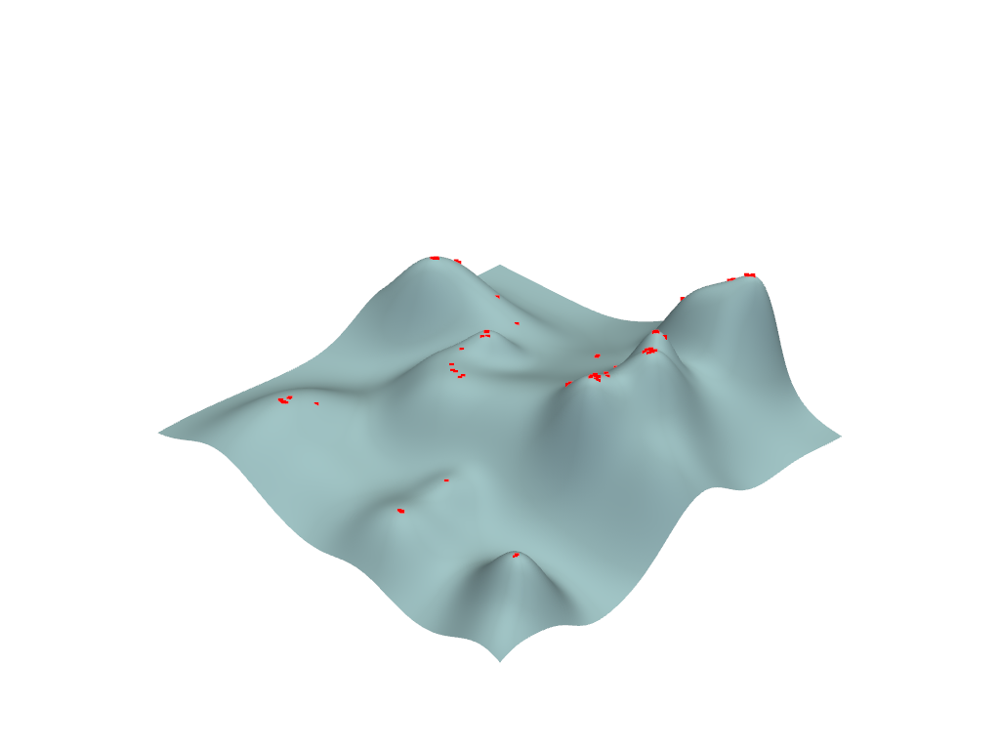

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


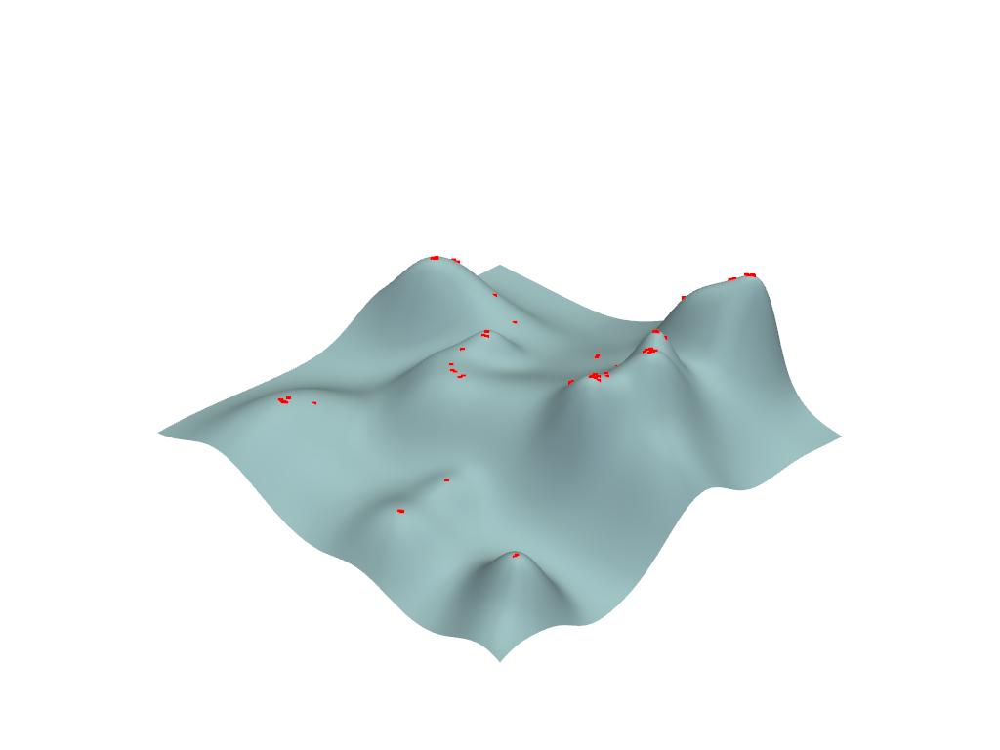

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


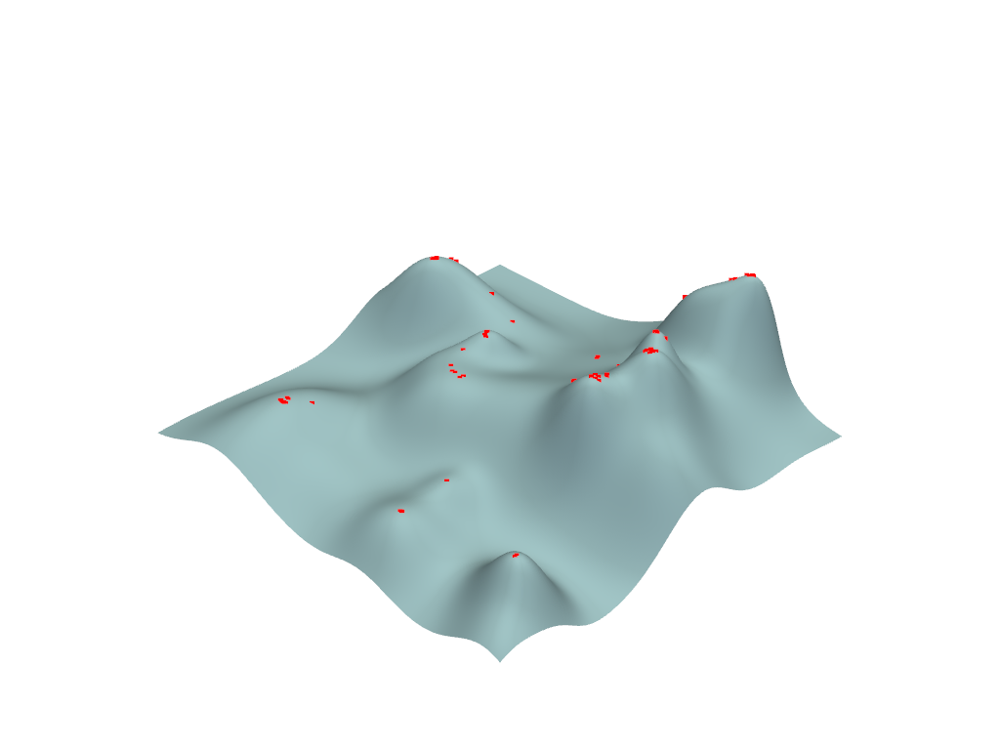

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


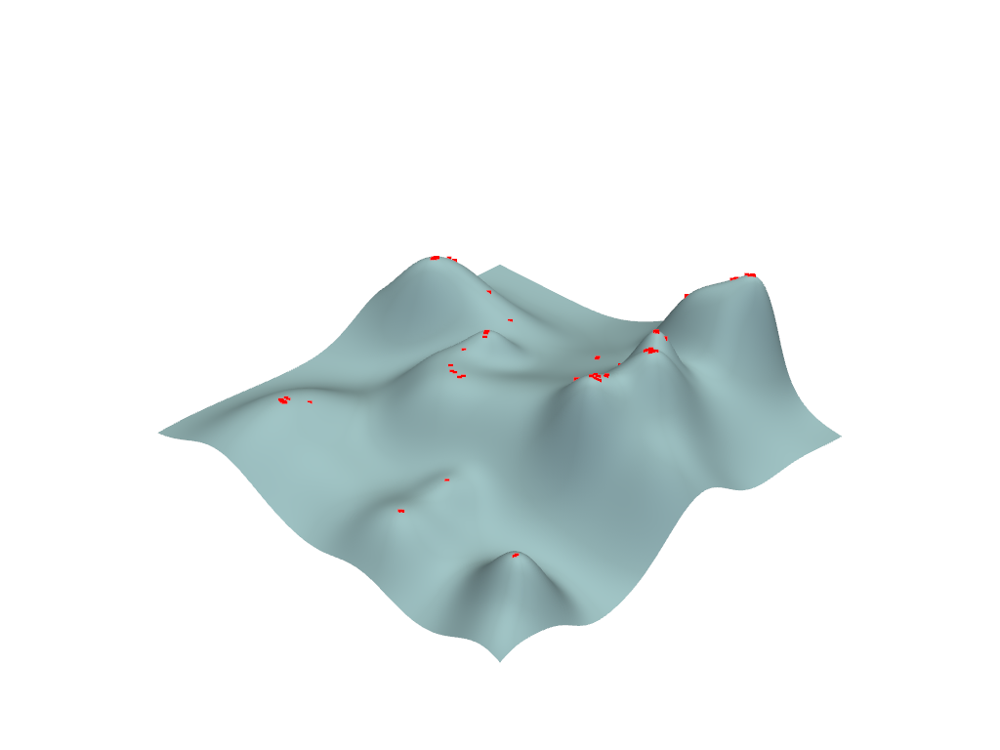

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


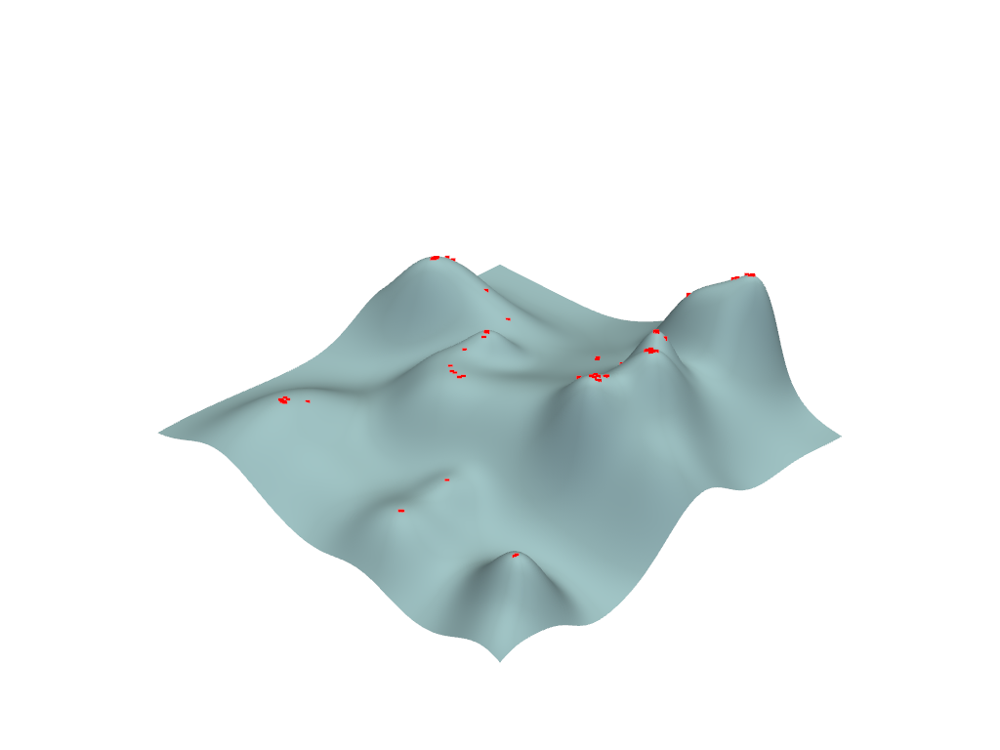

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


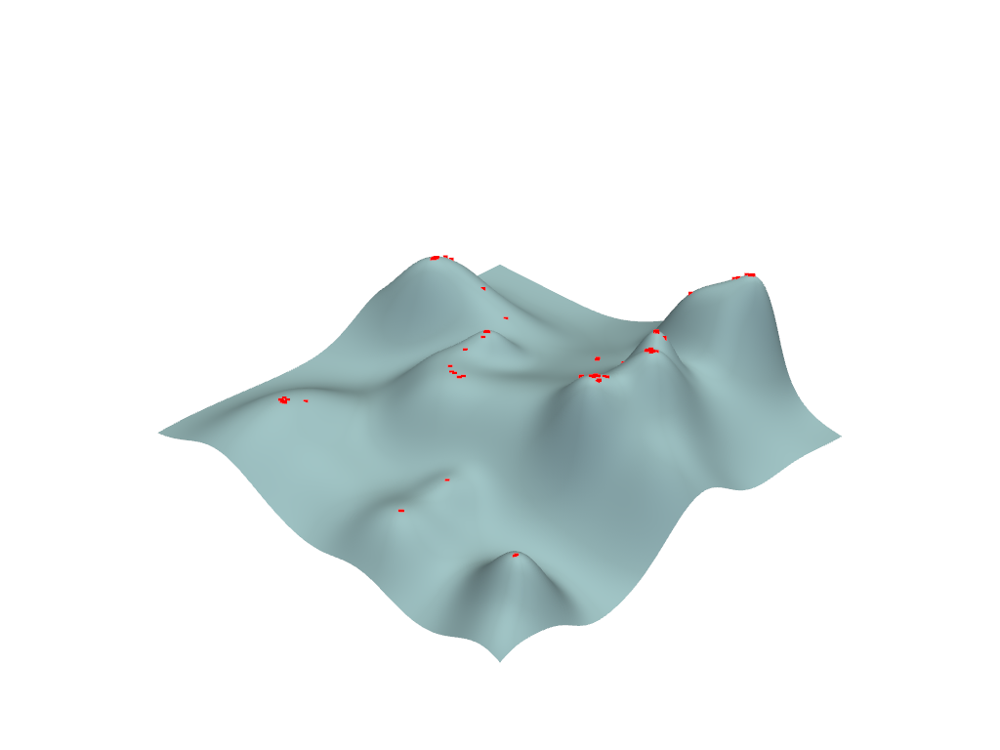

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


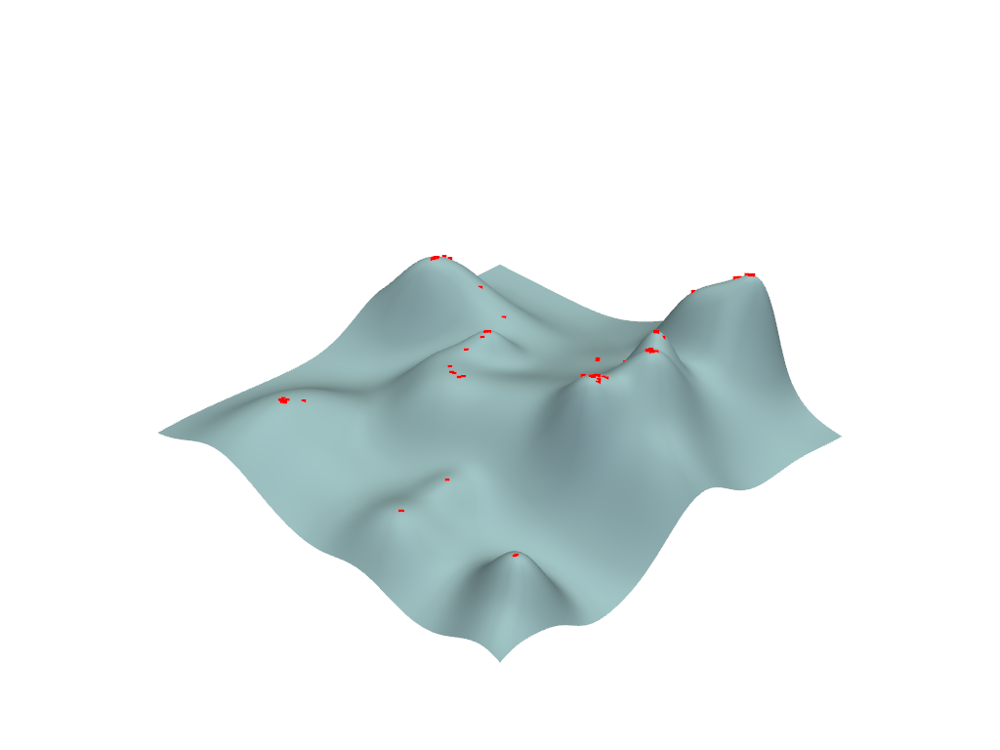

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(
Context leak detected, msgtracer returned -1


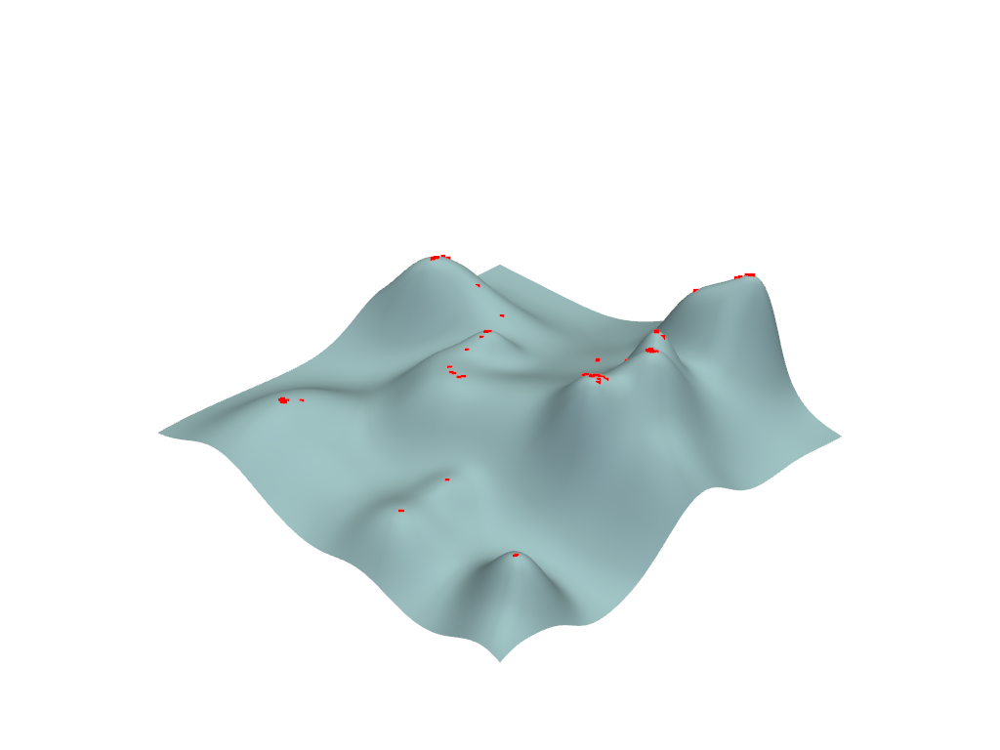

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


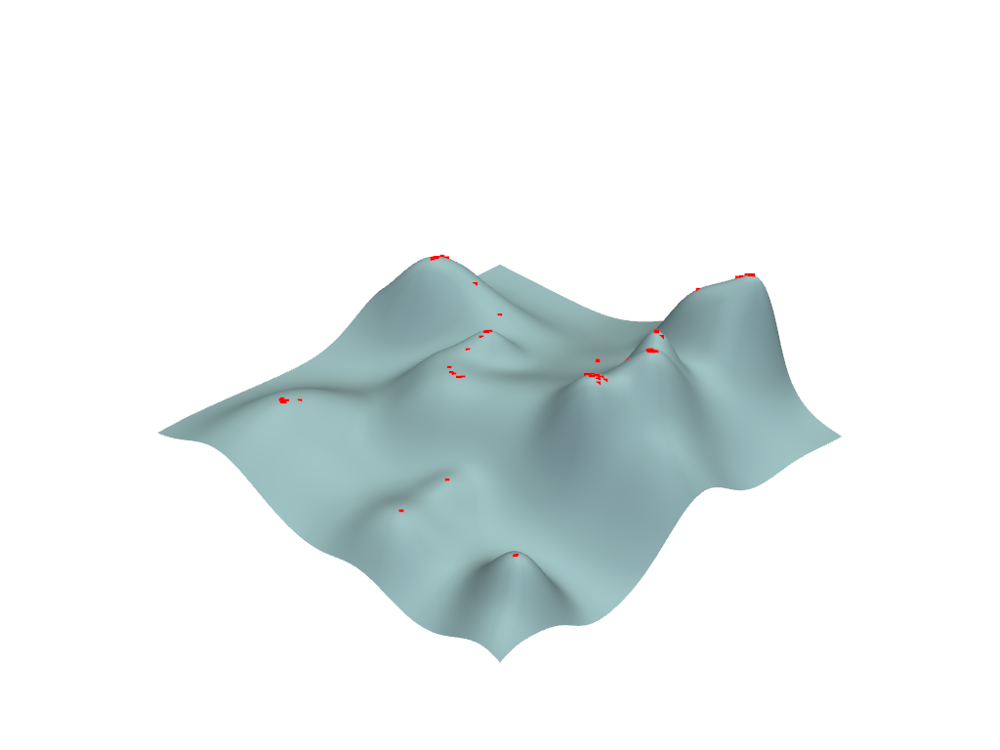

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


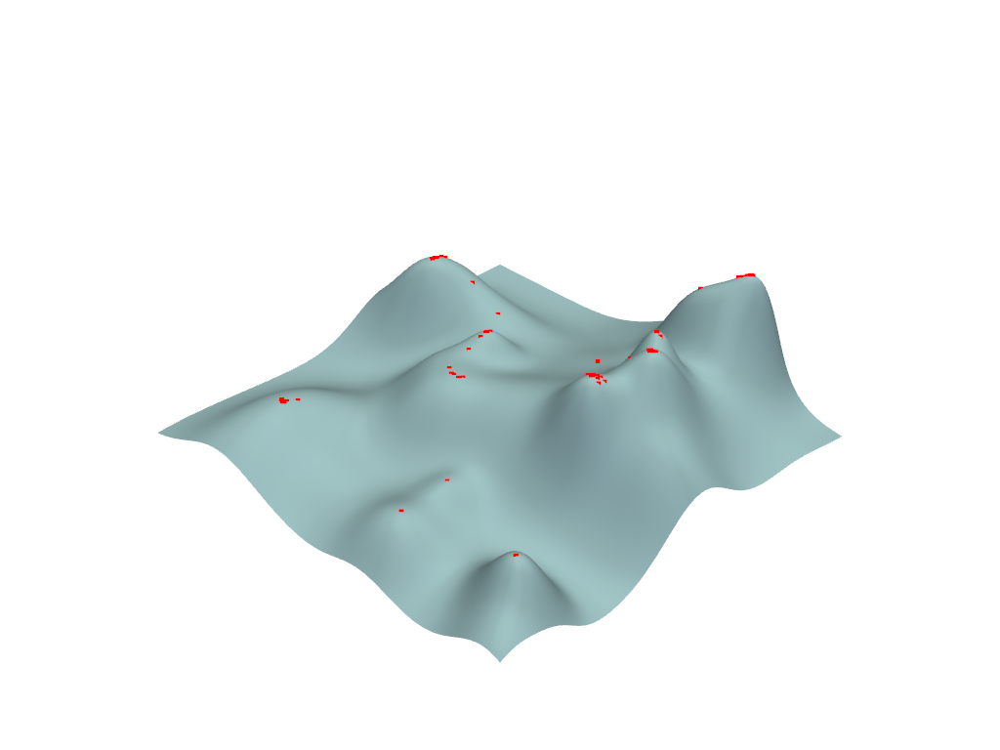

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


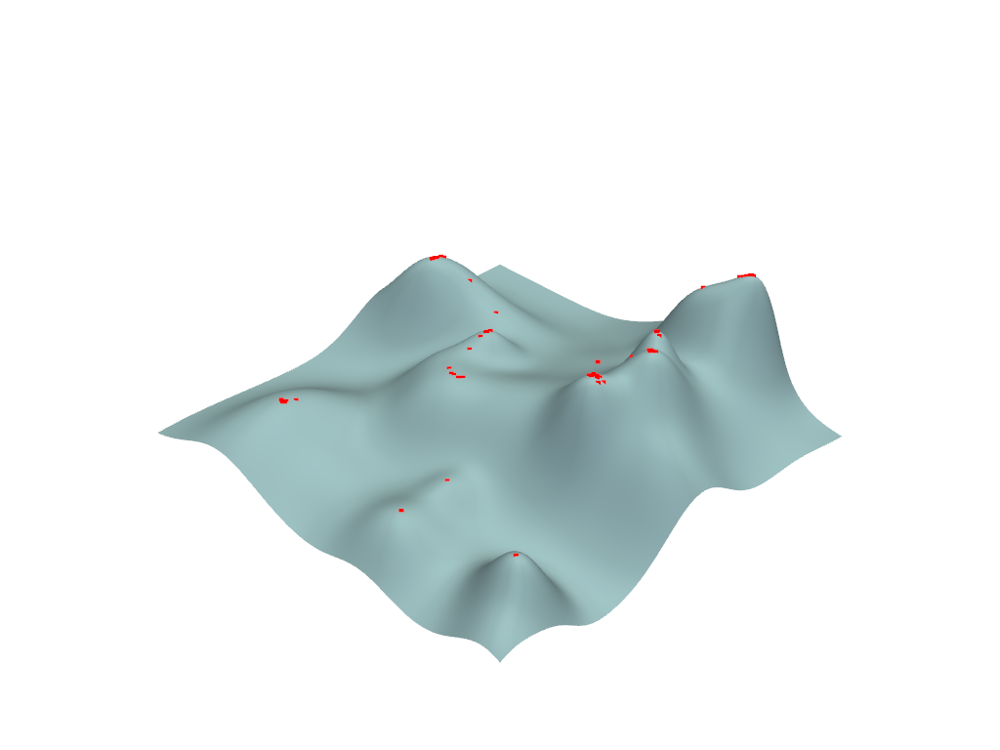

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


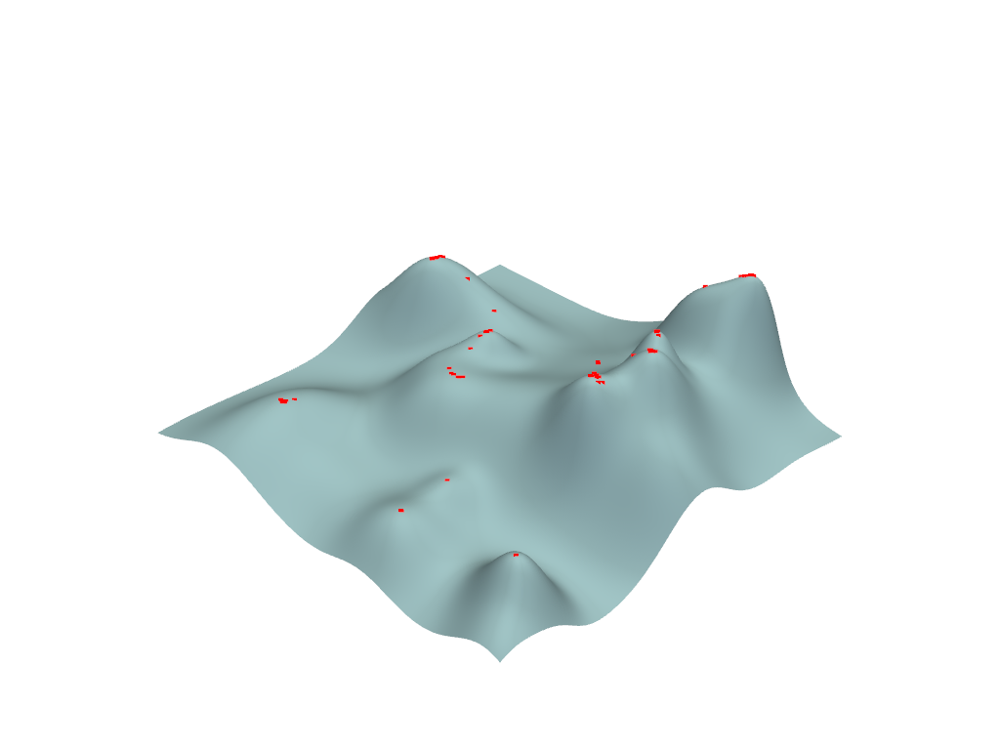

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


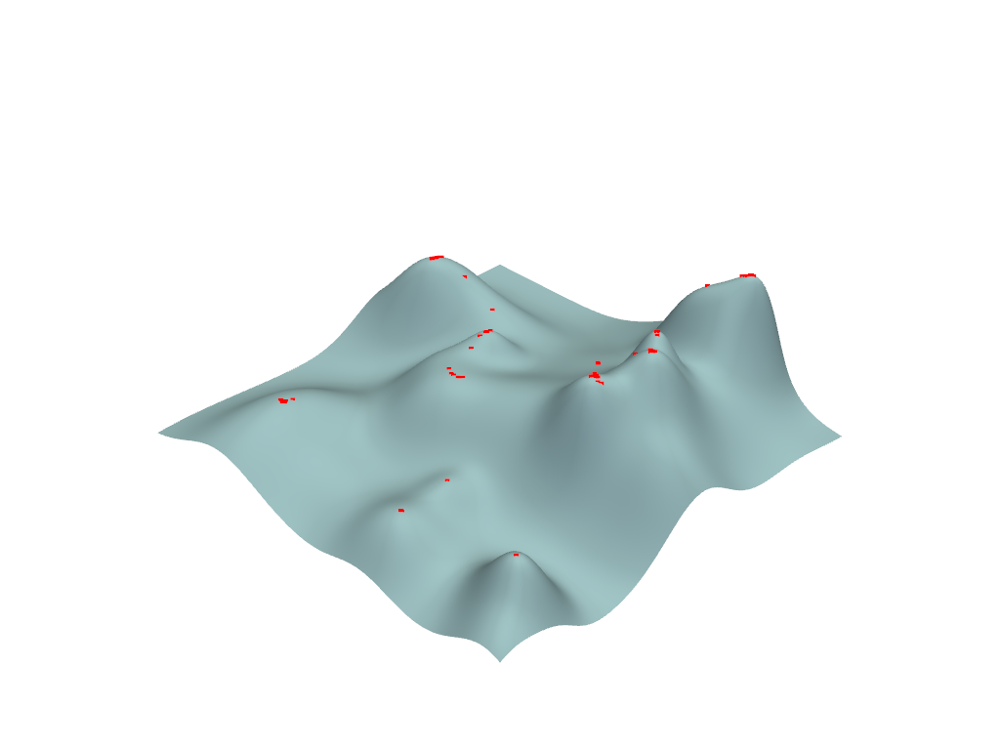

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


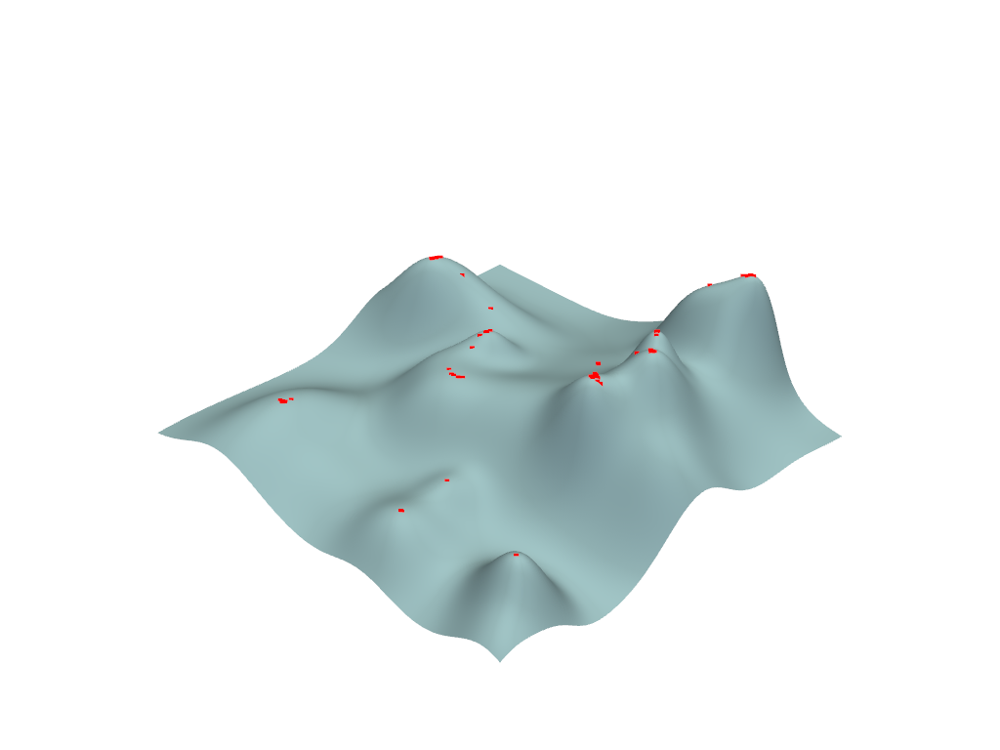

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


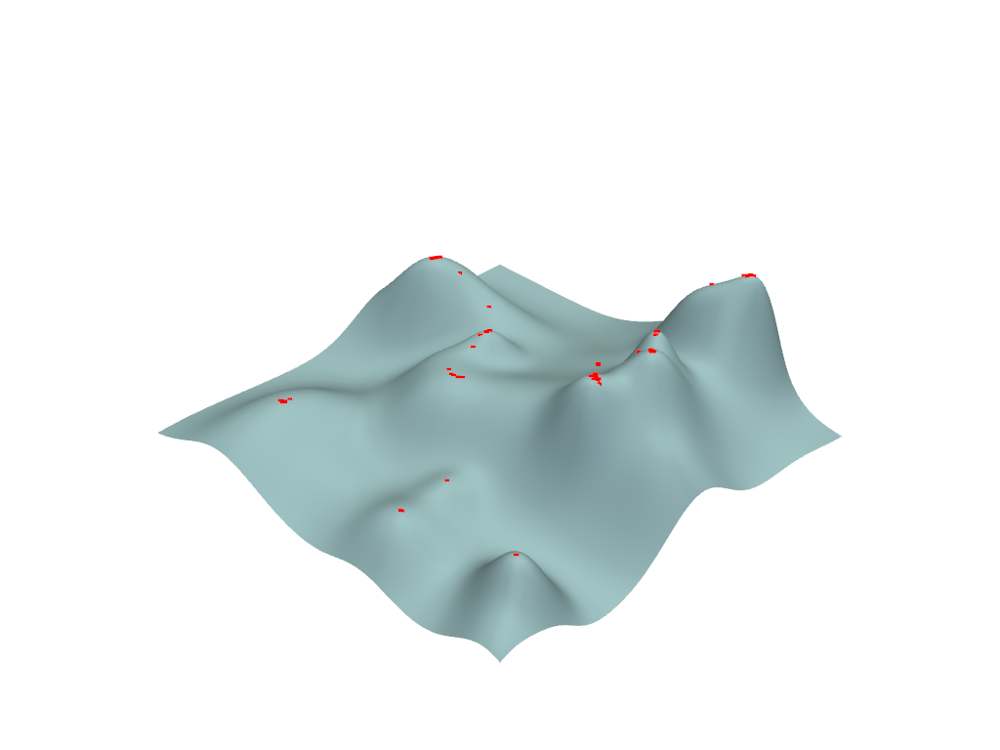

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


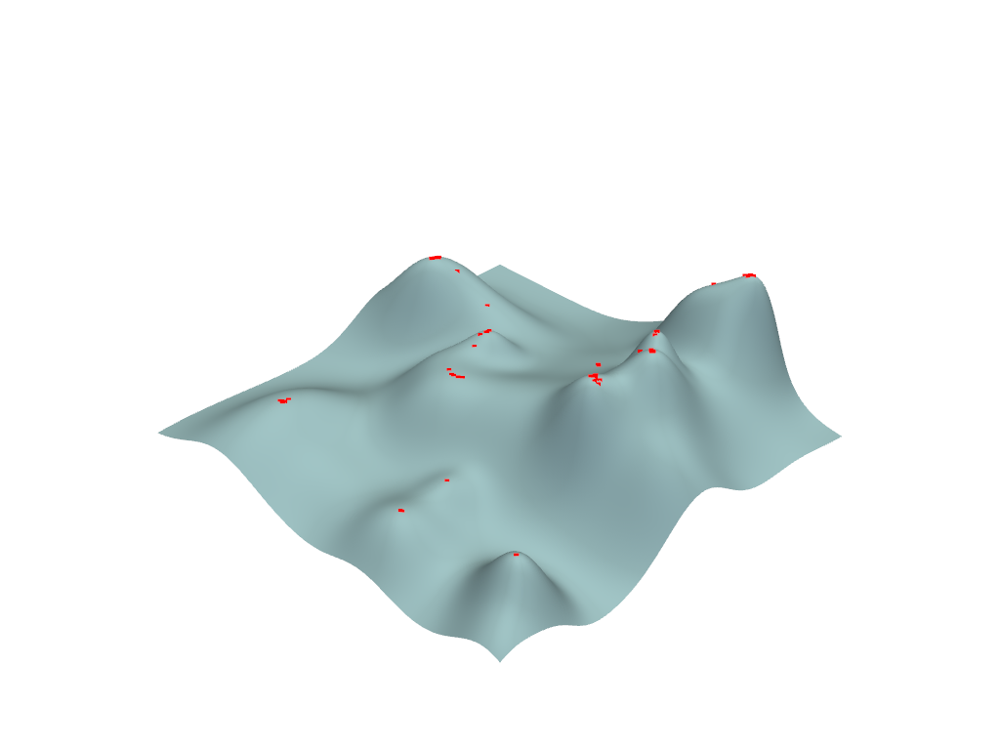

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


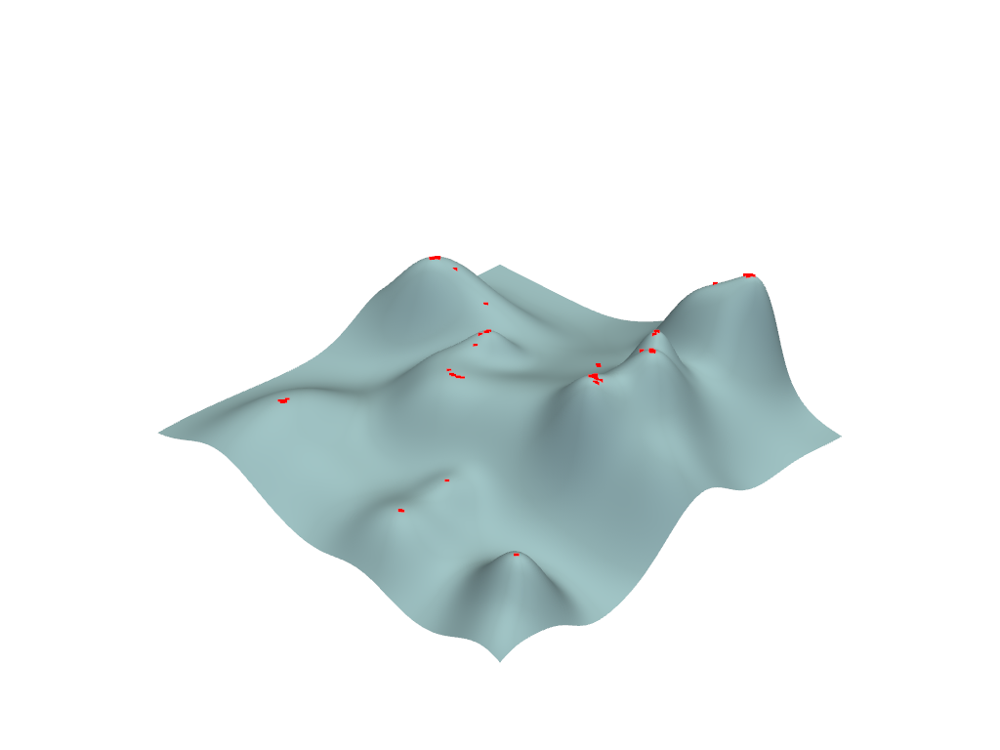

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


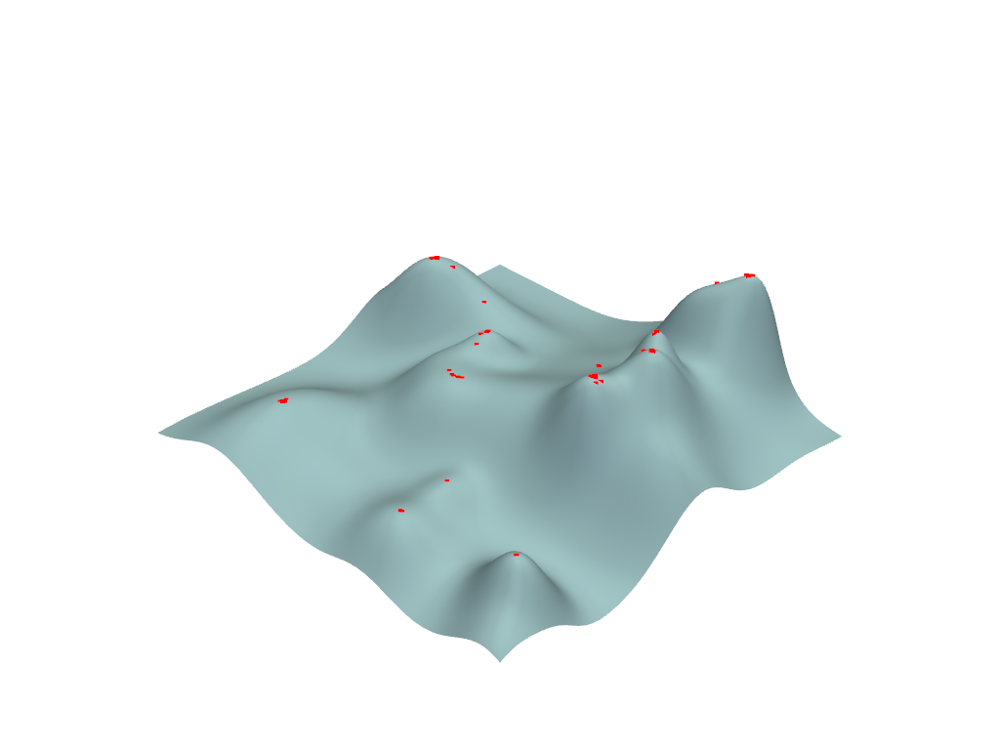

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


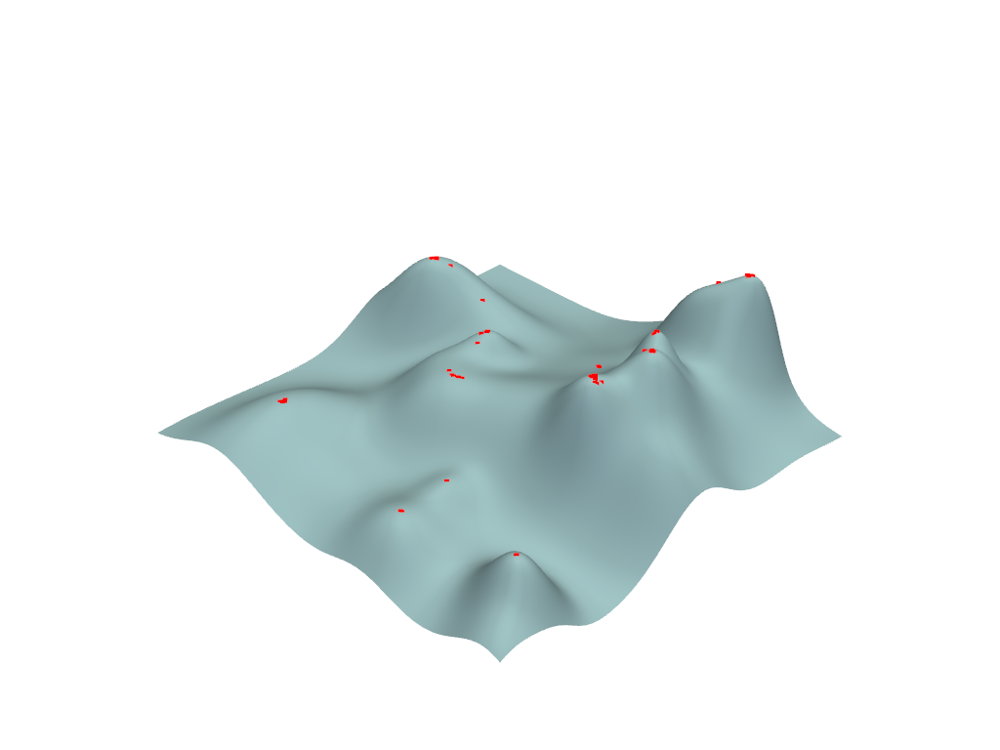

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


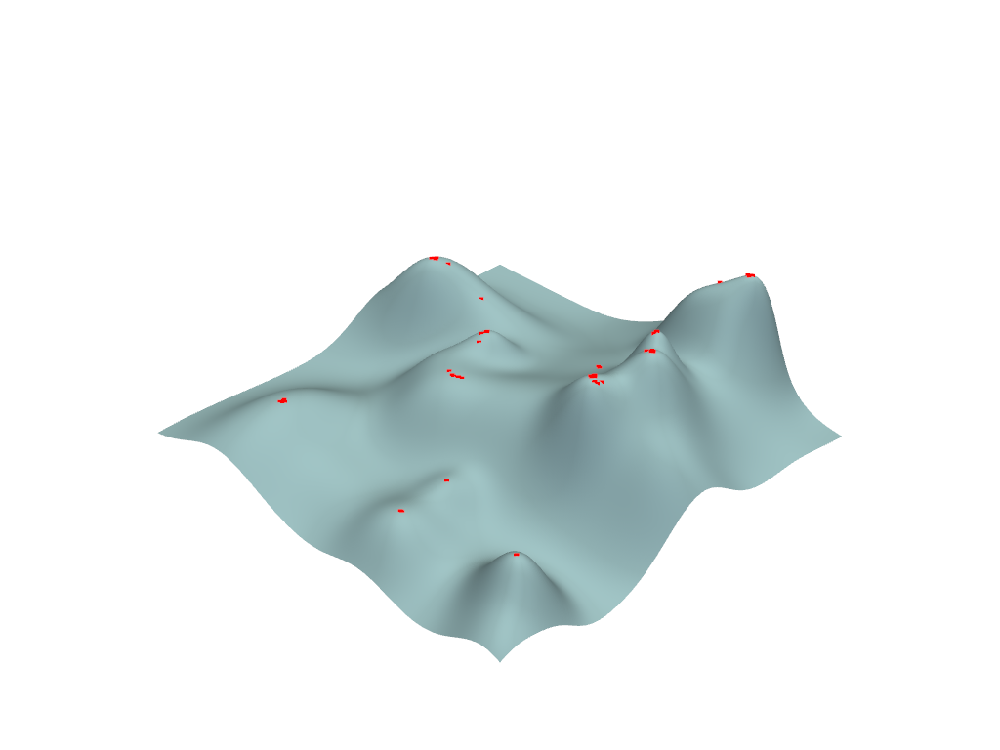

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


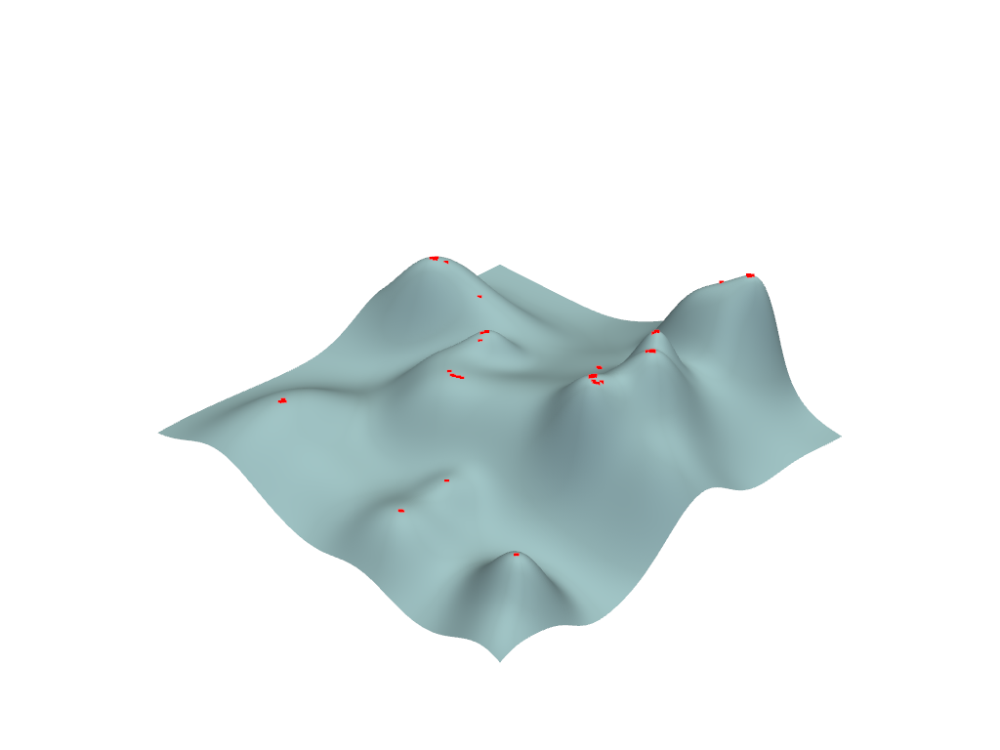

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


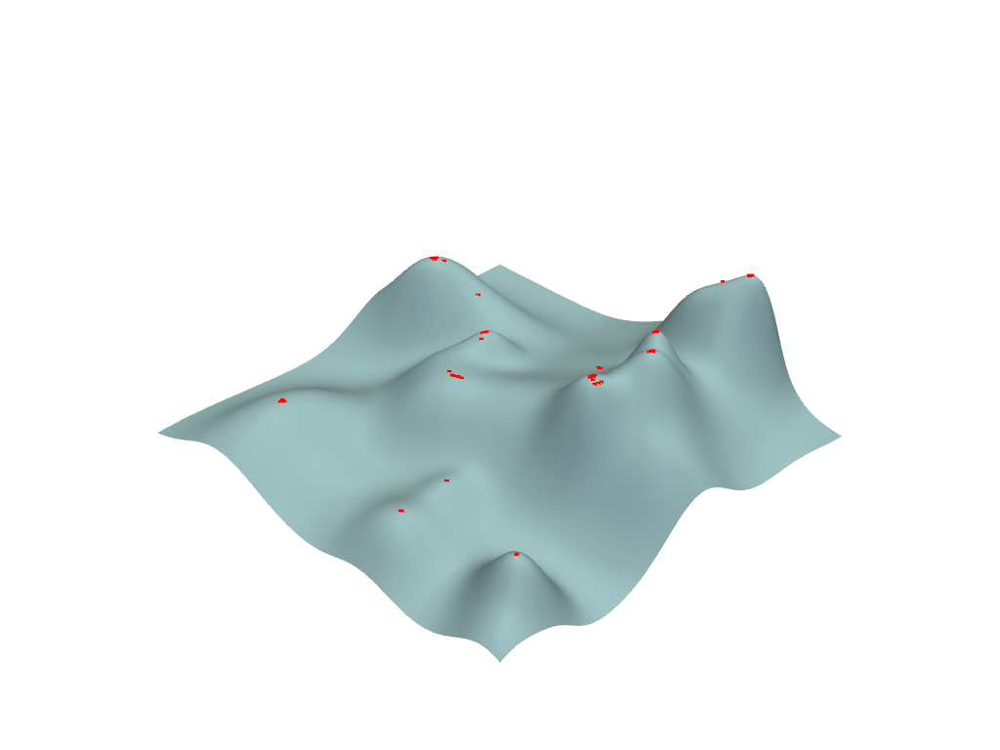

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


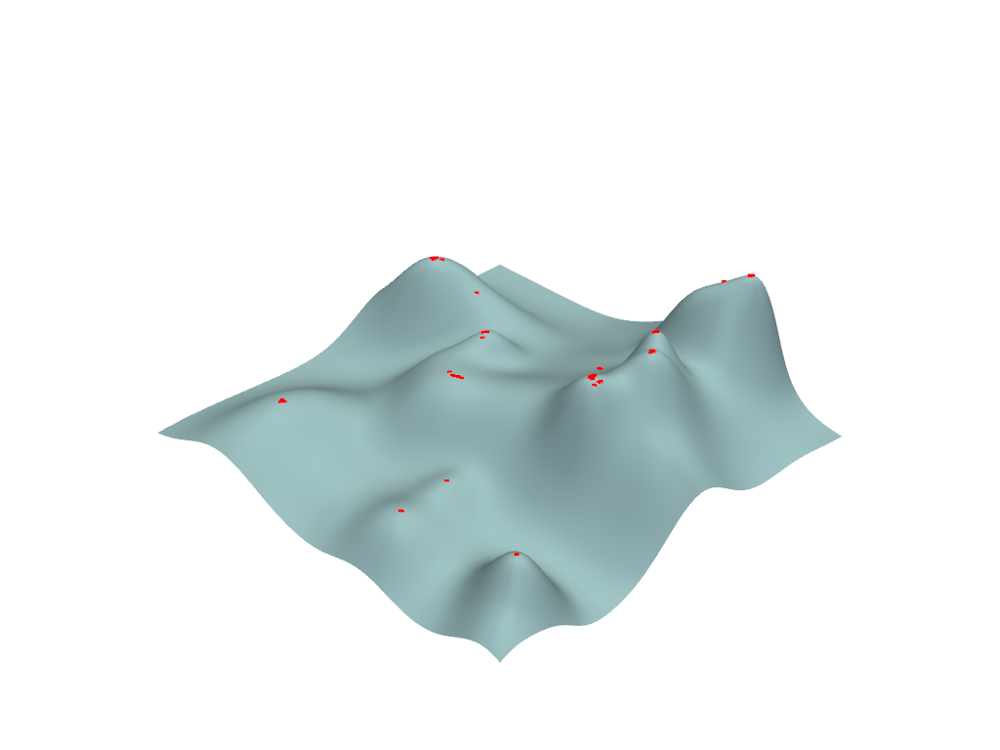

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


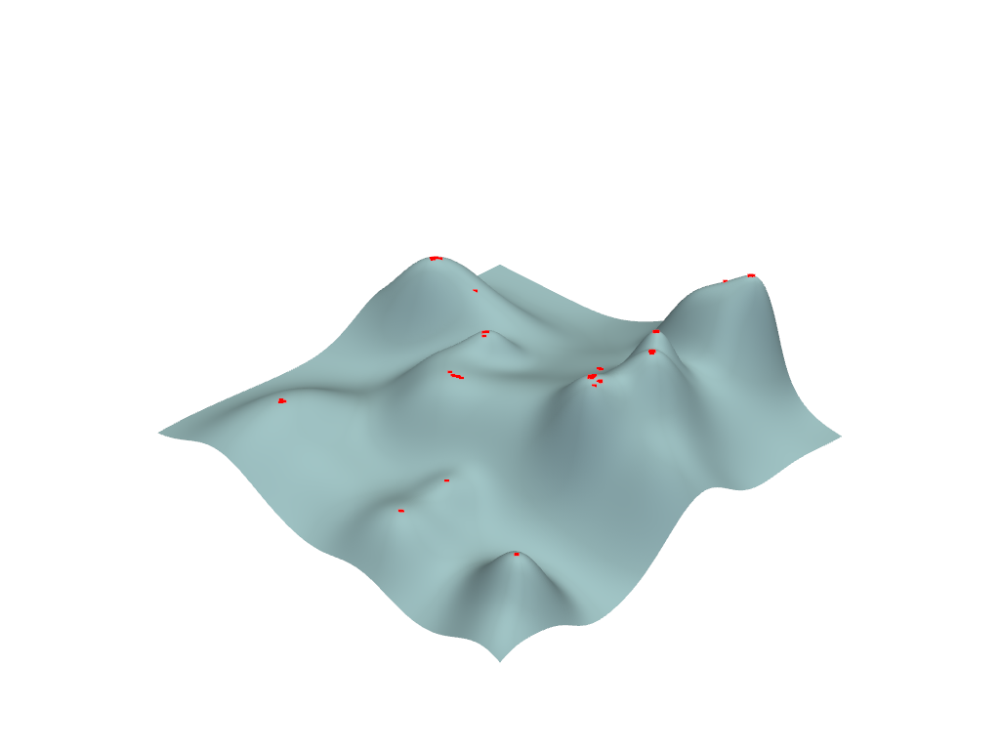

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


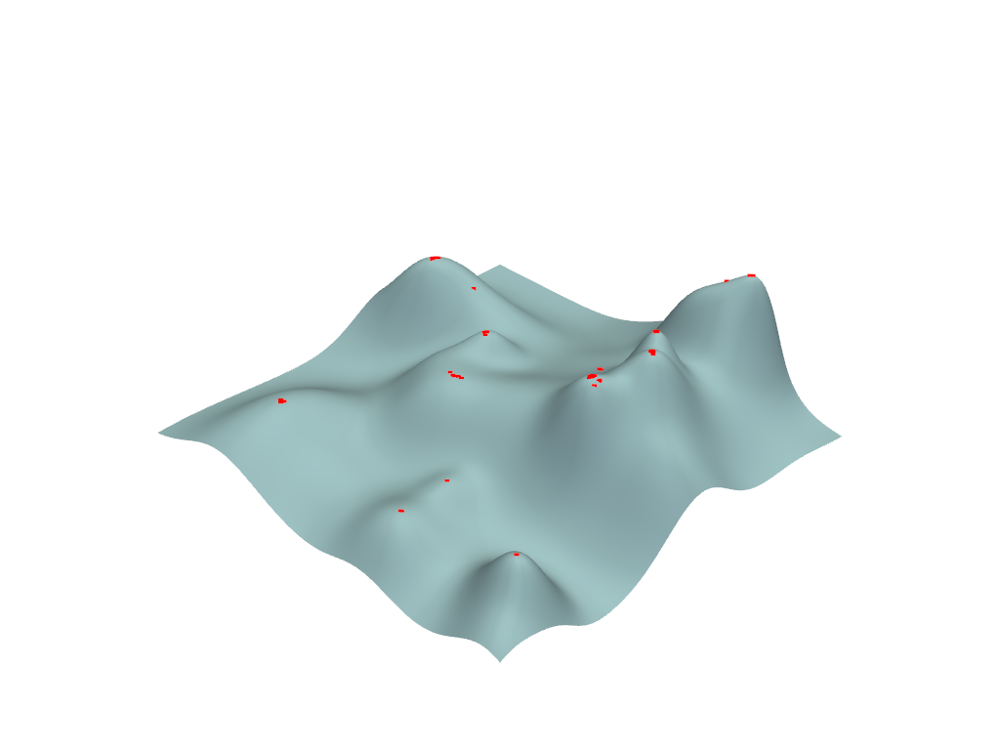

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


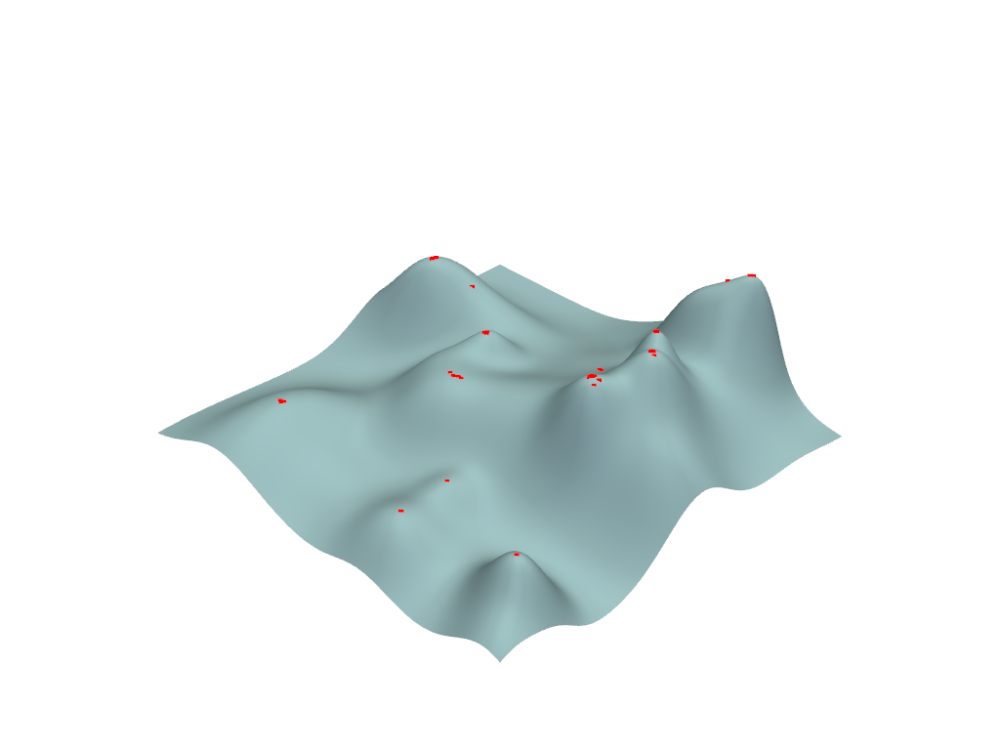

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


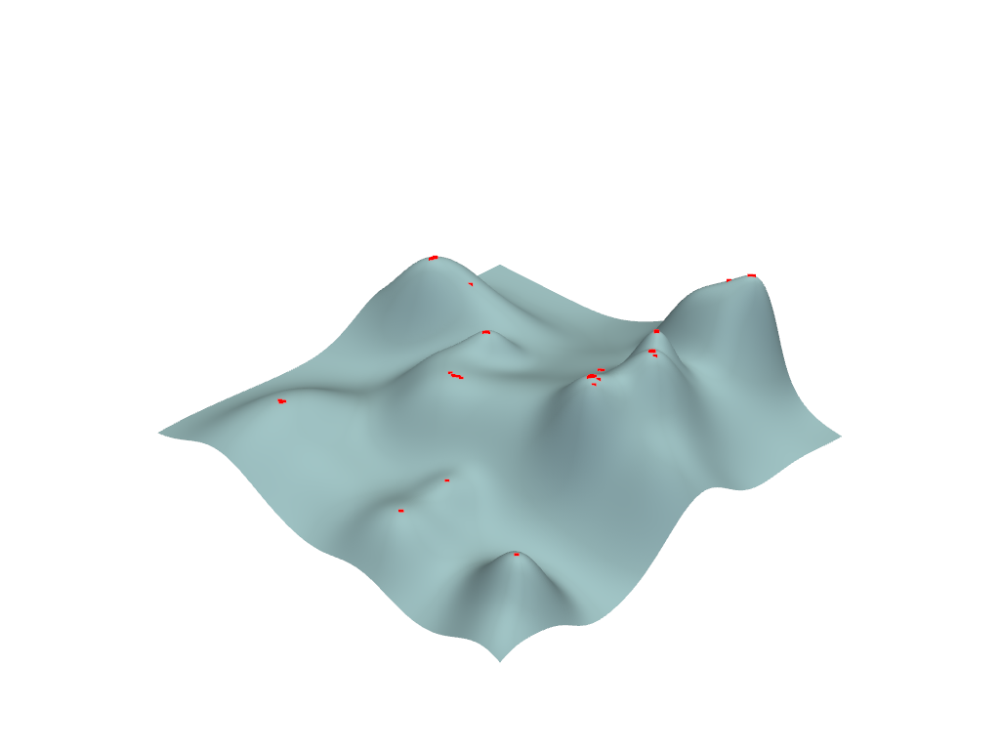

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


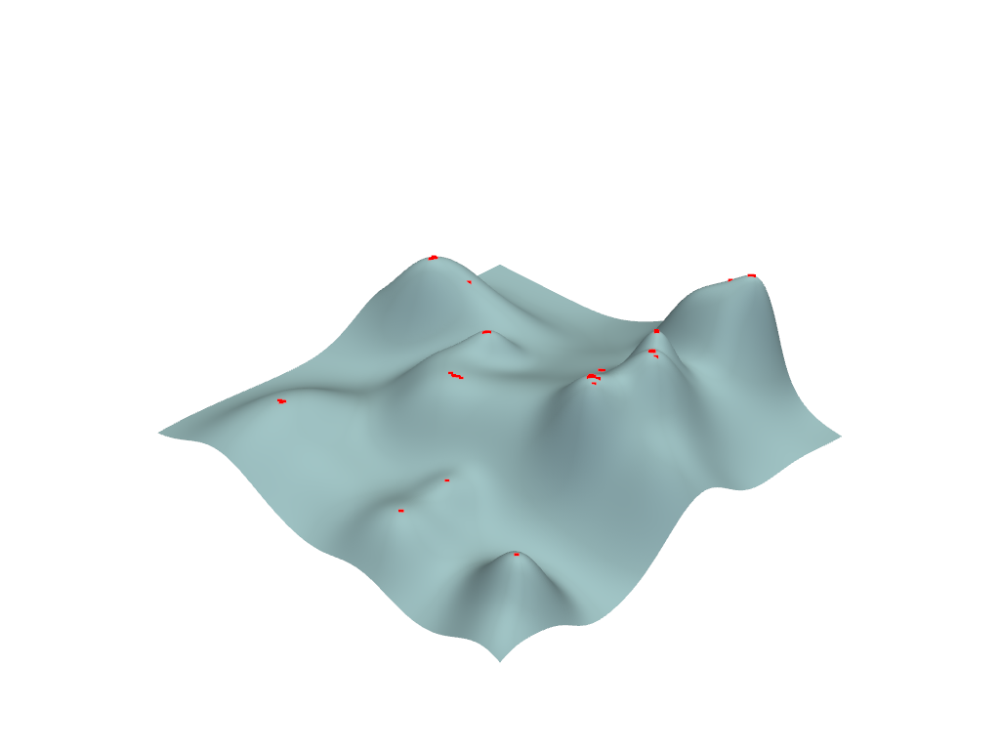

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


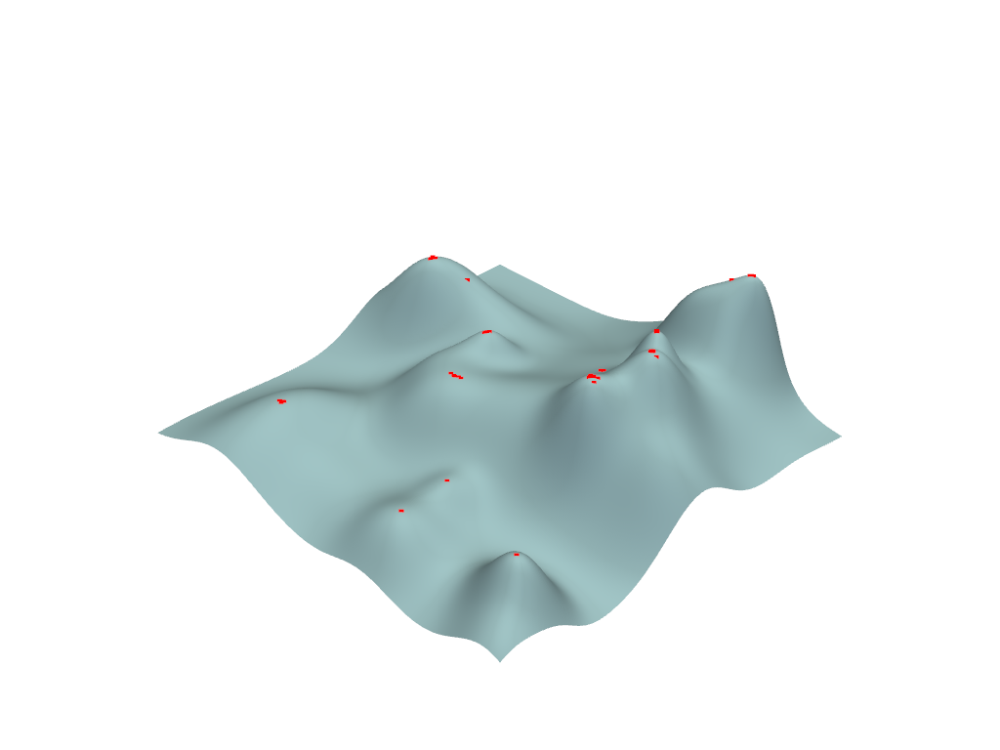

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


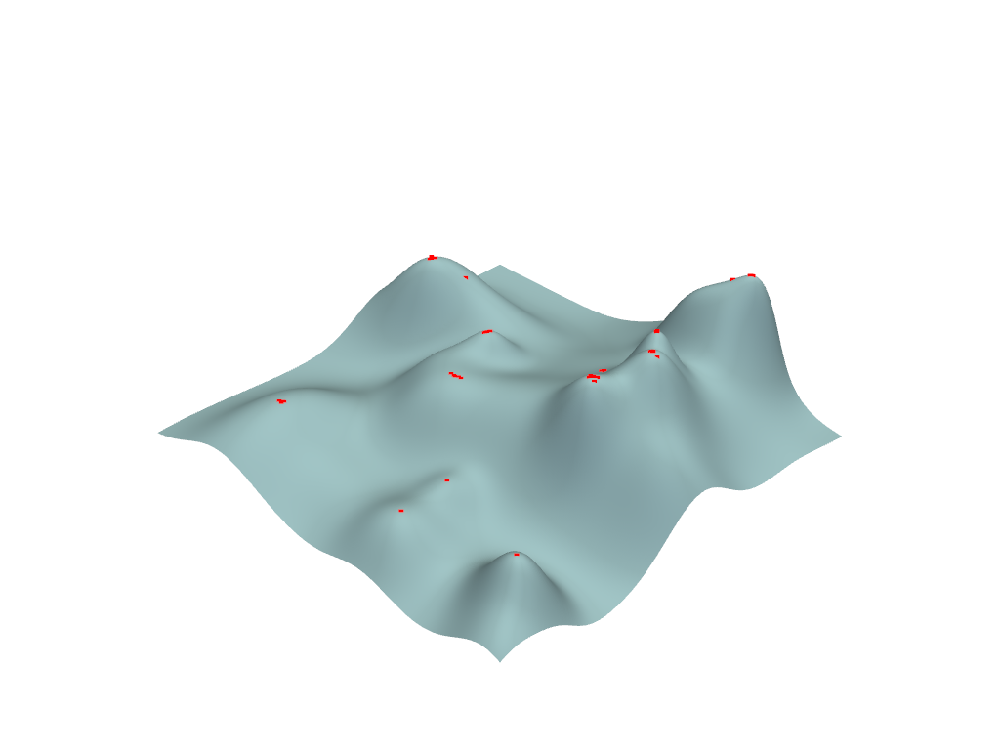

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


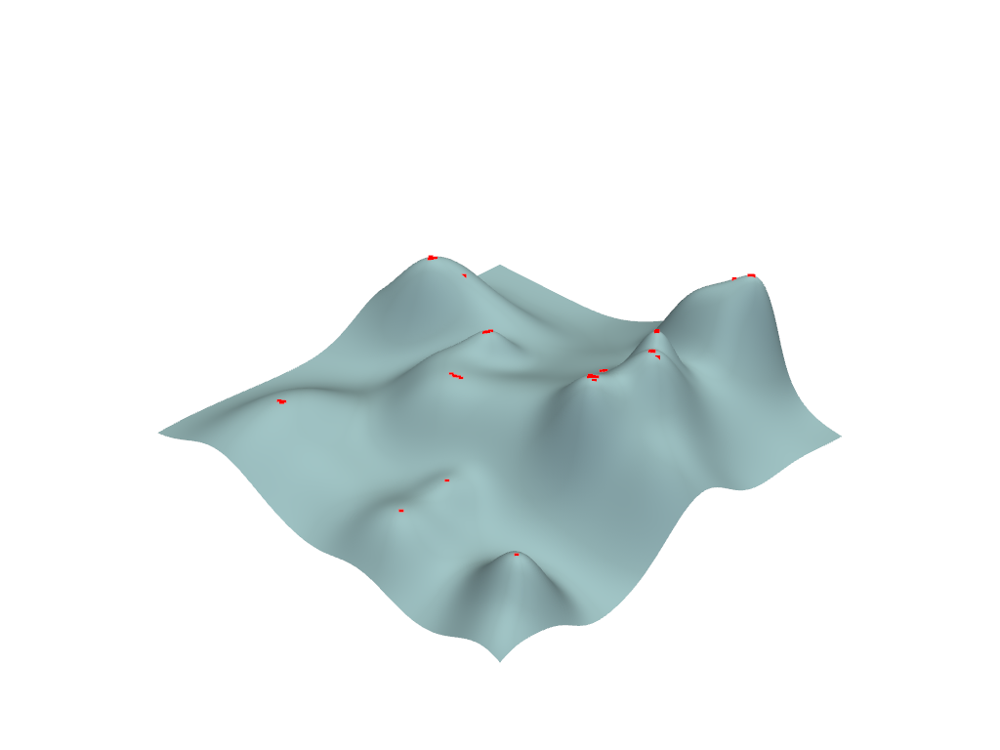

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


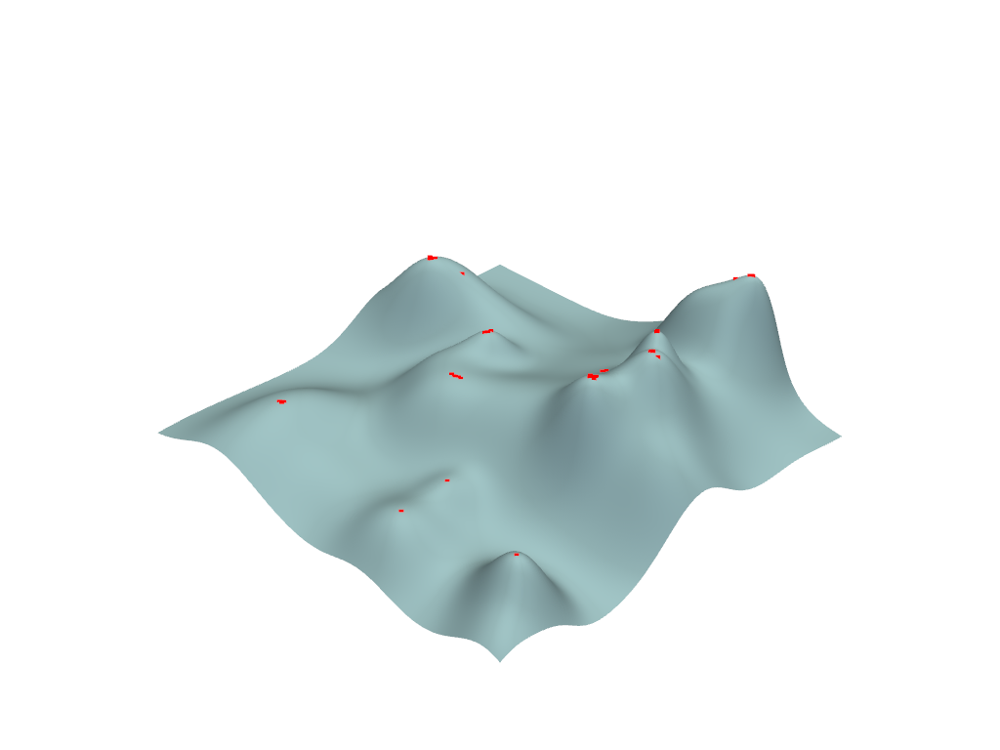

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(
Context leak detected, msgtracer returned -1


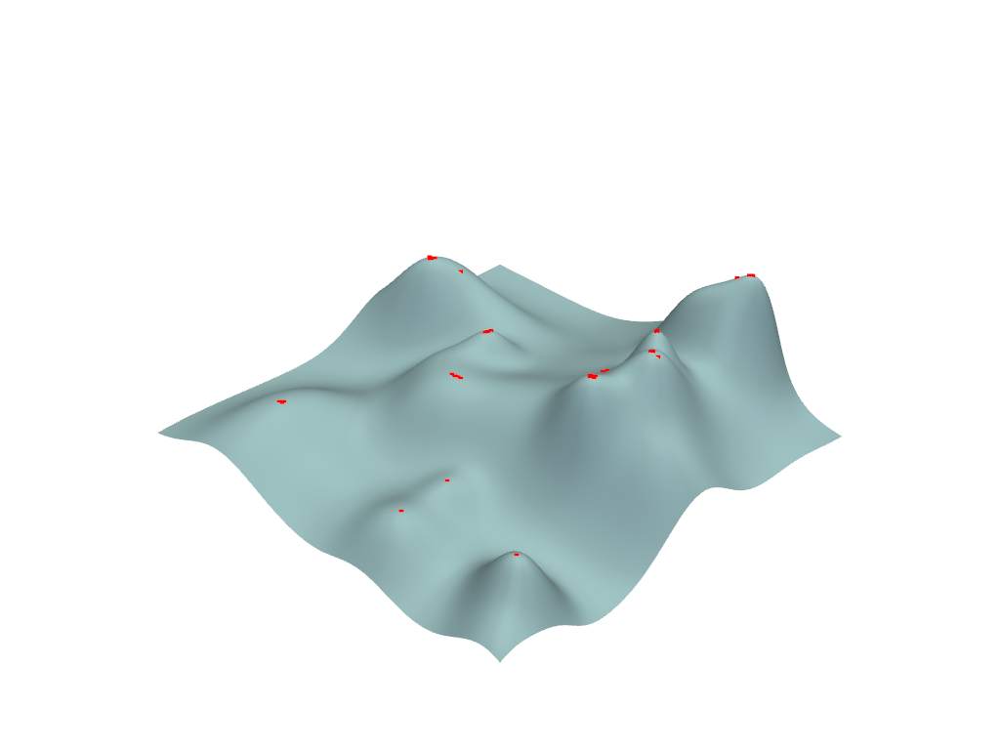

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


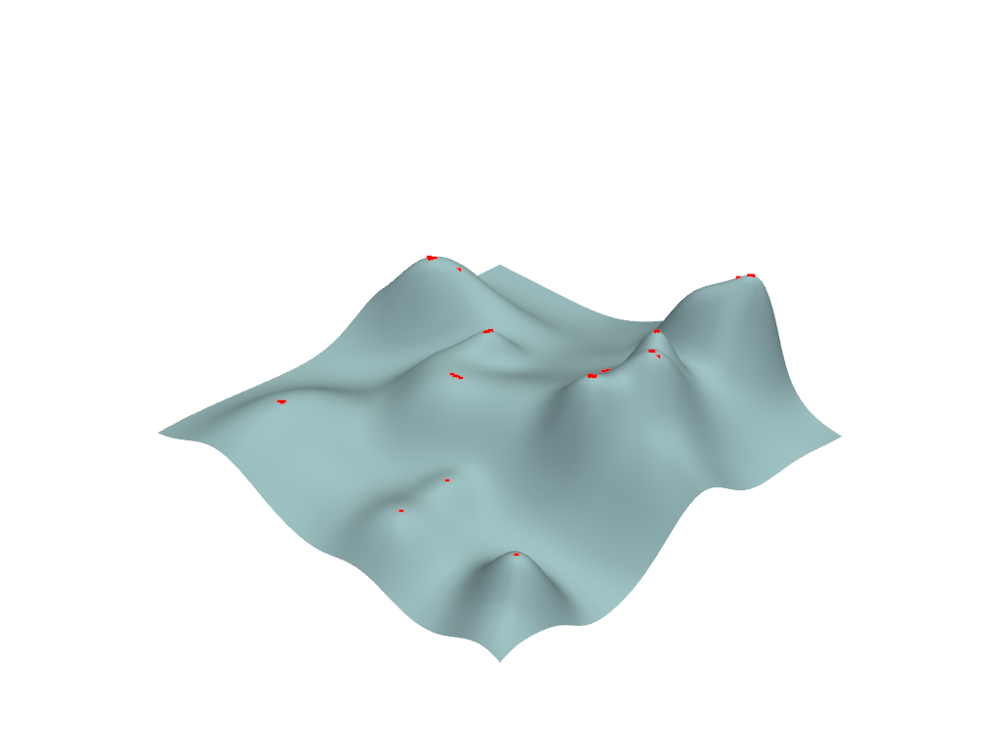

/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:34: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/mkalai/miniconda3/envs/dev/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


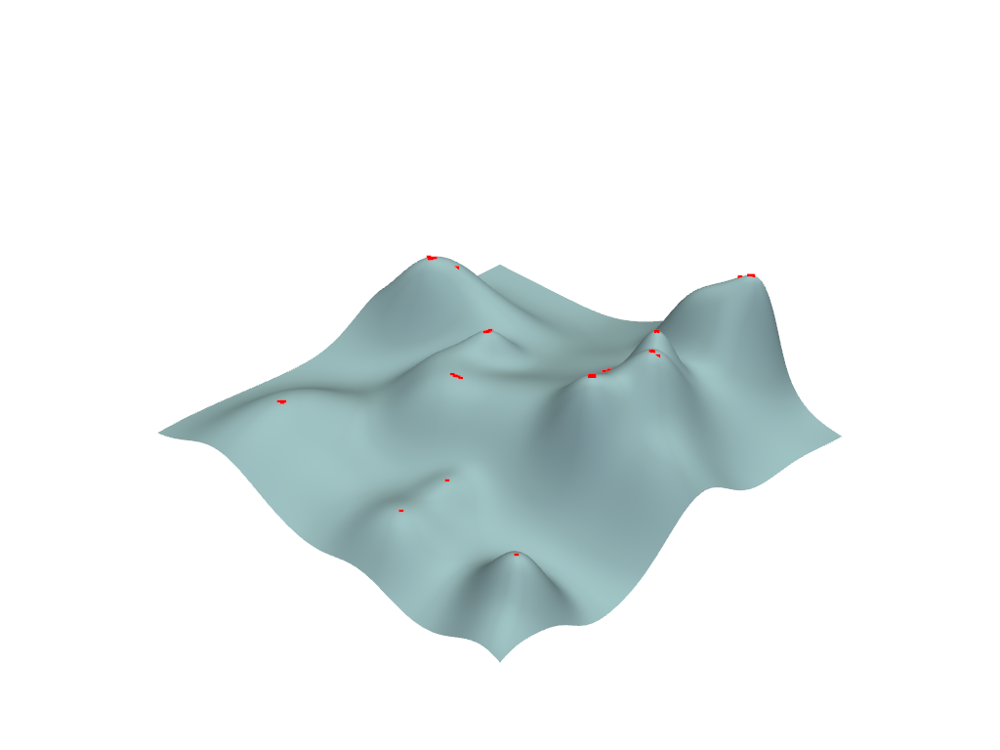

In [9]:
inputs_x = tf.Variable(tf.random.uniform([100,1], -lim, lim, dtype=tf.float32))
inputs_y = tf.Variable(tf.random.uniform([100,1], -lim, lim, dtype=tf.float32))
images = []
# Perform optimization
for _ in tqdm(range(100)):
    with tf.GradientTape() as tape:
        z = hills(inputs_x, inputs_y)
        loss = -z
        
    pts = np.hstack([inputs_x.numpy(), inputs_y.numpy(), z.numpy()])
    pts = pts[np.logical_and(
        (np.logical_and(pts[:,0] < lim, pts[:,0] > -lim)), 
        (np.logical_and(pts[:,1] < lim, pts[:,1] > -lim))
    )]
    pts = pv.PolyData(pts)
    p = pv.Plotter(off_screen=True)
    p.add_mesh(grid)
    p.add_mesh(pts, color="red")
    img = p.show(return_img=True)
    images.append(img)
    
    gradients = tape.gradient(loss, [inputs_x, inputs_y])
    optimizer.apply_gradients(zip(gradients, [inputs_x, inputs_y]))
    
imageio.mimsave("optim.gif", images)

In [42]:
class HillsProblem(FloatProblem):
    def __init__(self):
        super(HillsProblem, self).__init__()
        self.number_of_variables = 2
        self.__number_of_objectives = 1
        self.__number_of_constraints = 0

        self.lower_bound = [-lim, -lim]
        self.upper_bound = [lim, lim]

    def evaluate(self, solution: FloatSolution) -> FloatSolution:
        x = tf.constant([[solution.variables[0]]])
        y = tf.constant([[solution.variables[1]]])
        fitness = -hills(x, y)
        solution.objectives[0] = fitness.numpy()[0]
        return solution
    
    def create_solution(self) -> FloatSolution:
        new_solution = FloatSolution(
            self.lower_bound,
            self.upper_bound,
            self.number_of_objectives,
            self.number_of_constraints)
        new_solution.variables = [
            random.uniform(
                self.lower_bound[i]*1.0, self.upper_bound[i]*1.0
            ) for i in range(self.number_of_variables)
        ]

        return new_solution

    #def get_name(self) -> str:
    #    return self.name
    
    @property
    def name(self) -> str:
        return self.__name
    
    @name.setter
    def name(self, name):
        self.__name = name
    
    @property
    def number_of_objectives(self) -> int:
        return self.__number_of_objectives
    
    @number_of_objectives.setter
    def number_of_objectives(self, number_of_objectives):
        self.__number_of_objectives = number_of_objectives
    
    @property
    def number_of_constraints(self) -> int:
        return self.__number_of_constraints
    
    @number_of_constraints.setter
    def number_of_constraints(self, number_of_constraints):
        self.__number_of_constraints = number_of_constraints

In [62]:
class SolutionListObserver:
    def __init__(self):
        self.solutions = []

    def update(self, *args, **kwargs):
        solutions = kwargs["SOLUTIONS"]
        self.solutions.extend(solutions)

In [63]:
problem = HillsProblem()
algorithm = NSGAII(
    problem=problem,
    population_size=100,
    offspring_population_size=100,
    mutation=PolynomialMutation(probability=1.0 / problem.number_of_variables, distribution_index=20),
    crossover=SBXCrossover(probability=1.0, distribution_index=20),
    termination_criterion=StoppingByEvaluations(max_evaluations=max_evaluations)
)

In [64]:
# Create an observer to track progress
progress_observer = ProgressBarObserver(max=max_evaluations)

# Create our custom observer to store intermediate solutions
solution_observer = SolutionListObserver()

# Add the observers to the algorithm
algorithm.observable.register(progress_observer)
algorithm.observable.register(solution_observer)

# Run the algorithm
algorithm.run()

# Retrieve and analyze the results
final_solutions = algorithm.get_result()

# Retrieve the intermediate solutions
intermediate_solutions = solution_observer.solutions

# Save intermediate solutions to a file for later inspection
with open('intermediate_solutions.txt', 'w') as f:
    for solution in intermediate_solutions:
        f.write(f'X: {solution.variables[0]}, Y: {solution.variables[1]}, Fitness: {solution.objectives[0]}\n')

# Print final solutions
for solution in final_solutions:
    print(f'X: {solution.variables[0]}, Y: {solution.variables[1]}, Fitness: {solution.objectives[0]}')

[2024-03-17 17:59:27,112] [jmetal.core.algorithm] [DEBUG] Creating initial set of solutions...
[2024-03-17 17:59:27,116] [jmetal.core.algorithm] [DEBUG] Evaluating solutions...
[2024-03-17 17:59:27,169] [jmetal.core.algorithm] [DEBUG] Initializing progress...
Progress: 100%|#########################| 2500/2500 [00:00<00:00, 3071.07it/s]
[2024-03-17 17:59:27,985] [jmetal.core.algorithm] [DEBUG] Finished!


X: 4.999999955478673, Y: 0.32861999995557534, Fitness: [0.18312362]
X: 4.999999467426144, Y: 0.3289554318528822, Fitness: [0.18312378]
X: 4.999997711521296, Y: 0.3286851001151498, Fitness: [0.18312405]
X: 4.999996923197192, Y: 0.32865573705595064, Fitness: [0.18312418]
X: 4.999995534436919, Y: 0.3289554318528822, Fitness: [0.18312456]
X: 4.999989938272467, Y: 0.32865573705595064, Fitness: [0.18312556]
X: 4.9999999267380835, Y: 0.3241933288446241, Fitness: [0.1831266]
X: 4.999998597929109, Y: 0.32433794634801694, Fitness: [0.18312669]
X: 4.999997496631083, Y: 0.32433794634801694, Fitness: [0.18312684]
X: 4.999996922193023, Y: 0.32433794634801694, Fitness: [0.18312691]
X: 4.999996946366128, Y: 0.32427945112531426, Fitness: [0.18312705]
X: 4.999999580929749, Y: 0.3239478711010945, Fitness: [0.18312708]
X: 4.999996879500224, Y: 0.3241933288446241, Fitness: [0.18312721]
X: 4.999997496631083, Y: 0.32399222324020094, Fitness: [0.18312739]
X: 4.999999476969263, Y: 0.3235674414570569, Fitness: 

In [53]:
final_solutions[-1].variables

[4.999999196495322, 0.32464496821474464]

In [54]:
len(final_solutions)

100